### To check if GPU exist for pytorch functions

In [ ]:
# import sys, sklearn

# # Python version
# print("Python:", sys.version)

# # scikit-learn version
# print("scikit-learn:", sklearn.__version__)


In [ ]:
# !pip install --upgrade scipy scikit-learn matplotlib seaborn

### Libraries

In [2]:
import tensorflow as tf
import numpy as np
print(f"TensorFlow: {tf.__version__}")
print(f"NumPy: {np.__version__}")

TensorFlow: 2.20.0
NumPy: 2.2.6


In [1]:
#Import all libraries
import random
import warnings
import datetime
import math
import torch
import gpytorch
import sys
import os
import time
import logging
import urllib.request
import os.path
import seaborn as sns
# import gpflow
import tensorflow as tf
import pandas as pd
import numpy as np
import regex as re
import matplotlib.pyplot as plt
import gc
import tqdm
import sklearn
import copy
import properscoring as ps


# General libraries
from matplotlib import pyplot as plt
from random import randrange,sample,randint
from sklearn.linear_model import LinearRegression
from tqdm import tqdm
from drs import drs
from scipy import linalg
from scipy.io import loadmat
from time import time
from math import floor  
from torch import nn, optim
from torch.autograd import Variable
from math import exp, pi
# from gpflow.utilities import print_summary
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder,LabelEncoder,PowerTransformer, MinMaxScaler, RobustScaler
from sklearn.model_selection import KFold, cross_val_predict, train_test_split,GridSearchCV,cross_val_score, learning_curve
from sklearn.pipeline import make_pipeline
# pip install -U scikit-learn
# Used to split data into training and test data
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import(RBF, Matern, RationalQuadratic,ExpSineSquared, DotProduct,ConstantKernel, WhiteKernel)


#Sklearn Libraries
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.style as style
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RANSACRegressor
from sklearn.linear_model import Ridge
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import RANSACRegressor
from sklearn.neural_network import MLPRegressor
from sklearn import tree
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.feature_selection import SelectKBest,SelectPercentile,f_classif,f_regression,mutual_info_regression,mutual_info_classif,SelectFromModel,RFE
from sklearn.svm import SVR
import xgboost as xgb
from xgboost import plot_importance
import xgboost
from xgboost import XGBRegressor
import lightgbm as lgb

## ANN LIBRARY
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Activation, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
# Multiple math functions
from tensorflow import math
from tensorflow.keras.utils import plot_model
#from tensorflow.python.keras.wrappers.scikit_learn import KerasRegressor

from sklearn import metrics
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

#Added Torch Libraries
from torch.distributions.transformed_distribution import TransformedDistribution
from torch.distributions.transforms import SigmoidTransform, PowerTransform
from torch.distributions.normal import Normal
from IPython.display import display, HTML

# Optimisation Libaries
from scipy.optimize import LinearConstraint, minimize
from scipy.optimize import NonlinearConstraint
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Optimisation libraries
# ## Optimisation for the Paper 2 - Yarranung Dataset with (NSGA II)
import csv
import re
import time
import joblib
import warnings
import numpy as np
import pandas as pd
from sklearn import metrics
from itertools import product
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from pymoo.optimize import minimize
from pymoo.termination import get_termination
from sklearn.compose import ColumnTransformer
from pymoo.visualization.scatter import Scatter
from pymoo.algorithms.moo.nsga2 import NSGA2
from sklearn.model_selection import GridSearchCV, KFold
from pymoo.core.problem import ElementwiseProblem
from sklearn.gaussian_process import GaussianProcessRegressor
from pymoo.operators.sampling.rnd import FloatRandomSampling
from pymoo.operators.crossover.sbx import SimulatedBinaryCrossover
from pymoo.operators.mutation.pm import PolynomialMutation
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import make_scorer, mean_squared_error, mean_squared_log_error, r2_score



#Visulaisation
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Set pandas options to display full column contents
pd.set_option('display.max_colwidth', None)  # Allow columns to display full width

warnings.filterwarnings('ignore')

### Load All neccessary data

### Farm Info

In [3]:
import pandas as pd
# Load the Excel file
excel_file = 'Farm Information.xlsx'  # Replace with your Excel file path
farm_info = pd.read_excel(excel_file)

### Paddock Information

In [4]:
import pandas as pd
# Load the Excel file
excel_file = 'lat_lon_paddock level.xlsx'  # Replace with your Excel file path
paddock_information = pd.read_excel(excel_file)

### Padddocks monitored for each farm

In [5]:
# apps_biomass_data = pd.read_csv(r"data/")
# apps_pasture_quality = pd.read_csv(r"data/")
padmonitored = pd.read_excel(r"data/")
# # Convert the 'pcode' column in padmonitored to object dtype (or string)
# padmonitored["pcode"] = padmonitored["pcode"].astype(object)
# or, if you want to enforce string type:
padmonitored["pcode"] = padmonitored["pcode"].astype(str)

# Verify the conversion
print(padmonitored["pcode"].dtype)

object


### Load all the data in the processed data, aggregations and Modelling Folders

In [6]:
import os
import glob
import pandas as pd

def load_files_from_folders(folders, patterns):
    """
    Loads files from one or more specified folders that match any of the glob patterns provided.
    
    For each file:
      - If it is a CSV file, it is loaded with pd.read_csv.
      - If it is an Excel file (.xls or .xlsx), it is loaded with pd.read_excel.
      - If it is an SVG file, the file content is read as text.
      - For other file types, the file path is stored.
    
    Additionally, if a loaded DataFrame contains a column named "Date", it is converted to datetime.
    
    Parameters:
        folders (list): List of folder paths to search.
        patterns (list): List of glob patterns (e.g., ["*.csv", "*.xlsx", "*.svg"]).
    
    Returns:
        dict: A dictionary where keys are file identifiers (folder_basename + "_" + file base name)
              and values are:
              - For CSV/Excel: a DataFrame (with "Date" converted if present),
              - For SVG: a string (file content),
              - Otherwise: the file path.
              
    Also, each loaded file is assigned as a global variable using its base file name.
    """
    loaded_files = {}
    
    for folder in folders:
        if not os.path.isdir(folder):
            print(f"Folder '{folder}' does not exist. Skipping.")
            continue
        for pattern in patterns:
            filepaths = glob.glob(os.path.join(folder, pattern))
            for fp in filepaths:
                base_name = os.path.splitext(os.path.basename(fp))[0]
                # Construct a key by combining folder basename and file base name for dictionary storage.
                key = f"{os.path.basename(folder)}_{base_name}"
                ext = os.path.splitext(fp)[1].lower()
                try:
                    if ext == '.csv':
                        df = pd.read_csv(fp)
                        if "Date" in df.columns:
                            df["Date"] = pd.to_datetime(df["Date"], errors='coerce')
                        loaded_files[key] = df
                        # Assign global variable using the base name (overwriting if already exists).
                        _assign_global(base_name, df)
                        print(f"Loaded CSV: {key} with shape {df.shape}")
                    elif ext in ['.xls', '.xlsx']:
                        if ext == '.xlsx':
                            df = pd.read_excel(fp, engine='openpyxl')
                        else:
                            df = pd.read_excel(fp, engine='xlrd')
                        if "Date" in df.columns:
                            df["Date"] = pd.to_datetime(df["Date"], errors='coerce')
                        loaded_files[key] = df
                        _assign_global(base_name, df)
                        print(f"Loaded Excel: {key} with shape {df.shape}")
                    elif ext == '.svg':
                        with open(fp, 'r', encoding='utf-8') as f:
                            content = f.read()
                        loaded_files[key] = content
                        _assign_global(base_name, content)
                        print(f"Loaded SVG: {key}")
                    else:
                        loaded_files[key] = fp
                        _assign_global(base_name, fp)
                        print(f"Stored file path for {key} (type: {ext})")
                except Exception as e:
                    print(f"Error loading {fp}: {e}")
    return loaded_files

def _assign_global(base_name, obj):
    """
    Assigns the object `obj` to a global variable with name `base_name`.
    Unlike the previous version, this function now always uses the base name
    (overwriting any existing global variable with that name) and does not add a suffix.
    """
    globals()[base_name] = obj
    print(f"Assigned global variable: {base_name}")

# Example usage:
folders_to_load = ["modelling_results", "processed_data"]
file_patterns = ["*.csv", "*.xlsx"]

loaded_files = load_files_from_folders(folders_to_load, file_patterns)

print("\nFiles loaded from specified folders:")
for name, content in loaded_files.items():
    print(f"{name}: {type(content)}")

Assigned global variable: interp_vs_pio
Loaded CSV: modelling_results_interp_vs_pio with shape (605, 52)
Assigned global variable: interp_vs_pio_test
Loaded CSV: modelling_results_interp_vs_pio_test with shape (1168, 52)
Assigned global variable: mq_vs_pio
Loaded CSV: modelling_results_mq_vs_pio with shape (5817, 5)
Assigned global variable: seed_sweep_summary
Loaded CSV: modelling_results_seed_sweep_summary with shape (15, 6)
Assigned global variable: All_the_Bands_Alone_without_Indices_and_without_Weather_Data_Non_interpolated_summary
Loaded Excel: modelling_results_All_the_Bands_Alone_without_Indices_and_without_Weather_Data_Non_interpolated_summary with shape (8, 6)
Assigned global variable: All_the_Bands_with_Indices_without_Weather_Data_Non_interpolated_summary
Loaded Excel: modelling_results_All_the_Bands_with_Indices_without_Weather_Data_Non_interpolated_summary with shape (8, 6)
Assigned global variable: All_the_Bands_with_Weather_Data_without_Indices_k_summary
Loaded Excel: m

### Separate the Validation Sets

In [ ]:
# # Install dependencies first
# !pip install --break-system-packages shapely pyproj
# !pip install --break-system-packages cartopy

# # # If it fails, try:
# # pip install --break-system-packages cartopy --no-binary cartopy

In [10]:
paddock_information.columns

Index(['Farm Code', 'Farm Name', 'pcode', 'Paddock_lon', 'Paddock_lat'], dtype='object')

In [8]:
d_model_new.columns

Index(['Farm Code', 'pcode', 'Date', 'FarmName', 'pname_pm', 'pname_s',
       'WalkAverage', 'RawReading', 'remote_cover', 'FarmResidualSetting',
       'Week', 'Season', 'Year', 'T.Max', 'Smx', 'T.Min', 'Smn', 'Rain', 'Srn',
       'Evap', 'Sev', 'Radn', 'Ssl', 'VP', 'Svp', 'RHmaxT', 'RHminT', 'FAO56',
       'StationName', 'Region', 'Weatherstation', 'blue', 'green', 'red',
       'nir', 'rededge1', 'rededge2', 'rededge3', 'swir2', 'swir3', 'ndvi',
       'evi', 'savi', 'ndre', 'date_matched', 'was_aggregated', 'grazed',
       'grazing', 'is_grazed', 'Rain intensity', 'Rainfall', 'avg_T', 'RH_avg',
       'RH_class', 'RH_group', 'pcode_area'],
      dtype='object')

### Geographic Map for paper 3

In [13]:
paddock_information["Farm Code"].nunique()

16

✓ Cartopy available - using geographical maps

DATA LOADING AND DIAGNOSTICS

1. Initial study paddocks from d_model_new:
   Total unique farm-paddock combinations: 80
   Total unique farms: 16

   ACTUAL REGION AND FARM NAMES IN DATA:
Region
Mid Coast      7
North Coast    4
South Coast    5
Name: Farm Code, dtype: int64

   Farms per region:
   Mid Coast: ['Bale', 'Corstorphine', 'Jneal', 'Neal', 'Neilson', 'Nicholson', 'Tocal']
   North Coast: ['Behrens', 'Clarke', 'Gould', 'Tonge']
   South Coast: ['Apps', 'Game', 'Holmes', 'Russell', 'Ryan']

2. After merge with paddock_information:
   Total records: 80
   Records with coordinates: 52
   Records missing coordinates: 28

3. Regional coordinate averages:
   South Coast: Lon=149.79±0.08, Lat=-36.72±0.06
   Mid Coast: Lon=152.38±0.58, Lat=-32.07±0.64
   North Coast: Lon=152.94±0.03, Lat=-28.75±0.06
   ℹ️ Filled coordinates for Farm Clarke using North Coast regional average
   ℹ️ Filled coordinates for Farm Clarke using North Coast regi

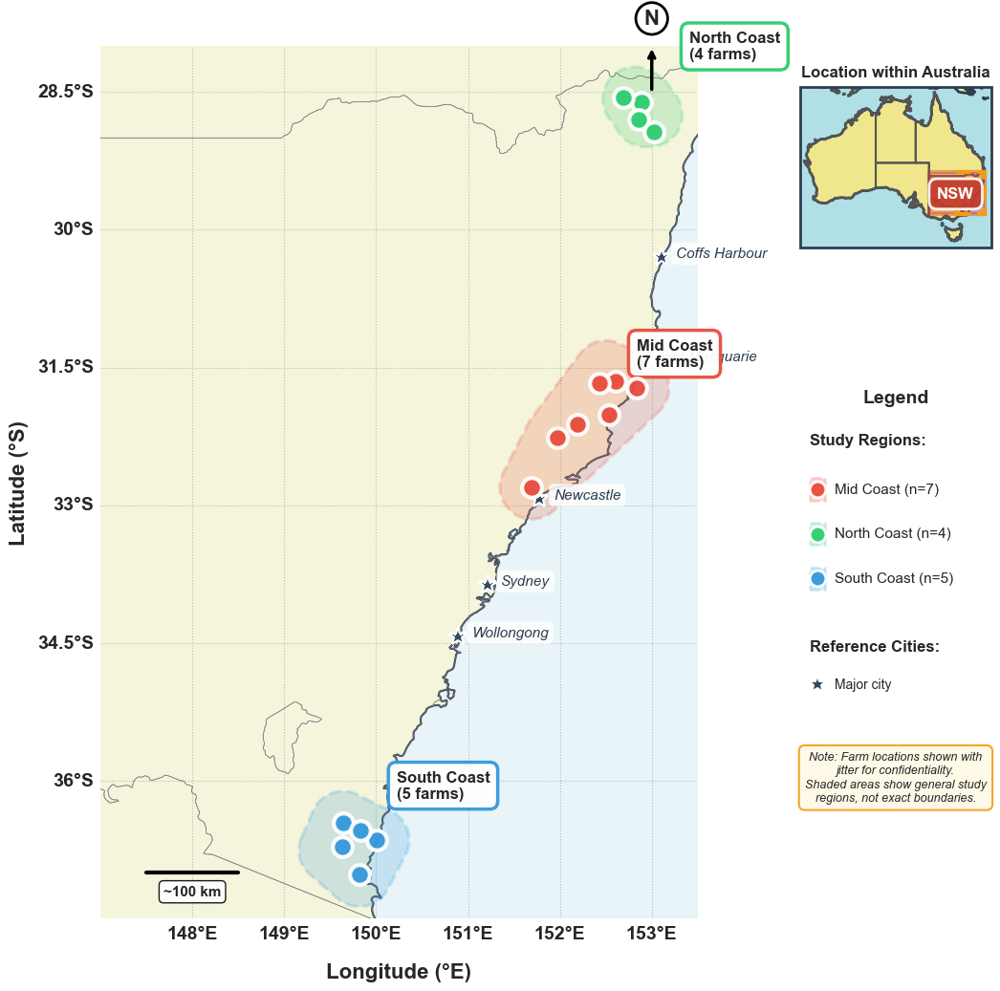

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings('ignore')

# Try to import cartopy for proper maps
try:
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
    HAS_CARTOPY = True
    print("✓ Cartopy available - using geographical maps")
except ImportError:
    HAS_CARTOPY = False
    print("⚠️ Cartopy not available - using basic axes")

from shapely.geometry import Point, Polygon
from scipy.spatial import ConvexHull

# ------------------------------
# Matplotlib styling
# ------------------------------
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['xtick.labelsize'] = 13
plt.rcParams['ytick.labelsize'] = 13
plt.rcParams['legend.fontsize'] = 11
plt.rcParams['figure.titlesize'] = 18

# ============================================================================
# STEP 1: Load and prepare data with diagnostics
# (expects d_model_new and paddock_information already in memory)
# ============================================================================

print("\n" + "="*70)
print("DATA LOADING AND DIAGNOSTICS")
print("="*70)

# Unique paddocks used in the study
study_paddocks = d_model_new[['Farm Code', 'pcode', 'Region']].drop_duplicates()

print(f"\n1. Initial study paddocks from d_model_new:")
print(f"   Total unique farm-paddock combinations: {len(study_paddocks)}")
print(f"   Total unique farms: {study_paddocks['Farm Code'].nunique()}")

# Region-farm distribution
print(f"\n   ACTUAL REGION AND FARM NAMES IN DATA:")
print(d_model_new.groupby("Region")["Farm Code"].nunique())
print("\n   Farms per region:")
for region in sorted(d_model_new["Region"].unique()):
    farms = sorted(d_model_new[d_model_new["Region"] == region]["Farm Code"].unique())
    print(f"   {region}: {farms}")

# Merge paddock long/lat
study_locations = study_paddocks.merge(
    paddock_information[['Farm Code', 'pcode', 'Paddock_lon', 'Paddock_lat']],
    on=['Farm Code', 'pcode'],
    how='left'
)

print(f"\n2. After merge with paddock_information:")
print(f"   Total records: {len(study_locations)}")
print(f"   Records with coordinates: {study_locations[['Paddock_lon', 'Paddock_lat']].notna().all(axis=1).sum()}")
print(f"   Records missing coordinates: {study_locations[['Paddock_lon', 'Paddock_lat']].isna().any(axis=1).sum()}")

# ============================================================================
# STEP 2: Handle missing coordinates using regional averages
# ============================================================================

regional_coords = {}
for region in study_locations['Region'].dropna().unique():
    region_data = study_locations[
        (study_locations['Region'] == region) &
        (study_locations[['Paddock_lon', 'Paddock_lat']].notna().all(axis=1))
    ]
    if len(region_data) > 0:
        regional_coords[region] = {
            'lon': region_data['Paddock_lon'].mean(),
            'lat': region_data['Paddock_lat'].mean(),
            'lon_std': region_data['Paddock_lon'].std(),
            'lat_std': region_data['Paddock_lat'].std()
        }

print(f"\n3. Regional coordinate averages:")
for region, coords in regional_coords.items():
    print(f"   {region}: Lon={coords['lon']:.2f}±{(coords['lon_std'] or 0):.2f}, "
          f"Lat={coords['lat']:.2f}±{(coords['lat_std'] or 0):.2f}")

# Fill missing coordinates with regional averages + random offset
rng = np.random.default_rng(42)
for idx, row in study_locations.iterrows():
    if pd.isna(row['Paddock_lon']) or pd.isna(row['Paddock_lat']):
        region = row['Region']
        if region in regional_coords:
            offset_scale = 0.3
            study_locations.at[idx, 'Paddock_lon'] = regional_coords[region]['lon'] + rng.uniform(-offset_scale, offset_scale)
            study_locations.at[idx, 'Paddock_lat'] = regional_coords[region]['lat'] + rng.uniform(-offset_scale, offset_scale)
            print(f"   ℹ️ Filled coordinates for Farm {row['Farm Code']} using {region} regional average")

study_locations = study_locations.drop_duplicates()

# Initial jitter to protect exact coordinates
jitter_amount = 0.40
study_locations['jittered_lon'] = study_locations['Paddock_lon'] + rng.uniform(-jitter_amount, jitter_amount, len(study_locations))
study_locations['jittered_lat'] = study_locations['Paddock_lat'] + rng.uniform(-jitter_amount, jitter_amount, len(study_locations))

# ============================================================================
# STEP 3: Aggregate to FARM LEVEL (one point per farm) + fill farms without coords
# ============================================================================

print(f"\n4. Checking coordinate coverage:")
farms_with_coords = study_locations[study_locations[['Paddock_lon', 'Paddock_lat']].notna().all(axis=1)]['Farm Code'].unique()
all_farms = study_locations['Farm Code'].unique()
print(f"   Total farms in data: {len(all_farms)}")
print(f"   Farms with coordinates: {len(farms_with_coords)}")

missing_farms = set(all_farms) - set(farms_with_coords)
if missing_farms:
    print(f"   ⚠️ WARNING: {len(missing_farms)} farms have NO coordinates!")
    print(f"   Missing farms: {sorted(list(missing_farms))}")
    for farm_code in missing_farms:
        farm_region = study_locations.loc[study_locations['Farm Code'] == farm_code, 'Region'].iloc[0]
        if farm_region in regional_coords:
            print(f"   → Assigning regional average coordinates to Farm '{farm_code}' ({farm_region})")
            offset = rng.uniform(-0.2, 0.2)
            study_locations.loc[study_locations['Farm Code'] == farm_code, 'Paddock_lon'] = regional_coords[farm_region]['lon'] + offset
            study_locations.loc[study_locations['Farm Code'] == farm_code, 'Paddock_lat'] = regional_coords[farm_region]['lat'] + offset
            study_locations.loc[study_locations['Farm Code'] == farm_code, 'jittered_lon'] = regional_coords[farm_region]['lon'] + offset + rng.uniform(-jitter_amount, jitter_amount)
            study_locations.loc[study_locations['Farm Code'] == farm_code, 'jittered_lat'] = regional_coords[farm_region]['lat'] + offset + rng.uniform(-jitter_amount, jitter_amount)

# Farm-level average of jittered coordinates
farm_locations = study_locations.groupby(['Farm Code', 'Region'], as_index=False).agg(
    jittered_lon=('jittered_lon', 'mean'),
    jittered_lat=('jittered_lat', 'mean')
)

# Small extra spread
extra_spread = 0.15
farm_locations['jittered_lon'] += rng.uniform(-extra_spread, extra_spread, len(farm_locations))
farm_locations['jittered_lat'] += rng.uniform(-extra_spread, extra_spread, len(farm_locations))

print(f"\n5. Farm-level data for plotting:")
print(f"   Total farms to plot: {len(farm_locations)}")
print(f"\n   DETAILED FARM COUNT BY REGION:")
for region in sorted(farm_locations['Region'].dropna().unique()):
    region_farms = farm_locations[farm_locations['Region'] == region]
    n_farms = len(region_farms)
    farm_names = sorted(region_farms['Farm Code'].tolist())
    print(f"   {region}: {n_farms} farms - {farm_names}")

# (Optional) Verification target counts
expected_counts = {"Mid Coast": 7, "North Coast": 4, "South Coast": 5}
print(f"\n   VERIFICATION:")
all_match = True
for region, expected in expected_counts.items():
    actual = len(farm_locations[farm_locations['Region'] == region])
    match = "✓" if actual == expected else "✗"
    print(f"   {match} {region}: Expected {expected}, Got {actual}")
    if actual != expected:
        all_match = False
if all_match and len(farm_locations) == 16:
    print(f"\n   ✓ SUCCESS: All 16 farms accounted for with correct distribution!")
else:
    print(f"\n   ⚠️ WARNING: Farm counts don't match expectations!")

# ============================================================================
# STEP 4: Colors
# ============================================================================
print(f"\n6. Setting up colors for regions:")
region_colors = {
    'Mid Coast':  '#E74C3C',  # Red
    'North Coast':'#2ECC71',  # Green
    'South Coast':'#3498DB'   # Blue
}
for region, color in region_colors.items():
    print(f"   {region}: {color}")

# ============================================================================
# STEP 5: Regional polygons (slightly bigger)
# ============================================================================
def create_regional_polygon(lons, lats, buffer=0.35):
    """Convex hull polygon (or circular buffer for <3 points) with buffer deg."""
    if len(lons) < 3:
        center_lon, center_lat = np.mean(lons), np.mean(lats)
        return Point(center_lon, center_lat).buffer(buffer)
    pts = np.column_stack([lons, lats])
    hull = ConvexHull(pts)
    poly = Polygon(pts[hull.vertices])
    return poly.buffer(buffer)

regional_data = {}
for region in farm_locations['Region'].dropna().unique():
    region_farms = farm_locations[farm_locations['Region'] == region]
    region_all_paddocks = study_locations[study_locations['Region'] == region]
    regional_data[region] = {
        'centroid_lon': region_farms['jittered_lon'].mean(),
        'centroid_lat': region_farms['jittered_lat'].mean(),
        'n_farms': len(region_farms),
        'n_paddocks': len(region_all_paddocks),
        'polygon': create_regional_polygon(
            region_farms['jittered_lon'].values,
            region_farms['jittered_lat'].values,
            buffer=0.35  # increased a little
        )
    }

# ============================================================================
# STEP 6: Enforce non-overlapping farm markers (Poisson-disc style)
# ============================================================================
def enforce_min_separation(df, xcol, ycol, min_dist=0.18, max_tries=300, bounds=None, seed=123):
    """
    Sequentially adjusts points to maintain a minimum separation (in degrees).
    Works in-place on df[xcol], df[ycol]. If bounds=(minx,maxx,miny,maxy), keeps points inside.
    """
    rng_local = np.random.default_rng(seed)
    coords = df[[xcol, ycol]].to_numpy().copy()
    placed = []

    def too_close(a, b):
        dx = a[0] - b[0]
        dy = a[1] - b[1]
        return (dx*dx + dy*dy) < (min_dist*min_dist)

    for i in range(len(coords)):
        p = coords[i].copy()
        tries = 0
        while True:
            conflict = False
            for q in placed:
                if too_close(p, q):
                    conflict = True
                    break
            if not conflict:
                placed.append(p.copy())
                break
            # jitter step
            angle = rng_local.uniform(0, 2*np.pi)
            step = rng_local.uniform(min_dist*0.4, min_dist*0.8)
            p[0] += step*np.cos(angle)
            p[1] += step*np.sin(angle)

            if bounds is not None:
                minx, maxx, miny, maxy = bounds
                p[0] = np.clip(p[0], minx, maxx)
                p[1] = np.clip(p[1], miny, maxy)

            tries += 1
            if tries >= max_tries:
                placed.append(p.copy())
                break

    df[xcol] = [p[0] for p in placed]
    df[ycol] = [p[1] for p in placed]
    return df

# Apply globally so farms across different regions also respect spacing
map_extent = [147.0, 153.5, -37.5, -28.0]  # [min_lon, max_lon, min_lat, max_lat]
farm_locations = enforce_min_separation(
    farm_locations.sort_values(['Region','Farm Code']).reset_index(drop=True),
    'jittered_lon', 'jittered_lat',
    min_dist=0.18,  # tweak if you still see overlaps (0.15–0.22)
    max_tries=400,
    bounds=(map_extent[0], map_extent[1], map_extent[2], map_extent[3]),
    seed=321
)

# ============================================================================
# STEP 7: Figure and axes
# ============================================================================
fig = plt.figure(figsize=(11, 11), dpi=100)
if HAS_CARTOPY:
    # More margin so manual axis titles won't be clipped
    gs = fig.add_gridspec(3, 4, hspace=0.3, wspace=0.3,
                          left=0.08, right=0.97, top=0.95, bottom=0.12)
    ax_main = fig.add_subplot(gs[:, :3], projection=ccrs.PlateCarree())
    ax_inset = fig.add_subplot(gs[0, 3], projection=ccrs.PlateCarree())
    ax_legend = fig.add_subplot(gs[1:, 3])
    ax_legend.axis('off')
else:
    gs = fig.add_gridspec(3, 4, hspace=0.3, wspace=0.3,
                          left=0.06, right=0.97, top=0.95, bottom=0.10)
    ax_main = fig.add_subplot(gs[:, :3])
    ax_inset = fig.add_subplot(gs[0, 3])
    ax_legend = fig.add_subplot(gs[1:, 3])
    ax_legend.axis('off')

# ============================================================================
# STEP 8: Main map
# ============================================================================
if HAS_CARTOPY:
    ax_main.set_extent(map_extent, crs=ccrs.PlateCarree())
    ax_main.add_feature(cfeature.LAND, facecolor='#F5F5DC', zorder=0)
    ax_main.add_feature(cfeature.OCEAN, facecolor='#E8F4F8', zorder=0)
    ax_main.add_feature(cfeature.COASTLINE, linewidth=1.5, edgecolor='#2C3E50', zorder=1)
    ax_main.add_feature(cfeature.BORDERS, linewidth=1, linestyle=':', zorder=1)
    ax_main.add_feature(cfeature.STATES, linewidth=0.5, edgecolor='gray', zorder=1)

    # Gridliner controls the numeric tick labels
    gl = ax_main.gridlines(draw_labels=True, linestyle=':', alpha=0.5, color='gray')
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = True
    gl.left_labels = True
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 14, 'weight': 'bold'}
    gl.ylabel_style = {'size': 14, 'weight': 'bold'}

    # ---- FORCE axis titles to show (manual placement in axes coordinates) ----
    ax_main.text(0.5, -0.05, "Longitude (°E)",
                 transform=ax_main.transAxes, ha="center", va="top",
                 fontsize=16, fontweight="bold")
    ax_main.text(-0.12, 0.5, "Latitude (°S)",
                 transform=ax_main.transAxes, ha="right", va="center",
                 rotation="vertical", fontsize=16, fontweight="bold")
else:
    ax_main.set_xlim(map_extent[0], map_extent[1])
    ax_main.set_ylim(map_extent[2], map_extent[3])
    ax_main.add_patch(Rectangle((map_extent[0], map_extent[2]),
                                 map_extent[1]-map_extent[0],
                                 map_extent[3]-map_extent[2],
                                 facecolor='#E8F4F8', edgecolor='none', zorder=0))
    ax_main.grid(True, linestyle=':', alpha=0.4, color='gray', zorder=2)
    # Normal axis labels for non-Cartopy path
    ax_main.set_xlabel('Longitude (°E)', fontsize=16, fontweight='bold', labelpad=12)
    ax_main.set_ylabel('Latitude (°S)', fontsize=16, fontweight='bold', labelpad=12)

# Regional polygons (under markers)
for region, data in regional_data.items():
    color = region_colors.get(region, '#666666')
    if isinstance(data['polygon'], Polygon):
        x, y = data['polygon'].exterior.xy
        if HAS_CARTOPY:
            ax_main.fill(x, y, color=color, alpha=0.2,
                         edgecolor=color, linewidth=2.5, linestyle='--',
                         transform=ccrs.PlateCarree(), zorder=2)
        else:
            ax_main.fill(x, y, color=color, alpha=0.2,
                         edgecolor=color, linewidth=2.5, linestyle='--', zorder=2)

# Cities
cities = [
    {'name': 'Sydney',         'lon': 151.21, 'lat': -33.87},
    {'name': 'Newcastle',      'lon': 151.78, 'lat': -32.93},
    {'name': 'Wollongong',     'lon': 150.89, 'lat': -34.43},
    {'name': 'Port Macquarie', 'lon': 152.91, 'lat': -31.43},
    {'name': 'Coffs Harbour',  'lon': 153.11, 'lat': -30.30},
]
for city in cities:
    if HAS_CARTOPY:
        ax_main.plot(city['lon'], city['lat'], marker='*',
                     markersize=14, color='#34495E', markeredgecolor='white',
                     markeredgewidth=1.5, zorder=8, transform=ccrs.PlateCarree())
        ax_main.text(city['lon'] + 0.15, city['lat'], city['name'],
                     fontsize=11, style='italic', color='#2C3E50',
                     bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                               alpha=0.85, edgecolor='none'),
                     transform=ccrs.PlateCarree(), zorder=8)
    else:
        ax_main.plot(city['lon'], city['lat'], marker='*',
                     markersize=14, color='#34495E', markeredgecolor='white',
                     markeredgewidth=1.5, zorder=8)
        ax_main.text(city['lon'] + 0.15, city['lat'], city['name'],
                     fontsize=11, style='italic', color='#2C3E50',
                     bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                               alpha=0.85, edgecolor='none'), zorder=8)

# Regional labels
for region, data in regional_data.items():
    color = region_colors.get(region, '#666666')
    label_text = f"{region}\n({data['n_farms']} farms)"
    if HAS_CARTOPY:
        ax_main.text(data['centroid_lon'] + 0.5, data['centroid_lat'] + 0.5, label_text,
                     fontsize=12, fontweight='bold', ha='left', va='bottom',
                     bbox=dict(boxstyle='round,pad=0.5', facecolor='white',
                               edgecolor=color, linewidth=2.5, alpha=0.95),
                     transform=ccrs.PlateCarree(), zorder=9)
    else:
        ax_main.text(data['centroid_lon'] + 0.5, data['centroid_lat'] + 0.5, label_text,
                     fontsize=12, fontweight='bold', ha='left', va='bottom',
                     bbox=dict(boxstyle='round,pad=0.5', facecolor='white',
                               edgecolor=color, linewidth=2.5, alpha=0.95),
                     zorder=9)

# Farm markers (non-overlapping)
print(f"\n7. Plotting farm markers (non-overlapping):")
for region in sorted(farm_locations['Region'].dropna().unique()):
    region_farms = farm_locations[farm_locations['Region'] == region]
    color = region_colors.get(region, '#666666')
    names = ', '.join(sorted(region_farms['Farm Code'].tolist()))
    print(f"   {region}: {len(region_farms)} farms - {names}")
    if HAS_CARTOPY:
        ax_main.scatter(region_farms['jittered_lon'].values,
                        region_farms['jittered_lat'].values,
                        color=color, s=220, alpha=0.95,
                        edgecolors='white', linewidth=3,
                        marker='o', zorder=100, transform=ccrs.PlateCarree())
    else:
        ax_main.scatter(region_farms['jittered_lon'].values,
                        region_farms['jittered_lat'].values,
                        color=color, s=220, alpha=0.95,
                        edgecolors='white', linewidth=3,
                        marker='o', zorder=100)

print(f"   ✓ Total markers plotted: {len(farm_locations)}")

# # Title (shifted left)
# ax_main.set_title(
#     'Study Area: Coastal Districts of New South Wales, Australia',
#     fontsize=16, fontweight='bold', pad=15, loc='left', x=0.02
# )

# Scale bar (~100 km, approximate in degrees at these latitudes)
scale_lon = 147.5
scale_lat = -37.0
scale_length_deg = 1.0
if HAS_CARTOPY:
    ax_main.plot([scale_lon, scale_lon + scale_length_deg], [scale_lat, scale_lat],
                 'k-', linewidth=3, zorder=13, transform=ccrs.PlateCarree())
else:
    ax_main.plot([scale_lon, scale_lon + scale_length_deg], [scale_lat, scale_lat],
                 'k-', linewidth=3, zorder=13)
ax_main.text(scale_lon + scale_length_deg/2, scale_lat - 0.25,
             '~100 km', ha='center', fontsize=11, fontweight='bold',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9))

# North arrow
arrow_lon, arrow_lat = 153.0, -28.5
if HAS_CARTOPY:
    ax_main.annotate('', xy=(arrow_lon, arrow_lat + 0.5), xytext=(arrow_lon, arrow_lat),
                     arrowprops=dict(arrowstyle='->', lw=2.5, color='black'),
                     transform=ccrs.PlateCarree(), zorder=13)
    ax_main.text(arrow_lon, arrow_lat + 0.8, 'N', ha='center', va='center',
                 fontsize=16, fontweight='bold',
                 bbox=dict(boxstyle='circle,pad=0.3', facecolor='white',
                           edgecolor='black', linewidth=2),
                 transform=ccrs.PlateCarree(), zorder=13)
else:
    ax_main.annotate('', xy=(arrow_lon, arrow_lat + 0.5), xytext=(arrow_lon, arrow_lat),
                     arrowprops=dict(arrowstyle='->', lw=2.5, color='black'), zorder=13)
    ax_main.text(arrow_lon, arrow_lat + 0.8, 'N', ha='center', va='center',
                 fontsize=16, fontweight='bold',
                 bbox=dict(boxstyle='circle,pad=0.3', facecolor='white',
                           edgecolor='black', linewidth=2), zorder=13)

# ============================================================================
# STEP 9: Inset map (Australia)
# ============================================================================
aus_extent = [112, 155, -45, -9]
if HAS_CARTOPY:
    ax_inset.set_extent(aus_extent, crs=ccrs.PlateCarree())
    ax_inset.add_feature(cfeature.LAND, facecolor='#F0E68C', zorder=0)
    ax_inset.add_feature(cfeature.OCEAN, facecolor='#B0E0E6', zorder=0)
    ax_inset.add_feature(cfeature.COASTLINE, linewidth=2, edgecolor='#2C3E50', zorder=1)
    ax_inset.add_feature(cfeature.STATES, linewidth=1.5, edgecolor='#555555', zorder=2)

    nsw_box = Rectangle((141, -37.5), 12.5, 9.5,
                        facecolor='#E74C3C', alpha=0.4,
                        edgecolor='#C0392B', linewidth=3,
                        transform=ccrs.PlateCarree(), zorder=3)
    ax_inset.add_patch(nsw_box)

    study_box = Rectangle((map_extent[0], map_extent[2]),
                          map_extent[1] - map_extent[0],
                          map_extent[3] - map_extent[2],
                          facecolor='none', edgecolor='#F39C12',
                          linewidth=3, linestyle='--',
                          transform=ccrs.PlateCarree(), zorder=4)
    ax_inset.add_patch(study_box)

    ax_inset.text(147, -33, 'NSW', fontsize=12, fontweight='bold',
                  ha='center', va='center', color='white',
                  bbox=dict(boxstyle='round,pad=0.5', facecolor='#C0392B',
                            alpha=0.9, edgecolor='white', linewidth=2),
                  transform=ccrs.PlateCarree(), zorder=5)
else:
    ax_inset.set_xlim(aus_extent[0], aus_extent[1])
    ax_inset.set_ylim(aus_extent[2], aus_extent[3])
    ax_inset.add_patch(Rectangle((aus_extent[0], aus_extent[2]),
                                 aus_extent[1]-aus_extent[0],
                                 aus_extent[3]-aus_extent[2],
                                 facecolor='#B0E0E6', edgecolor='none'))
ax_inset.set_title('Location within Australia', fontsize=12, fontweight='bold', pad=8)
ax_inset.set_xticks([]); ax_inset.set_yticks([])
for spine in ax_inset.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('#2C3E50')

# ============================================================================
# STEP 10: Legend
# ============================================================================
ax_legend.set_xlim(0, 1)
ax_legend.set_ylim(0, 1)
ax_legend.text(0.5, 0.95, 'Legend', fontsize=14, fontweight='bold',
               ha='center', va='top', transform=ax_legend.transAxes)

y_pos = 0.85
ax_legend.text(0.05, y_pos, 'Study Regions:', fontsize=12, fontweight='bold',
               transform=ax_legend.transAxes)
y_pos -= 0.08
for region in sorted(regional_data.keys()):
    color = region_colors.get(region, '#666666')
    n_farms = regional_data[region]['n_farms']
    ax_legend.add_patch(Rectangle((0.05, y_pos - 0.02), 0.08, 0.04,
                                  facecolor=color, alpha=0.2,
                                  edgecolor=color, linewidth=2, linestyle='--',
                                  transform=ax_legend.transAxes))
    ax_legend.plot([0.09], [y_pos], 'o', color=color, markersize=12,
                   alpha=0.95, markeredgecolor='white', markeredgewidth=2,
                   transform=ax_legend.transAxes)
    ax_legend.text(0.18, y_pos, f'{region} (n={n_farms})',
                   fontsize=11, va='center', transform=ax_legend.transAxes)
    y_pos -= 0.08

y_pos -= 0.05
ax_legend.text(0.05, y_pos, 'Reference Cities:', fontsize=12, fontweight='bold',
               transform=ax_legend.transAxes)
y_pos -= 0.06
ax_legend.plot([0.09], [y_pos], '*', color='#34495E', markersize=14,
               markeredgecolor='white', markeredgewidth=1.5,
               transform=ax_legend.transAxes)
ax_legend.text(0.18, y_pos, 'Major city', fontsize=10, va='center',
               transform=ax_legend.transAxes)

y_pos -= 0.12
note_text = ("Note: Farm locations shown with\n"
             "jitter for confidentiality.\n"
             "Shaded areas show general study\n"
             "regions, not exact boundaries.")
ax_legend.text(0.5, y_pos, note_text, fontsize=9, ha='center', va='top', style='italic',
               transform=ax_legend.transAxes,
               bbox=dict(boxstyle='round,pad=0.5', facecolor='#FFF9E6',
                         edgecolor='#F39C12', linewidth=1.5, alpha=0.9))

# ============================================================================
# STEP 11: Save and show (no Figure caption drawn)
# ============================================================================
plt.tight_layout(rect=[0.02, 0.06, 1, 0.98])

plt.savefig('Figure1_StudyArea_Map_HighRes_FINAL.png', dpi=600,
            bbox_inches='tight', facecolor='white', edgecolor='none')
plt.savefig('Figure1_StudyArea_Map_FINAL.pdf',
            bbox_inches='tight', facecolor='white', edgecolor='none')

print("\n" + "="*70)
print("✓ STUDY AREA MAP CREATED SUCCESSFULLY (NO CAPTION DRAWN)")
print("="*70)
print(f"Main map extent: {map_extent}")
print(f"Total paddocks: {len(study_locations)}")
print(f"Total farms plotted: {len(farm_locations)}")

for region in sorted(farm_locations['Region'].dropna().unique()):
    farms_list = sorted(farm_locations[farm_locations['Region'] == region]['Farm Code'].tolist())
    n_farms = len(farms_list)
    print(f"  {region}: {n_farms} farms - {farms_list}")

plt.show()


In [44]:
# Use double square brackets for multiple columns
# Best for seeing how many farms in each region
print(d_model_new.groupby("Region")["Farm Code"].nunique())

Region
Mid Coast      7
North Coast    4
South Coast    5
Name: Farm Code, dtype: int64


In [46]:
# Shows which farms are in each region
d_model_new.groupby("Region")["Farm Code"].unique()

Region
Mid Coast      [Bale, Corstorphine, Jneal, Neal, Neilson, Nicholson, Tocal]
North Coast                                 [Behrens, Clarke, Gould, Tonge]
South Coast                             [Apps, Game, Holmes, Russell, Ryan]
Name: Farm Code, dtype: object

In [16]:
# Generate detailed statistics for your manuscript
def generate_study_statistics(study_locations, d_model_new):
    """Generate comprehensive statistics for the Methods section"""
    
    stats = {}
    
    # Overall statistics
    stats['total_paddocks'] = len(study_locations)
    stats['total_farms'] = study_locations['Farm Code'].nunique()
    stats['total_observations'] = len(d_model_new)
    
    # Regional statistics
    regional_stats = []
    for region in sorted(study_locations['Region'].unique()):
        region_data = study_locations[study_locations['Region'] == region]
        regional_stats.append({
            'Region': region,
            'n_farms': region_data['Farm Code'].nunique(),
            'n_paddocks': len(region_data),
            'mean_lat': region_data['Paddock_lat'].mean(),
            'mean_lon': region_data['Paddock_lon'].mean(),
            'lat_range': f"{region_data['Paddock_lat'].min():.2f} to {region_data['Paddock_lat'].max():.2f}",
            'lon_range': f"{region_data['Paddock_lon'].min():.2f} to {region_data['Paddock_lon'].max():.2f}"
        })
    
    stats['regional'] = pd.DataFrame(regional_stats)
    
    return stats

# Generate and print statistics
study_stats = generate_study_statistics(study_locations, d_model_new)
print("\n" + "="*70)
print("STUDY AREA STATISTICS FOR MANUSCRIPT")
print("="*70)
print(f"\nTotal Study Scope:")
print(f"  • Paddocks: {study_stats['total_paddocks']}")
print(f"  • Farms: {study_stats['total_farms']}")
print(f"  • Total Observations: {study_stats['total_observations']}")
print(f"\nRegional Distribution:")
print(study_stats['regional'].to_string(index=False))
print("="*70)
# ```

# ### Text for Manuscript Update

# Add this to your Methods section (Section 2.1, after line 137):
# ```
# "The spatial distribution of study farms across the three coastal districts 
# is illustrated in Figure 1. To maintain commercial confidentiality while 
# providing geographical context, farm locations are presented with approximate 
# positions (±15-20 km spatial jitter), and shaded regions represent general 
# study areas rather than exact farm boundaries. The background rainfall gradient 
# illustrates the climatic variability across the study region, with the south 
# coast receiving approximately 780 mm annually, the mid-coast 1,284 mm, and 
# the north coast 1,073 mm. Reference cities are included to provide spatial 
# context relative to major population centers."


STUDY AREA STATISTICS FOR MANUSCRIPT

Total Study Scope:
  • Paddocks: 52
  • Farms: 13
  • Total Observations: 3161

Regional Distribution:
     Region  n_farms  n_paddocks   mean_lat   mean_lon        lat_range        lon_range
  Mid Coast        6          23 -32.072876 152.376688 -34.03 to -31.72 150.65 to 152.65
North Coast        2          10 -28.748664 152.939754 -28.81 to -28.69 152.91 to 152.97
South Coast        5          19 -36.715427 149.786400 -36.81 to -36.64 149.60 to 149.87


### Aggregations by Farms

In [8]:
import os
import pandas as pd

# (Re‑use your summarize_data and save_summary_for_dataframe as before)

def summarize_data(d_model, remote_cover_threshold=4000):
    d_model_o = d_model[d_model['remote_cover'] <= remote_cover_threshold].copy()
    total_rows = len(d_model_o)
    print(f"Total rows (remote_cover ≤ {remote_cover_threshold}): {total_rows}")

    counts_by_region_farm = (
        d_model_o
        .groupby(["Region", "Farm Code"])
        .agg(count=("Region", "size"),
             unique_pcode=("pcode", "nunique"))
        .reset_index()
        .sort_values(["Region", "count"], ascending=[True, False])
    )
    print("\nRows per farm:")
    print(counts_by_region_farm)

    unique_farm_codes = d_model_o.groupby("Region")["Farm Code"].nunique()
    print("\nUnique Farm Codes per Region:")
    print(unique_farm_codes)

    min_date, max_date = d_model_o['Date'].min(), d_model_o['Date'].max()
    print(f"\nDate range: {min_date} → {max_date}")

    return total_rows, counts_by_region_farm, unique_farm_codes, min_date, max_date


def save_summary_for_dataframe(df, base_name, remote_cover_threshold=4000, folder="aggregations"):
    if "Date" in df.columns:
        df["Date"] = pd.to_datetime(df["Date"], errors='coerce')

    total, counts_table, unique_codes, min_date, max_date = summarize_data(df, remote_cover_threshold)

    summary_df = pd.DataFrame({
        "Metric": ["Total Rows", "Minimum Date", "Maximum Date"],
        "Value": [total, min_date, max_date]
    })

    unique_codes_df = unique_codes.reset_index()
    unique_codes_df.columns = ["Region", "Unique Farm Codes"]

    os.makedirs(folder, exist_ok=True)
    safe_name = base_name.replace(" ", "_").replace("/", "_").replace(":", "")
    out_path = os.path.join(folder, f"summary_{safe_name}.xlsx")

    with pd.ExcelWriter(out_path) as writer:
        counts_table.to_excel(writer, sheet_name="Rows per Farm", index=False)
        unique_codes_df.to_excel(writer, sheet_name="Unique Farm Codes", index=False)
        summary_df.to_excel(writer, sheet_name="Summary", index=False)

    print(f"→ Saved summary to {out_path}\n")


# ------------------- aggregate ALL your DataFrames -------------------

all_dataframes = {
    # originals
    "d_model":       d_model,
    "d_model_pt":    d_model_pt,
    "d_model_ip":    d_model_ip,
    "d_model_yip":   d_model_yip,
    "d_model_y2ip":  d_model_y2ip,
    "d_model_ip_pt": d_model_ip_pt,
    "d_model_yip_pt":d_model_yip_pt,
    "d_model_r":     d_model_r,
    # “_new” versions
    "d_model_new":       d_model_new,
    "d_model_pt_new":    d_model_pt_new,
    "d_model_ip_new":    d_model_ip_new,
    "d_model_yip_new":   d_model_yip_new,
    "d_model_y2ip_new":  d_model_y2ip_new,
    "d_model_ip_pt_new": d_model_ip_pt_new,
    "d_model_yip_pt_new":d_model_yip_pt_new,
    "d_model_r_new":     d_model_r_new
}

for name, df in all_dataframes.items():
    save_summary_for_dataframe(df, base_name=name)

Total rows (remote_cover ≤ 4000): 3113

Rows per farm:
         Region     Farm Code  count  unique_pcode
6     Mid Coast         Tocal    214             5
4     Mid Coast       Neilson    210             5
0     Mid Coast          Bale    200             5
5     Mid Coast     Nicholson    165             5
3     Mid Coast          Neal    152             5
1     Mid Coast  Corstorphine     71             5
2     Mid Coast         Jneal     54             5
10  North Coast         Tonge    300             5
7   North Coast       Behrens    259             5
9   North Coast         Gould    169             5
8   North Coast        Clarke    139             5
12  South Coast          Game    254             5
14  South Coast       Russell    240             5
15  South Coast          Ryan    236             5
13  South Coast        Holmes    235             5
11  South Coast          Apps    215             5

Unique Farm Codes per Region:
Region
Mid Coast      7
North Coast    4
South 

### 3.1.	Dataset Overview and Exploratory Analysis

In [8]:
d_model_new.columns

Index(['Farm Code', 'pcode', 'Date', 'FarmName', 'pname_pm', 'pname_s',
       'WalkAverage', 'RawReading', 'remote_cover', 'FarmResidualSetting',
       'Week', 'Season', 'Year', 'T.Max', 'Smx', 'T.Min', 'Smn', 'Rain', 'Srn',
       'Evap', 'Sev', 'Radn', 'Ssl', 'VP', 'Svp', 'RHmaxT', 'RHminT', 'FAO56',
       'StationName', 'Region', 'Weatherstation', 'blue', 'green', 'red',
       'nir', 'rededge1', 'rededge2', 'rededge3', 'swir2', 'swir3', 'ndvi',
       'evi', 'savi', 'ndre', 'date_matched', 'was_aggregated', 'grazed',
       'grazing', 'is_grazed', 'Rain intensity', 'Rainfall', 'avg_T', 'RH_avg',
       'RH_class', 'RH_group', 'pcode_area'],
      dtype='object')

In [48]:
import os
import pandas as pd

# Ensure d_model_new is loaded:
# d_model_new = pd.read_csv("processed_data/d_model_new.csv")

label_map = {
    'RawReading':   'Compressed Sward Height (mm)',
    'remote_cover': 'Remote Cover (kg DM ha⁻¹)',
    'T.Max':        'Daily Maximum Temperature (°C)',
    'T.Min':        'Daily Minimum Temperature (°C)',
    'Rain':         'Rainfall (mm day⁻¹)',
    'Evap':         'Evapotranspiration (mm day⁻¹)',
    'Radn':         'Incoming Solar Radiation (MJ m⁻² day⁻¹)',
    'VP':           'Vapour Pressure (kPa)',
    'RHmaxT':       'Maximum Relative Humidity (%)',
    'RHminT':       'Minimum Relative Humidity (%)',
    'blue':         'Blue Band Reflectance',
    'green':        'Green Band Reflectance',
    'red':          'Red Band Reflectance',
    'nir':          'NIR Band Reflectance',
    'rededge1':     'Red-Edge 1 Reflectance',
    'rededge2':     'Red-Edge 2 Reflectance',
    'rededge3':     'Red-Edge 3 Reflectance',
    'swir2':        'SWIR-2 Reflectance',
    'swir3':        'SWIR-3 Reflectance',
    'ndvi':         'NDVI',
    'evi':          'EVI',
    'savi':         'SAVI',
    'ndre':         'NDRE'
}

vars_of_interest = list(label_map.keys())

stats = (
    d_model_new[vars_of_interest]
      .describe(percentiles=[0.25, 0.5, 0.75])
      .T[['min', '25%', '50%', 'mean', '75%', 'max', 'std']]
      .rename(columns={'min':'Minimum', '25%':'25%', '50%':'Median',
                       'mean':'Mean', '75%':'75%', 'max':'Maximum', 'std':'SD'})
      .round(2)
)

stats.index = [label_map[col] for col in stats.index]
stats = stats.reset_index().rename(columns={'index': 'Variables'})

os.makedirs("aggregations", exist_ok=True)
out_path = os.path.join("aggregations", "d_model_new_selected_stats.csv")
stats.to_csv(out_path, index=False, float_format="%.2f")      # forces two digits after the decimal point )
print(f"Saved descriptive statistics to: {out_path}")

stats

Saved descriptive statistics to: aggregations\d_model_new_selected_stats.csv


,Variables,Minimum,25%,Median,Mean,75%,Maximum,SD
0,Compressed Sward Height (mm),24.68,68.02,81.81,80.20,94.45,145.00,18.06
1,Remote Cover (kg DM ha⁻¹),1153.33,2352.08,2737.85,2690.20,3087.74,3720.00,503.06
2,Daily Maximum Temperature (°C),11.00,19.60,23.30,23.73,27.60,43.00,5.26
3,Daily Minimum Temperature (°C),-1.10,6.50,11.10,10.97,15.60,27.10,5.66
4,Rainfall (mm day⁻¹),0.00,0.00,0.00,1.70,0.30,115.20,7.27
5,Evapotranspiration (mm day⁻¹),0.00,2.10,3.50,3.91,5.40,10.80,2.21
6,Incoming Solar Radiation (MJ m⁻² day⁻¹),2.90,11.40,14.70,16.46,21.40,31.80,6.80
7,Vapour Pressure (kPa),5.40,10.80,14.20,15.20,19.10,29.80,5.33
8,Maximum Relative Humidity (%),19.40,42.40,49.10,50.33,56.80,93.20,11.87
9,Minimum Relative Humidity (%),43.70,100.00,100.00,96.77,100.00,100.00,8.22


In [22]:
import os
import pandas as pd

# ------------------------------------------------------------
# 1. Load or confirm the modelling DataFrame
# ------------------------------------------------------------
# d_model_new = pd.read_csv("processed_data/d_model_new.csv")

# ------------------------------------------------------------
# 2. Variables to include
# ------------------------------------------------------------
vars_of_interest = [
    'RawReading',          # Compressed sward height (mm)
    'remote_cover',        # kg DM ha⁻¹
    'T.Max', 'T.Min',      # °C
    'Rain',                # mm day⁻¹
    'Evap',                # mm day⁻¹
    'Radn',                # MJ m⁻² day⁻¹
    'VP',                  # kPa
    'RHmaxT', 'RHminT',    # %
    'blue', 'green', 'red', 'nir',
    'rededge1', 'rededge2', 'rededge3',
    'swir2', 'swir3',
    'ndvi', 'evi', 'savi', 'ndre'
]

# ------------------------------------------------------------
# 3. Pearson correlation matrix
# ------------------------------------------------------------
corr_matrix = (
    d_model_new[vars_of_interest]
      .corr(method='pearson')
      .round(2)
)

# ------------------------------------------------------------
# 4. Save to CSV
# ------------------------------------------------------------
os.makedirs("aggregations", exist_ok=True)
out_path = os.path.join("aggregations", "d_model_new_pearson_corr.csv")
corr_matrix.to_csv(out_path)
print(f"Pearson correlation matrix saved to: {out_path}")

# Optional: display in notebook
corr_matrix

Pearson correlation matrix saved to: aggregations\d_model_new_pearson_corr.csv


,RawReading,remote_cover,T.Max,T.Min,Rain,Evap,Radn,VP,RHmaxT,RHminT,...,nir,rededge1,rededge2,rededge3,swir2,swir3,ndvi,evi,savi,ndre
RawReading,1.00,1.00,0.16,0.24,0.05,0.18,0.18,0.20,0.08,-0.04,...,0.39,-0.33,0.27,0.40,-0.28,-0.39,0.44,0.45,0.44,0.49
remote_cover,1.00,1.00,0.16,0.24,0.05,0.18,0.18,0.20,0.08,-0.04,...,0.39,-0.33,0.27,0.40,-0.28,-0.39,0.44,0.45,0.44,0.49
T.Max,0.16,0.16,1.00,0.74,-0.02,0.75,0.67,0.75,-0.17,0.04,...,0.07,-0.31,-0.17,0.09,0.02,-0.08,0.10,0.13,0.09,0.26
T.Min,0.24,0.24,0.74,1.00,0.19,0.59,0.42,0.89,0.37,-0.11,...,0.06,-0.38,-0.19,0.09,-0.09,-0.19,0.16,0.16,0.12,0.31
Rain,0.05,0.05,-0.02,0.19,1.00,-0.06,-0.09,0.18,0.32,0.03,...,0.02,-0.10,-0.03,0.02,-0.07,-0.08,0.06,0.04,0.04,0.08
Evap,0.18,0.18,0.75,0.59,-0.06,1.00,0.77,0.49,-0.23,-0.18,...,0.09,-0.22,-0.16,0.10,0.07,-0.02,0.08,0.13,0.09,0.22
Radn,0.18,0.18,0.67,0.42,-0.09,0.77,1.00,0.35,-0.36,-0.14,...,0.14,-0.20,-0.10,0.15,0.03,-0.06,0.11,0.18,0.13,0.24
VP,0.20,0.20,0.75,0.89,0.18,0.49,0.35,1.00,0.49,0.26,...,0.04,-0.38,-0.18,0.07,-0.09,-0.19,0.15,0.14,0.10,0.29
RHmaxT,0.08,0.08,-0.17,0.37,0.32,-0.23,-0.36,0.49,1.00,0.36,...,-0.02,-0.18,-0.04,0.00,-0.16,-0.18,0.11,0.06,0.05,0.12
RHminT,-0.04,-0.04,0.04,-0.11,0.03,-0.18,-0.14,0.26,0.36,1.00,...,-0.06,-0.05,-0.03,-0.06,-0.02,-0.02,0.01,-0.05,-0.03,-0.01


In [9]:
d_model_new.shape

(3161, 56)

In [41]:
import os
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf

# ----- Configuration -----
vars_of_interest = [
    'RawReading', 'remote_cover',
    'T.Max', 'T.Min', 'Rain', 'Evap', 'Radn', 'VP',
    'RHmaxT', 'RHminT',
    'blue', 'green', 'red', 'nir',
    'rededge1', 'rededge2', 'rededge3',
    'swir2', 'swir3',
    'ndvi', 'evi', 'savi', 'ndre'
]

os.makedirs("aggregations", exist_ok=True)
df = d_model_new.copy()
df['Date'] = pd.to_datetime(df['Date'])
df['Year']  = df['Date'].dt.year
df['Month'] = df['Date'].dt.month_name().str[:3]
df['Region'] = df['Region'].str.lower().str.strip()

# ──────────────────────────────────────────────────────────────
# 1 · Seasonal peak / trough summary (remote_cover)
# ──────────────────────────────────────────────────────────────
season_means = (
    df.groupby('Season', observed=True)['remote_cover']
      .mean()
      .round(1)
      .sort_values(ascending=False)
)
peak_season   = season_means.idxmax();  peak_val = season_means.max()
trough_season = season_means.idxmin(); trough_val = season_means.min()

print("\nSeasonal mean remote_cover (kg DM ha⁻¹):")
print(season_means.to_string())
print(f"\nPeak biomass ≈ {peak_val:.0f} kg DM ha⁻¹ in {peak_season}")
print(f"Trough biomass ≈ {trough_val:.0f} kg DM ha⁻¹ in {trough_season}")

# ──────────────────────────────────────────────────────────────
# 2 · Regional means and % uplift relative to south coast
# ──────────────────────────────────────────────────────────────
region_means = (
    df.groupby('Region')['remote_cover']
      .mean()
      .round(1)
      .reindex(['south coast','mid coast','north coast'])
)
south, mid, north = region_means
mid_pct   = (mid   - south)  / south * 100
north_pct = (north - south) / south * 100

print("\nRegional mean remote_cover (kg DM ha⁻¹):")
print(region_means.to_string())
print(f"\nMid coast paddocks average {mid_pct:.1f} % higher biomass than south coast paddocks.")
print(f"North coast paddocks average {north_pct:.1f} % higher biomass than south coast paddocks.")

# ──────────────────────────────────────────────────────────────
# 3 · Top ±5 Pearson correlations with biomass (vars_of_interest only)
# ──────────────────────────────────────────────────────────────
num = df[vars_of_interest].select_dtypes('number')
pear = num.corr(method='pearson')['remote_cover'].drop('remote_cover')

top_pos = pear.sort_values(ascending=False).head(5).round(2)
top_neg = pear.sort_values(ascending=True ).head(5).round(2)

corr_tbl = pd.concat(
    [top_pos.rename('Top_Positive'), top_neg.rename('Top_Negative')],
    axis=1
).reset_index().rename(columns={'index':'Variable'})
corr_tbl.to_csv("aggregations/pearson_top5.csv", index=False)

print("\n► Top ±5 Pearson correlations (saved to pearson_top5.csv)")
print(corr_tbl.to_string(index=False))

# ──────────────────────────────────────────────────────────────
# 4 · Five-number summary (Season × Region) for remote_cover
# ──────────────────────────────────────────────────────────────
def five_num(x):
    qs = x.quantile([0,.25,.5,.75,1]).values
    return pd.Series(qs, index=['Min','Q1','Median','Q3','Max'])

five_tbl = (
    df.groupby(['Season','Region'], observed=True)['remote_cover']
      .apply(five_num)
      .round(1)
      .unstack('Region')
)
five_tbl.to_csv("aggregations/biomass_five_number_by_season_region.csv")
print("\n► Five-number summary saved to biomass_five_number_by_season_region.csv")

# ──────────────────────────────────────────────────────────────
# 5 · Linear model: biomass ~ NDVI + SAVI + NDRE + EVI
# ──────────────────────────────────────────────────────────────
lm = smf.ols('remote_cover ~ ndvi + savi + ndre + evi', data=df).fit()
with open("aggregations/lm_ndvi_savi_ndre_evi.txt", 'w') as f:
    f.write(lm.summary().as_text())
print(f"\n► Linear model R² = {lm.rsquared:.3f}, Adj-R² = {lm.rsquared_adj:.3f} "
      "(full summary saved to lm_ndvi_savi_ndre_evi.txt)")

# ──────────────────────────────────────────────────────────────
# 6 · Mean ± SD biomass by Season × Region
# ──────────────────────────────────────────────────────────────
mean_sd_tbl = (
    df.groupby(['Season','Region'], observed=True)['remote_cover']
      .agg(['mean','std','count'])
      .round({'mean':1,'std':1})
      .rename(columns={'mean':'Mean','std':'SD','count':'n'})
)
mean_sd_tbl.to_csv("aggregations/biomass_mean_sd_by_season_region.csv")
print("\n► Mean ± SD table saved to biomass_mean_sd_by_season_region.csv")

# ──────────────────────────────────────────────────────────────
# 7 · Monthly climatology for 2022-2024
# ──────────────────────────────────────────────────────────────
period_df = df[df['Year'].isin([2022,2023,2024])]
month_tbl = (
    period_df.groupby(['Year','Month'], observed=True)['remote_cover']
             .mean()
             .round(1)
             .unstack('Month')
             .reindex(columns=['Jan','Feb','Mar','Apr','May','Jun',
                               'Jul','Aug','Sep','Oct','Nov','Dec'])
)
month_tbl.to_csv("aggregations/monthly_biomass_2022_2024.csv")
print("\n► Monthly climatology (2022-2024) saved to monthly_biomass_2022_2024.csv")



Seasonal mean remote_cover (kg DM ha⁻¹):
Season
Summer    2899.8
Spring    2703.4
Autumn    2665.9
Winter    2525.5

Peak biomass ≈ 2900 kg DM ha⁻¹ in Summer
Trough biomass ≈ 2526 kg DM ha⁻¹ in Winter

Regional mean remote_cover (kg DM ha⁻¹):
Region
south coast    2643.8
mid coast      2829.6
north coast    2581.8

Mid coast paddocks average 7.0 % higher biomass than south coast paddocks.
North coast paddocks average -2.3 % higher biomass than south coast paddocks.

► Top ±5 Pearson correlations (saved to pearson_top5.csv)
  Variable  Top_Positive  Top_Negative
RawReading          1.00           NaN
      ndre          0.49           NaN
       evi          0.45           NaN
      ndvi          0.44           NaN
      savi          0.44           NaN
     swir3           NaN         -0.39
       red           NaN         -0.39
  rededge1           NaN         -0.33
     swir2           NaN         -0.28
      blue           NaN         -0.17

► Five-number summary saved to biomass_f

In [339]:
import os
import pandas as pd

# Assuming val_set_2 and val_set_2_new are already loaded
# Example:
# val_set_2 = pd.read_csv('your_val_set_2.csv')
# val_set_2_new = pd.read_csv('your_val_set_2_new.csv')

# Create val_set_3 from val_set_2 where date_matched == True
val_set_3 = val_set_2[val_set_2['date_matched'] == True]
# Create val_set_3_new from val_set_2_new where date_matched == True
val_set_3_new = val_set_2_new[val_set_2_new['date_matched'] == True]

# Display information about val_set_3 and val_set_3_new
val_set_3.info()
val_set_3_new.info()

# Save val_set_3 and val_set_3_new to CSV
os.makedirs("processed_data", exist_ok=True)
output_csv_val_set_3 = os.path.join("processed_data", "val_set_3.csv")
output_csv_val_set_3_new = os.path.join("processed_data", "val_set_3_new.csv")
val_set_3.to_csv(output_csv_val_set_3, index=False)
val_set_3_new.to_csv(output_csv_val_set_3_new, index=False)

print("\nSaved val_set_3 processed file to:", output_csv_val_set_3)
print("Saved val_set_3_new processed file to:", output_csv_val_set_3_new)

# Optionally, display the first few rows of val_set_3 and val_set_3_new
val_set_3.head()
val_set_3_new.head()

# Now, create val_set_4 from val_set_2 where date_matched == True and Date before April 2023
val_set_4 = val_set_2[(val_set_2['date_matched'] == True) & (val_set_2['Date'] < pd.Timestamp('2023-04-01'))]
# Create val_set_4_new from val_set_2_new where date_matched == True and Date before April 2023
val_set_4_new = val_set_2_new[(val_set_2_new['date_matched'] == True) & (val_set_2_new['Date'] < pd.Timestamp('2023-04-01'))]

# Display information about val_set_4 and val_set_4_new
val_set_4.info()
val_set_4_new.info()

# Save val_set_4 and val_set_4_new to CSV
output_csv_val_set_4 = os.path.join("processed_data", "val_set_4.csv")
output_csv_val_set_4_new = os.path.join("processed_data", "val_set_4_new.csv")
val_set_4.to_csv(output_csv_val_set_4, index=False)
val_set_4_new.to_csv(output_csv_val_set_4_new, index=False)

print("\nSaved val_set_4 processed file to:", output_csv_val_set_4)
print("Saved val_set_4_new processed file to:", output_csv_val_set_4_new)

<class 'pandas.core.frame.DataFrame'>
Index: 152 entries, 2 to 771
Data columns (total 56 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Farm Code            152 non-null    object        
 1   pcode                152 non-null    object        
 2   Date                 152 non-null    datetime64[ns]
 3   FarmName             152 non-null    object        
 4   pname_pm             152 non-null    object        
 5   pname_s              152 non-null    object        
 6   WalkAverage          146 non-null    float64       
 7   RawReading           152 non-null    float64       
 8   remote_cover         152 non-null    float64       
 9   FarmResidualSetting  151 non-null    float64       
 10  Week                 152 non-null    int64         
 11  Season               152 non-null    object        
 12  Year                 152 non-null    int64         
 13  T.Max                152 non-null    flo

### Relationship between the Compressed Hieght and Biomass

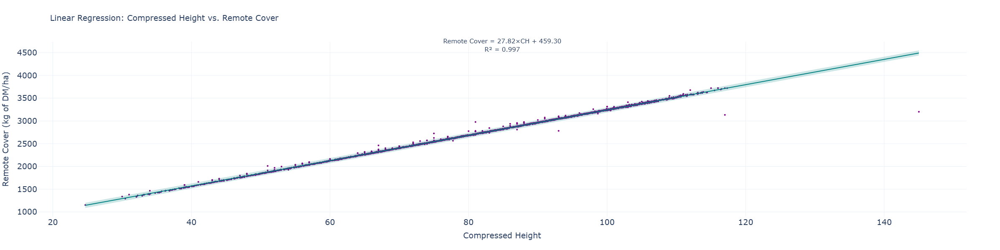

In [10]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import plotly.io as pio
import os

def plot_regression_lm(d_model, 
                       remove_outliers=True, 
                       remote_cover_threshold=4000,
                       annotation_font_size=15, 
                       title_font_size=20,
                       tick_font_size=12, 
                       height=300, 
                       width=400):
    """
    Plots a linear regression between NDVI and Remote Cover using d_model.
    
    The function:
      - Optionally removes outliers from 'remote_cover'. When remove_outliers is True,
        it removes rows that are below the lower IQR bound and also any rows where
        remote_cover exceeds the remote_cover_threshold.
      - Uses NDVI as the independent variable (X-axis) and Remote Cover as the dependent (Y-axis).
      - Fits a linear regression model and computes a 95% prediction interval.
      - Creates a Plotly figure with teal markers, a teal regression line, and a translucent confidence interval.
      - Places an annotation at the top center with the regression equation and R².
      - Updates axis labels and font sizes according to the provided parameters.
    
    Parameters:
      - d_model (pd.DataFrame): DataFrame containing 'ndvi' and 'remote_cover' (and optionally 'Date').
      - remove_outliers (bool): If True, removes outliers from 'remote_cover' based on the lower IQR method 
                                and a fixed upper threshold.
      - remote_cover_threshold (float): The maximum allowed value for remote_cover. Defaults to 4000.
      - annotation_font_size (int): Font size for the annotation.
      - title_font_size (int): Font size for the plot title and axis titles.
      - tick_font_size (int): Font size for the tick labels.
      - height (int): Height of the figure in pixels.
      - width (int): Width of the figure in pixels.
    """
    
    # --- Step 1: Remove outliers from 'remote_cover' (if requested) ---
    if remove_outliers:
        # Calculate the first and third quartiles for remote_cover.
        q1 = d_model['remote_cover'].quantile(0.25)
        q3 = d_model['remote_cover'].quantile(0.75)
        iqr = q3 - q1
        
        # Determine the lower bound using the IQR method.
        lower_bound = q1 - 1.5 * iqr
        
        # Use the provided remote_cover_threshold as the upper bound.
        d_model_filtered = d_model[(d_model['remote_cover'] >= lower_bound) & 
                                   (d_model['remote_cover'] <= remote_cover_threshold)].copy()
        print(f"Original shape: {d_model.shape}")
        print(f"Shape after removing remote_cover outliers: {d_model_filtered.shape}")
    else:
        d_model_filtered = d_model.copy()
    
    # --- Step 2: Prepare data for modeling ---
    # Use NDVI as independent variable and Remote Cover as dependent variable.
    X = d_model_filtered[['RawReading']].values   # NDVI on X-axis
    y = d_model_filtered['remote_cover'].values  # Remote Cover on Y-axis

    # --- Step 3: Fit Linear Regression using scikit-learn ---
    lm = LinearRegression()
    lm.fit(X, y)
    slope = lm.coef_[0]
    intercept = lm.intercept_
    y_pred = lm.predict(X)
    r2 = r2_score(y, y_pred)
    
    # --- Step 4: Compute the 95% prediction interval using statsmodels ---
    X_sm = sm.add_constant(X)
    model_sm = sm.OLS(y, X_sm).fit()
    predictions_sm = model_sm.get_prediction(X_sm)
    pred_summary = predictions_sm.summary_frame(alpha=0.05)  # 95% prediction interval
    
    # Sort by NDVI for a smooth regression line
    sorted_indices = np.argsort(X.flatten())
    X_sorted = X.flatten()[sorted_indices]
    X_sorted_sm = sm.add_constant(X_sorted)
    pred_sorted = model_sm.predict(X_sorted_sm)
    pred_summary_sorted = model_sm.get_prediction(X_sorted_sm).summary_frame(alpha=0.05)
    
    # --- Step 5: Create the Plotly figure ---
    fig = go.Figure()

    # Scatter trace: NDVI on X, Remote Cover on Y
    fig.add_trace(go.Scatter(
        x=X.flatten(),
        y=y,
        mode='markers',
        marker=dict(symbol='circle', color='purple', size=4),
        showlegend=False
    ))
    
    # Regression line
    fig.add_trace(go.Scatter(
        x=X_sorted,
        y=pred_sorted,
        mode='lines',
        line=dict(color='teal', width=2),
        showlegend=False
    ))
    
    # Confidence interval as a filled area
    fig.add_trace(go.Scatter(
        x=np.concatenate([X_sorted, X_sorted[::-1]]),
        y=np.concatenate([pred_summary_sorted['obs_ci_upper'], pred_summary_sorted['obs_ci_lower'][::-1]]),
        fill='toself',
        fillcolor='rgba(0,128,128,0.2)',  # translucent teal
        line=dict(color='rgba(255,255,255,0)'),
        hoverinfo="skip",
        showlegend=False
    ))
    
    # Annotation text: regression equation and R²
    equation_text = f"Remote Cover = {slope:.2f}×CH + {intercept:.2f}<br>R² = {r2:.3f}"
    
    # Place the annotation at the top center of the plot
    fig.add_annotation(
        xref="paper", yref="paper",
        x=0.5, y=1.03,
        text=equation_text,
        showarrow=False,
        font=dict(size=annotation_font_size)
    )
    
    # --- Step 6: Update layout ---
    fig.update_layout(
        title="Linear Regression: Compressed Height vs. Remote Cover",
        title_font=dict(size=title_font_size),
        xaxis=dict(
            title="Compressed Height",
            title_font=dict(size=title_font_size),
            tickfont=dict(size=tick_font_size)
        ),
        yaxis=dict(
            title="Remote Cover (kg of DM/ha)",
            title_font=dict(size=title_font_size),
            tickfont=dict(size=tick_font_size)
        ),
        template='plotly_white',
        height=height,
        width=width,
        showlegend=False
    )

    # --- Save the figure to the visualisations folder ---
    os.makedirs("visualisations", exist_ok=True)
    output_path = os.path.join("visualisations", "compressed_height_vs_biomass(100%).svg")
    pio.write_image(fig, output_path, format='svg', height=600, width=600, scale=50)
    
    fig.show()

# --- Usage Example ---
# d_model is your DataFrame containing 'ndvi', 'remote_cover' and optionally 'Date'
plot_regression_lm(d_model_new, 
                   remove_outliers=False, 
                   remote_cover_threshold=4000, 
                   annotation_font_size=15, 
                   title_font_size=19, 
                   tick_font_size=19, 
                   height=600, 
                   width=600)

### Relationship between NDVI and Biomass and Predicting Biomass with NDVI alone - NDVI vs Biomass (different training and test proportions)

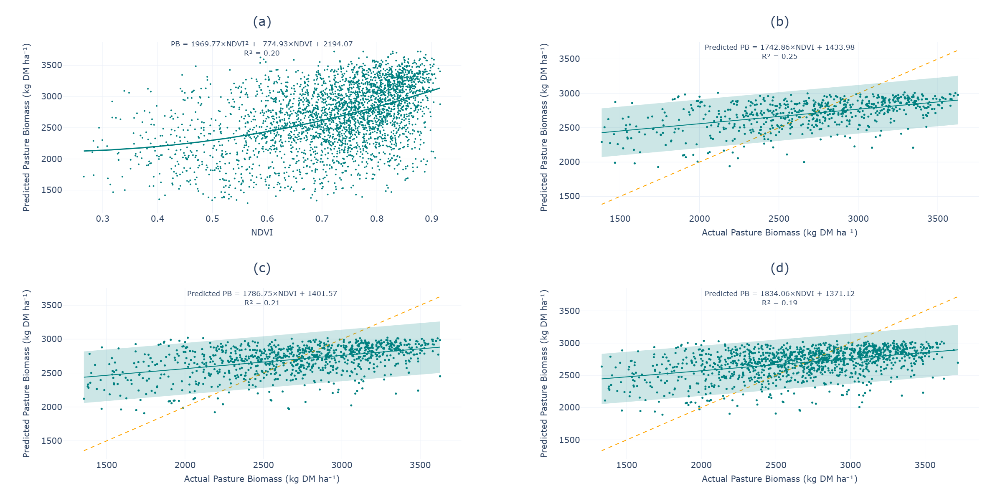


► Regression statistics written to aggregations/figure1_regression_stats.csv
✓ High-quality TIFF saved to: visual/Figure 2 - Combined NVDI and Biomass Relationship.tiff


In [33]:
import os
import numpy as np
import pandas as pd
import statsmodels.api as sm
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import plotly.io as pio

def plot_2x2_regressions(
    d_model,
    train_ratios=[0.8, 0.7, 0.6],
    remove_outliers=True,
    remote_cover_threshold=4000,
    annotation_font_size=15,
    title_font_size=20,
    tick_font_size=20,
    save_path="visualisations/Figure 1 - Combined NVDI and Biomass Relationship.svg",
    scale=50
):
    """
    Produces 4 subplots (2×2), each 550×550 pixels:
      (1,1) NDVI vs Remote Cover regression with polynomial fit to show saturation
      (1,2),(2,1),(2,2) Actual vs Predicted for each train_ratio
    """
    # 1. Optionally remove outliers
    data = d_model.copy()
    if remove_outliers:
        q1, q3 = data['remote_cover'].quantile([0.25, 0.75])
        iqr = q3 - q1
        lower = q1 - 1.5 * iqr
        data = data[(data['remote_cover'] >= lower) &
                    (data['remote_cover'] <= remote_cover_threshold)]
    
    # 2. Full regression (NDVI → Remote Cover) - POLYNOMIAL to show saturation
    X = data[['ndvi']].values
    y = data['remote_cover'].values
    
    # Polynomial model (2nd order) to show saturation curve
    poly_model = make_pipeline(PolynomialFeatures(2), LinearRegression())
    poly_model.fit(X, y)
    
    Xs = np.linspace(X.min(), X.max(), 300).reshape(-1, 1)
    line_f = poly_model.predict(Xs)
    r2_f = r2_score(y, poly_model.predict(X))

    # Get polynomial coefficients for formula display
    poly_reg = poly_model.named_steps['linearregression']
    c = poly_reg.intercept_
    b, a = poly_reg.coef_[1], poly_reg.coef_[2]
    
    # 3. Create subplots
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=["(a)", "(b)", "(c)", "(d)"],
        vertical_spacing=0.18,
        horizontal_spacing=0.13
    )
    
    # 4. Plot (1,1): NDVI vs Remote Cover with polynomial curve
    fig.add_trace(go.Scatter(
        x=X.flatten(), y=y,
        mode='markers',
        marker=dict(color='teal', size=4),
        showlegend=False
    ), row=1, col=1)
    
    fig.add_trace(go.Scatter(
        x=Xs.flatten(), y=line_f,
        mode='lines', line=dict(color='teal', width=3),
        showlegend=False
    ), row=1, col=1)
        
    fig.add_annotation(
            xref='x domain', yref='y domain',
            x=0.5, y=1.02,
            text=f"PB = {a:.2f}×NDVI² + {b:.2f}×NDVI + {c:.2f}<br>R² = {r2_f:.2f}",
            font=dict(size=annotation_font_size),
            showarrow=False,
            row=1, col=1
    )
    
    fig.update_xaxes(
        title_text="NDVI",
        row=1, col=1,
        title_font=dict(size=title_font_size),
        tickfont=dict(size=tick_font_size)
    )
    fig.update_yaxes(
        title_text="Predicted Pasture Biomass (kg DM ha⁻¹)",
        row=1, col=1,
        title_font=dict(size=title_font_size),
        tickfont=dict(size=tick_font_size)
    )
    
    # 5. Plot test‑split panels (keep linear for these)
    for i, r in enumerate(train_ratios):
        # split & fit NDVI→Remote Cover
        X_all = data[['ndvi']].values
        y_all = data['remote_cover'].values
        X_tr, X_te, y_tr, y_te = train_test_split(
            X_all, y_all, test_size=1-r, random_state=42
        )
        lm2 = LinearRegression().fit(X_tr, y_tr)
        slope_t, intercept_t = lm2.coef_[0], lm2.intercept_
        y_pred = lm2.predict(X_te)
        r2_t = r2_score(y_te, y_pred)
        
        # build PI for scatter
        act_sm = sm.add_constant(y_te)
        test_sm = sm.OLS(y_pred, act_sm).fit()
        idx2 = np.argsort(y_te)
        yt = y_te[idx2]
        yt_sm = sm.add_constant(yt)
        line2 = test_sm.predict(yt_sm)
        pi2 = test_sm.get_prediction(yt_sm).summary_frame(alpha=0.05)
        
        row = 1 + ((i+1)//2)
        col = 1 + ((i+1)%2)
        
        fig.add_trace(go.Scatter(
            x=y_te, y=y_pred,
            mode='markers',
            marker=dict(color='teal', size=5),
            showlegend=False
        ), row=row, col=col)

        # Add 1:1 line (y = x)
        min_val = min(np.min(y_te), np.min(y_pred))
        max_val = max(np.max(y_te), np.max(y_pred))
        fig.add_trace(go.Scatter(
            x=[min_val, max_val],
            y=[min_val, max_val],
            mode='lines',
            line=dict(color='orange', width=2, dash='dash'),
            showlegend=False
        ), row=row, col=col)
        
        fig.add_trace(go.Scatter(
            x=yt, y=line2,
            mode='lines', line=dict(color='teal', width=2),
            showlegend=False
        ), row=row, col=col)
        
        fig.add_trace(go.Scatter(
            x=np.concatenate([yt, yt[::-1]]),
            y=np.concatenate([pi2['obs_ci_upper'], pi2['obs_ci_lower'][::-1]]),
            fill='toself',
            fillcolor='rgba(0,128,128,0.2)',
            line=dict(color='rgba(255,255,255,0)'),
            hoverinfo='skip',
            showlegend=False
        ), row=row, col=col)
        
        fig.add_annotation(
            xref='x domain', yref='y domain',
            x=0.5, y=1.00,
            text=f"Predicted PB = {slope_t:.2f}×NDVI + {intercept_t:.2f}<br>R² = {r2_t:.2f}",
            font=dict(size=annotation_font_size),
            showarrow=False,
            row=row, col=col
        )
        
        fig.update_xaxes(
            title_text="Actual Pasture Biomass (kg DM ha⁻¹)",
            row=row, col=col,
            title_font=dict(size=title_font_size),
            tickfont=dict(size=tick_font_size)
        )
        fig.update_yaxes(
            title_text="Predicted Pasture Biomass (kg DM ha⁻¹)",
            row=row, col=col,
            title_font=dict(size=title_font_size),
            tickfont=dict(size=tick_font_size)
        )
    
    # 6. Bump subplot‑title font and nudge upward
    for ann in fig.layout.annotations:
        if ann.xref == "paper":
            ann.font.size = 30
            if ann.yref == "paper":
                ann.y += 0.03
                
    # 7. Final layout & save
    fig.update_layout(
        width=2*600,
        height=2*600,
        template='plotly_white',
        margin=dict(l=150, r=50, t=100, b=100)
    )
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    pio.write_image(fig, save_path, format='svg',
                    width=2*600, height=2*600, scale=scale)
    fig.show()

    # 8. Collect panel statistics → CSV table
    stats = []

    # panel (a) – full dataset with polynomial
    stats.append({
        'Panel'      : '(a) full',
        'Model'      : 'Polynomial',
        'Train_ratio': 1.00,
        'n_train'    : len(data),
        'n_test'     : 0,
        'R2'         : round(r2_f, 3)
    })

    # panels (b)–(d) – different train : test splits
    for r in train_ratios:
        X_all = data[['ndvi']].values
        y_all = data['remote_cover'].values
        X_tr, X_te, y_tr, y_te = train_test_split(
            X_all, y_all, test_size=1 - r, random_state=42
        )
        lm_tmp = LinearRegression().fit(X_tr, y_tr)
        y_pred = lm_tmp.predict(X_te)
        stats.append({
            'Panel'      : f"{int(r*100)} : {int((1-r)*100)}",
            'Model'      : 'Linear',
            'Train_ratio': r,
            'n_train'    : len(y_tr),
            'n_test'     : len(y_te),
            'Slope'      : round(lm_tmp.coef_[0], 4),
            'Intercept'  : round(lm_tmp.intercept_, 2),
            'R2'         : round(r2_score(y_te, y_pred), 3)
        })

    # build DataFrame & save
    stats_df = pd.DataFrame(stats)
    os.makedirs("aggregations", exist_ok=True)
    stats_df.to_csv("aggregations/figure1_regression_stats.csv", index=False)
    print("\n► Regression statistics written to aggregations/figure1_regression_stats.csv")
    return fig

# # Run the plot
# plot_2x2_regressions(
#     d_model_new,
#     train_ratios=[0.8, 0.7, 0.6],
#     remove_outliers=True,
#     remote_cover_threshold=4000,
#     annotation_font_size=17,
#     title_font_size=20,
#     tick_font_size=20,
#     save_path="visualisations/Figure 1 - Combined NVDI and Biomass Relationship.svg",
#     scale=50
# )


# Call the function and capture the Plotly figure it returns
fig_plotly = plot_2x2_regressions(
    d_model_new,
    train_ratios=[0.8, 0.7, 0.6],
    remove_outliers=True,
    remote_cover_threshold=4000,
    annotation_font_size=17,
    title_font_size=20,
    tick_font_size=20,
    save_path="visualisations/Figure 1 - Combined NVDI and Biomass Relationship.svg",
    scale=50
)

# --- High-quality TIFF export to visual/ ---
import os
from PIL import Image
import plotly.io as pio
import plotly.graph_objects as go

if not isinstance(fig_plotly, go.Figure):
    raise TypeError("plot_2x2_regressions() must return a Plotly Figure. "
                    "Ensure `return fig` is at the end of the function and that you haven't overwritten `fig_plotly`.")

os.makedirs("visual", exist_ok=True)

# Use figure's layout size if set; else fall back to 1200×1200
w = int(fig_plotly.layout.width or 1200)
h = int(fig_plotly.layout.height or 1200)

png_path  = "visual/Figure 2 - Combined NVDI and Biomass Relationship.png"
tiff_path = "visual/Figure 2 - Combined NVDI and Biomass Relationship.tiff"

# Export very high-res PNG first (clean base for TIFF)
pio.write_image(
    fig_plotly,
    png_path,
    format="png",
    width=w,
    height=h,
    scale=10   # boost for crisp text/lines
)

# Convert PNG → TIFF (LZW compression, 600 DPI)
with Image.open(png_path) as im:
    # If your journal needs CMYK, uncomment the next line:
    # im = im.convert("CMYK")
    im.save(tiff_path, format="TIFF", compression="tiff_lzw", dpi=(600, 600))

print(f"✓ High-quality TIFF saved to: {tiff_path}")

### Heatmap

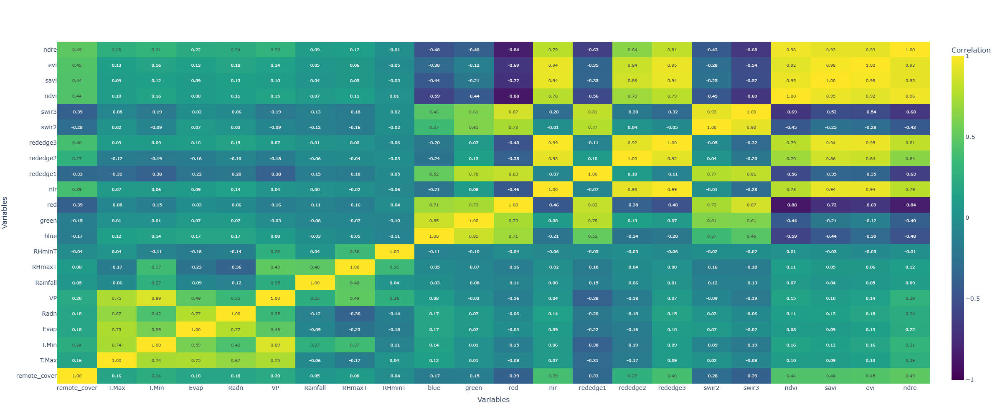

In [67]:
import os
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio

def plot_correlation_heatmap(df, columns=None, color_scale='Viridis'):
    """
    Plots a correlation heatmap for selected numeric columns in the DataFrame,
    excluding 'Ssl', 'FarmResidualSetting', 'Week' and 'FAO56'; shows each 
    correlation coefficient in the cell, saves as SVG at scale=50.
    """
    # Infer df name for title/filename
    df_name = next((name for name, val in globals().items() if val is df), 'DataFrame')
    title = f"Correlation Heatmap for {df_name}"
    
    # Drop unwanted columns
    excluded = {'Ssl', 'FarmResidualSetting', 'Week', 'FAO56'}
    df_filtered = df.drop(columns=[c for c in excluded if c in df.columns])
    
    # Numeric cols
    numeric_cols = list(df_filtered.select_dtypes(include='number').columns)
    
    # Subset if requested
    if columns is not None:
        selected = [c for c in columns if c in numeric_cols]
        if not selected:
            raise ValueError("None of the specified columns are numeric or present in the DataFrame.")
    else:
        selected = numeric_cols
    
    # Compute corr matrix
    corr_matrix = df_filtered[selected].corr()
    z = corr_matrix.values
    z_text = [[f"{val:.2f}" for val in row] for row in z]
    
    # Build the heatmap with annotations
    fig = go.Figure(data=go.Heatmap(
        z=z,
        x=corr_matrix.columns,
        y=corr_matrix.index,
        colorscale=color_scale,
        colorbar=dict(title="Correlation"),
        zmin=-1, zmax=1,
        text=z_text,
        texttemplate="%{text}",
        textfont={"size":10}
    ))
    
    # Layout tweaks
    fig.update_layout(
        # title=title,
        title_font_size=24,
        xaxis_title="Variables",
        yaxis_title="Variables",
        font=dict(size=14),
        width=1200,
        height=1000
    )
    
    # --- Save the figure to the visualisations folder ---
    os.makedirs("visualisations", exist_ok=True)
    filename = f"{df_name}_correlation_heatmap.svg"
    output_path = os.path.join("visualisations", filename)
    pio.write_image(fig, output_path, format='svg',
                    height=1000, width=1200, scale=5)
    
    # Finally display
    fig.show()

plot_correlation_heatmap(
    d_model_new,
    columns=[
        'remote_cover','T.Max','T.Min','Evap','Radn','VP','Rainfall',
        'RHmaxT','RHminT','blue','green','red','nir',
        'rededge1','rededge2','rededge3','swir2','swir3',
        'ndvi','savi','evi','ndre'
    ],
    color_scale='Viridis'
)


### Varieties of Variables

In [ ]:
cat_preds = ['Farm Code', 'pcode', 'Season', 'Region', 'grazing']
    target_var = 'remote_cover'

    # Define the four scenarios' numeric predictors (num_preds)
    scenarios = {
        "All_the_Bands_with_Indices_without_Weather_Data": [
            'blue','green','red','nir',
            'rededge1','rededge2','rededge3','swir2','swir3', 'ndvi', 'savi', 'evi', 'ndre' 
        ],
        "All_the_Bands_with_Weather_Data_with_Indices": [
            'T.Max','T.Min','Evap','Radn','VP','Rainfall',
            'RHmaxT', 'RHminT','blue','green','red','nir',
            'rededge1','rededge2','rededge3','swir2','swir3',  'ndvi', 'savi', 'evi', 'ndre'
        ],
        "All_the_Bands_Alone_without_Indices_and_without_Weather_Data": [
            'blue','green','red','nir',
            'rededge1','rededge2','rededge3','swir2','swir3'
        ],
        "All_the_Bands_with_Weather_Data_without_Indices": [
            'T.Max','T.Min','Evap','Radn','VP','Rainfall',
            'RHmaxT', 'RHminT','blue','green','red','nir',
            'rededge1','rededge2','rededge3','swir2','swir3'
        ]
    }

### Dictionary for Modelling

In [ ]:
# Full model dictionary (unchanged)
model_dict = {
    'linear': {'estimator': LinearRegression(), 'param_grid': {}},
    'lasso': {'estimator': Lasso(random_state=42), 'param_grid': {'model__alpha':[0.001,0.01,0.1,1.0,10,100]}},
    'decision_tree': {'estimator': DecisionTreeRegressor(random_state=42),
                      'param_grid': {'model__max_depth':[None,5,10],'model__min_samples_split':[2,5,10]}},
    'svr': {'estimator': SVR(), 'param_grid': {'model__C':[0.1,1,10],'model__kernel':['linear','rbf']}},
    'knn': {'estimator': KNeighborsRegressor(), 'param_grid': {'model__n_neighbors':[3,5,7],'model__weights':['uniform','distance']}},
    'random_forest': {'estimator': RandomForestRegressor(random_state=42),
                      'param_grid': {'model__n_estimators':[50,100,150,200,250,300,350,400,450],'model__max_depth':[None,5,10]}},
    'gbm': {'estimator': GradientBoostingRegressor(random_state=42),
            'param_grid': {'model__n_estimators':[50,100,150,200,250,300,350,400,450],'model__learning_rate':[0.01,0.1,0.2],'model__max_depth':[3,5]}},
    'xgboost': {'estimator': XGBRegressor(random_state=42, use_label_encoder=False, objective='reg:squarederror'),
                'param_grid': {'model__n_estimators':[50,100,150,200,250,300,350,400,450],'model__learning_rate':[0.01,0.1,0.2],'model__max_depth':[3,5]}}
}

### NDVI + Weather Alone (XGBoost)

In [16]:
import time
import warnings
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, GridSearchCV, RepeatedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module="zipfile")


def compute_metrics(actual, predicted):
    """Calculate regression metrics"""
    mse  = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    r2   = r2_score(actual, predicted)
    mae  = mean_absolute_error(actual, predicted)
    return {'mse': mse, 'rmse': rmse, 'r2': r2, 'mae': mae}


def train_xgboost_and_get_metrics(
    train_df,
    test_df,
    cat_preds,
    num_preds,
    target_var,
    scoring_metric='neg_mean_absolute_error',
    k_folds=5,
    cv_repeats=3,
    random_state=42
):
    """
    Train XGBoost with hyperparameter tuning and return only metrics
    """
    X_tr, y_tr = train_df[cat_preds + num_preds], train_df[target_var]
    X_te, y_te = test_df[cat_preds + num_preds], test_df[target_var]

    # Preprocessing pipeline
    preproc = ColumnTransformer([
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_preds),
        ('num', StandardScaler(), num_preds)
    ])

    # XGBoost pipeline
    pipe = Pipeline([
        ('pre', preproc), 
        ('model', XGBRegressor(
            random_state=random_state,
            use_label_encoder=False,
            objective="reg:squarederror"
        ))
    ])

    # Parameter grid for XGBoost
    param_grid = {
        'model__n_estimators': [50, 100, 150, 200, 250, 300, 350, 400, 450],
        'model__learning_rate': [0.01, 0.1, 0.2],
        'model__max_depth': [3, 5, 7]
    }

    # Repeated k-fold cross-validation
    rkf = RepeatedKFold(n_splits=k_folds, n_repeats=cv_repeats, random_state=random_state)
    
    # Grid search
    grid = GridSearchCV(
        pipe,
        param_grid=param_grid,
        scoring=scoring_metric,
        cv=rkf,
        n_jobs=-1,
        refit=True,
        verbose=1
    )
    
    print("Training XGBoost with hyperparameter tuning...")
    grid.fit(X_tr, y_tr)

    # Get predictions and metrics
    cv_score = grid.best_score_
    preds_te = grid.best_estimator_.predict(X_te)
    test_metrics = compute_metrics(y_te, preds_te)

    # Calculate prediction statistics
    pred_stats = {
        'mean_actual': float(y_te.mean()),
        'mean_predicted': float(preds_te.mean()),
        'std_actual': float(y_te.std()),
        'std_predicted': float(preds_te.std()),
        'min_actual': float(y_te.min()),
        'max_actual': float(y_te.max()),
        'min_predicted': float(preds_te.min()),
        'max_predicted': float(preds_te.max())
    }

    return {
        'best_params': grid.best_params_,
        'cv_score': cv_score,
        'test_metrics': test_metrics,
        'prediction_stats': pred_stats
    }


# --------------------- Main Execution ---------------------
if __name__ == "__main__":
    start = time.time()

    # Define predictors - NDVI and weather data only
    # cat_preds = ['Region', 'Season']
    num_preds = ['T.Max', 'T.Min', 'Evap', 'Radn', 'VP', 'Rainfall', 'RHmaxT', 'RHminT', 'ndvi']
    # num_preds = ['ndvi']
    target_var = 'remote_cover'

    print("="*60)
    print("XGBOOST MODEL TRAINING - NDVI + WEATHER DATA")
    print("="*60)
    print(f"Categorical predictors: {cat_preds}")
    print(f"Numerical predictors: {num_preds}")
    print(f"Target variable: {target_var}")

    # Load your dataset
    df = d_model_new  # Replace with your actual dataset variable name
    
    print(f"\nDataset shape: {df.shape}")
    
    # Check if all required columns exist
    all_preds = cat_preds + num_preds + [target_var]
    missing_cols = [col for col in all_preds if col not in df.columns]
    if missing_cols:
        print(f"ERROR: Missing columns: {missing_cols}")
        exit()
    
    # Split data into train and test (80-20 split)
    train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)
    print(f"Train set shape: {train_df.shape}")
    print(f"Test set shape: {test_df.shape}")

    # Train XGBoost and get metrics
    results = train_xgboost_and_get_metrics(
        train_df=train_df,
        test_df=test_df,
        cat_preds=cat_preds,
        num_preds=num_preds,
        target_var=target_var,
        scoring_metric='neg_mean_absolute_error',
        k_folds=5,
        cv_repeats=3,
        random_state=42
    )

    execution_time = time.time() - start
    
    # Display comprehensive metrics
    print("\n" + "="*60)
    print("COMPREHENSIVE PERFORMANCE METRICS")
    print("="*60)
    
    print(f"Execution time: {execution_time:.2f} seconds")
    print(f"Training samples: {train_df.shape[0]:,}")
    print(f"Testing samples: {test_df.shape[0]:,}")
    
    print("\nCROSS-VALIDATION PERFORMANCE:")
    print(f"  Best CV Score (neg_MAE): {results['cv_score']:.4f}")
    print(f"  Best CV MAE: {-results['cv_score']:.4f}")
    
    print("\nTEST SET PERFORMANCE:")
    metrics = results['test_metrics']
    print(f"  R² Score: {metrics['r2']:.4f}")
    print(f"  Mean Squared Error (MSE): {metrics['mse']:.4f}")
    print(f"  Root Mean Squared Error (RMSE): {metrics['rmse']:.4f}")
    print(f"  Mean Absolute Error (MAE): {metrics['mae']:.4f}")
    
    print("\nPREDICTION STATISTICS:")
    stats = results['prediction_stats']
    print(f"  Actual values:")
    print(f"    Mean: {stats['mean_actual']:.4f}")
    print(f"    Std:  {stats['std_actual']:.4f}")
    print(f"    Range: [{stats['min_actual']:.4f}, {stats['max_actual']:.4f}]")
    print(f"  Predicted values:")
    print(f"    Mean: {stats['mean_predicted']:.4f}")
    print(f"    Std:  {stats['std_predicted']:.4f}")
    print(f"    Range: [{stats['min_predicted']:.4f}, {stats['max_predicted']:.4f}]")
    
    print("\nBEST HYPERPARAMETERS:")
    for param, value in results['best_params'].items():
        param_name = param.replace('model__', '')
        print(f"  {param_name}: {value}")
    
    print("\nMODEL PERFORMANCE INTERPRETATION:")
    r2 = metrics['r2']
    if r2 >= 0.9:
        performance = "EXCELLENT"
        interpretation = "Model explains ≥90% of variance"
    elif r2 >= 0.7:
        performance = "GOOD"
        interpretation = "Model explains 70-89% of variance"
    elif r2 >= 0.5:
        performance = "MODERATE"
        interpretation = "Model explains 50-69% of variance"
    elif r2 >= 0.3:
        performance = "POOR"
        interpretation = "Model explains 30-49% of variance"
    else:
        performance = "VERY POOR"
        interpretation = "Model explains <30% of variance"
    
    print(f"  Performance Category: {performance}")
    print(f"  Interpretation: {interpretation}")
    print(f"  Variance Explained: {r2*100:.1f}%")
    
    # Additional insights
    bias = stats['mean_predicted'] - stats['mean_actual']
    print(f"\nMODEL BIAS ANALYSIS:")
    print(f"  Prediction Bias: {bias:.4f}")
    if abs(bias) < 0.01:
        print("  Bias Level: Very Low (excellent)")
    elif abs(bias) < 0.05:
        print("  Bias Level: Low (good)")
    elif abs(bias) < 0.1:
        print("  Bias Level: Moderate")
    else:
        print("  Bias Level: High (concerning)")
    
    if bias > 0:
        print("  Tendency: Model slightly over-predicts")
    elif bias < 0:
        print("  Tendency: Model slightly under-predicts")
    else:
        print("  Tendency: Model is unbiased")
    
    print("\n" + "="*60)
    print("ANALYSIS COMPLETE")
    print("="*60)

XGBOOST MODEL TRAINING - NDVI + WEATHER DATA
Categorical predictors: ['Region', 'Season']
Numerical predictors: ['T.Max', 'T.Min', 'Evap', 'Radn', 'VP', 'Rainfall', 'RHmaxT', 'RHminT', 'ndvi']
Target variable: remote_cover

Dataset shape: (3161, 56)
Train set shape: (2528, 56)
Test set shape: (633, 56)
Training XGBoost with hyperparameter tuning...
Fitting 15 folds for each of 81 candidates, totalling 1215 fits

COMPREHENSIVE PERFORMANCE METRICS
Execution time: 26.08 seconds
Training samples: 2,528
Testing samples: 633

CROSS-VALIDATION PERFORMANCE:
  Best CV Score (neg_MAE): -297.5198
  Best CV MAE: 297.5198

TEST SET PERFORMANCE:
  R² Score: 0.5054
  Mean Squared Error (MSE): 132111.9714
  Root Mean Squared Error (RMSE): 363.4721
  Mean Absolute Error (MAE): 284.1905

PREDICTION STATISTICS:
  Actual values:
    Mean: 2704.5740
    Std:  517.2323
    Range: [1363.3333, 3720.0000]
  Predicted values:
    Mean: 2708.7974
    Std:  372.2805
    Range: [1624.1870, 3532.5396]

BEST HYPERPA

### Part 1: Impact of Feature Selection on Model Performance : No Interpolation

#### Modelling Code

In [ ]:
import time
import os
import pickle
import warnings
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, GridSearchCV, RepeatedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, OrdinalEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor

# Suppress specific warnings related to ZipFile closure
warnings.filterwarnings("ignore", category=UserWarning, module="zipfile")


# --------------------- Helpers ---------------------
def _compute_metrics(actual, predicted):
    mse  = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    r2   = r2_score(actual, predicted)
    mae  = mean_absolute_error(actual, predicted)
    return {'mse': mse, 'rmse': rmse, 'r2': r2, 'mae': mae}


def _train_and_evaluate_all_models(
    train_df,
    test_df,
    cat_preds,
    num_preds,
    target_var,
    model_dict,
    scoring_metric='neg_mean_absolute_error',
    k_folds=5,
    cv_repeats=20,
    optimize=True,
    numeric_scaler_type="standard",
    categorical_encoder_type="onehot",
    random_state=42
):
    """
    Same signature as before, but uses RepeatedKFold(k_folds, cv_repeats)
    for hyperparameter search stability.
    """
    X_tr, y_tr = train_df[cat_preds + num_preds], train_df[target_var]
    X_te, y_te = test_df[cat_preds + num_preds], test_df[target_var]

    # Choose scalers/encoders
    num_scaler = StandardScaler() if numeric_scaler_type=="standard" else MinMaxScaler()
    cat_enc    = OneHotEncoder(handle_unknown='ignore') if categorical_encoder_type=="onehot" else OrdinalEncoder()
    preproc    = ColumnTransformer([
        ('cat', cat_enc, cat_preds),
        ('num', num_scaler, num_preds)
    ])

    best_info = None
    best_cv   = -np.inf
    summary   = []

    # repeated k-fold object
    rkf = RepeatedKFold(n_splits=k_folds, n_repeats=cv_repeats, random_state=random_state)

    for name, spec in model_dict.items():
        pipe = Pipeline([('pre', preproc), ('model', spec['estimator'])])
        grid = GridSearchCV(
            pipe,
            param_grid=spec['param_grid'] if optimize else {},
            scoring=scoring_metric,
            cv=rkf,
            n_jobs=-1,
            refit=True
        )
        grid.fit(X_tr, y_tr)

        cv_score = grid.best_score_
        preds_te = grid.best_estimator_.predict(X_te)
        met_te   = _compute_metrics(y_te, preds_te)

        print(f"\n{name}: CV={cv_score:.4f}  Test R²={met_te['r2']:.4f}, "
              f"MSE={met_te['mse']:.2f}, RMSE={met_te['rmse']:.2f}, MAE={met_te['mae']:.2f}")

        if cv_score > best_cv:
            best_cv = cv_score
            best_info = {
                'name': name,
                'best_model': grid.best_estimator_,
                'metrics': met_te,
                'cv_score': cv_score
            }

        summary.append({
            'model': name,
            'cv_score': cv_score,
            **{f"test_{k}": v for k, v in met_te.items()}
        })

    test_out = test_df.copy()
    if best_info:
        test_out[f"{best_info['name']}_pred"] = best_info['best_model'].predict(X_te)
        print(f"→ Best: {best_info['name']} (CV={best_info['cv_score']:.4f})")

    return best_info, test_out, pd.DataFrame(summary)


def evaluate_model_on_validation(best_info, val_df, cat_preds, num_preds, target_var):
    """Evaluates model performance on validation data"""
    if best_info is None:
        return None, None
    X_val = val_df[cat_preds + num_preds].copy()
    y_val = val_df[target_var].copy()
    preds_val = best_info['best_model'].predict(X_val)
    val_metrics = _compute_metrics(y_val, preds_val)
    validation_df_with_pred = val_df.copy()
    validation_df_with_pred[f"{best_info['name']}_pred"] = preds_val
    return val_metrics, validation_df_with_pred


# --------------------- Main Execution ---------------------
if __name__ == "__main__":
    start = time.time()

    cat_preds  = ['Farm Code', 'pcode', 'Season', 'Region', 'grazing']
    target_var = 'remote_cover'

    scenarios = {
        "All_the_Bands_with_Indices_without_Weather_Data": [
            'blue','green','red','nir',
            'rededge1','rededge2','rededge3','swir2','swir3',
            'ndvi','savi','evi','ndre'
        ],
        "All_the_Bands_with_Weather_Data_with_Indices": [
            'T.Max','T.Min','Evap','Radn','VP','Rainfall',
            'RHmaxT','RHminT','blue','green','red','nir',
            'rededge1','rededge2','rededge3','swir2','swir3',
            'ndvi','savi','evi','ndre'
        ],
        "All_the_Bands_Alone_without_Indices_and_without_Weather_Data": [
            'blue','green','red','nir',
            'rededge1','rededge2','rededge3','swir2','swir3'
        ],
        "All_the_Bands_with_Weather_Data_without_Indices": [
            'T.Max','T.Min','Evap','Radn','VP','Rainfall',
            'RHmaxT','RHminT','blue','green','red','nir',
            'rededge1','rededge2','rededge3','swir2','swir3'
        ]
    }

    model_dict = {
        'linear':        {'estimator': LinearRegression(), 'param_grid': {}},
        'lasso':         {'estimator': Lasso(random_state=42),
                          'param_grid': {'model__alpha':[0.001,0.01,0.1,1.0,10,100]}},
        'decision_tree': {'estimator': DecisionTreeRegressor(random_state=42),
                          'param_grid': {'model__max_depth':[None,5,10],
                                         'model__min_samples_split':[2,5,10]}},
        'svr':           {'estimator': SVR(),
                          'param_grid': {'model__C':[0.1,1,10],
                                         'model__kernel':['linear','rbf']}},
        'knn':           {'estimator': KNeighborsRegressor(),
                          'param_grid': {'model__n_neighbors':[3,5,7],
                                         'model__weights':['uniform','distance']}},
        'random_forest': {'estimator': RandomForestRegressor(random_state=42),
                          'param_grid': {'model__n_estimators':[50,100,150,200,250,300,350,400,450],
                                         'model__max_depth':[None,5,10]}},
        'gbm':           {'estimator': GradientBoostingRegressor(random_state=42),
                          'param_grid': {'model__n_estimators':[50,100,150,200,250,300,350,400,450],
                                         'model__learning_rate':[0.01,0.1,0.2],
                                         'model__max_depth':[3,5]}},
        'xgboost':       {'estimator': XGBRegressor(random_state=42,
                                                   use_label_encoder=False,
                                                   objective="reg:squarederror"),
                          'param_grid': {'model__n_estimators':[50,100,150,200,250,300,350,400,450],
                                         'model__learning_rate':[0.01,0.1,0.2],
                                         'model__max_depth':[3,5]}}
    }

    # Only non-interpolated
    scenarios_data = {"Non_interpolated": d_model_new}

    # Validation sets
    val1 = val_set_1_new  # Nov 2024
    val2 = val_set_4_new  # 6th Paddock

    all_results = {}

    for scenario_name, num_preds in scenarios.items():
        print(f"\n========== {scenario_name} ==========")
        for label, df in scenarios_data.items():
            print(f"\nProcessing dataset: {label}")
            
            # Split
            tr, te = train_test_split(df, test_size=0.2, random_state=42)
            print(f"Train set shape: {tr.shape}, Test set shape: {te.shape}")

            # Train & evaluate with repeated CV
            best_info, test_out, summary_df = _train_and_evaluate_all_models(
                tr, te, cat_preds, num_preds, target_var,
                model_dict,
                scoring_metric='neg_mean_absolute_error',
                k_folds=5,
                cv_repeats=3,           # repeats for stability
                optimize=True,
                random_state=42
            )

            # Validate
            mets1, df1 = evaluate_model_on_validation(
                best_info, val1, cat_preds, num_preds, target_var
            )
            mets2, df2 = evaluate_model_on_validation(
                best_info, val2, cat_preds, num_preds, target_var
            )
            print(f"Validation set 1 (Nov 2024) shape: {val1.shape}")
            print(f"Validation set 2 (6th Paddock) shape: {val2.shape}")

            all_results[label] = {
                'best_info':      best_info,
                'test_with_pred': test_out,
                'summary_df':     summary_df,
                'val1_metrics':   mets1,
                'val1_data':      df1,
                'val2_metrics':   mets2,
                'val2_data':      df2
            }

            # Save Excel
            os.makedirs("modelling_results", exist_ok=True)
            summary_file = os.path.join(
                "modelling_results",
                f"{scenario_name}_{label}_summary.xlsx"
            )
            with pd.ExcelWriter(summary_file) as writer:
                summary_df.to_excel(writer, sheet_name="Summary", index=False)
                test_out.to_excel(writer, sheet_name="Test_Data", index=False)
                df1.to_excel(writer, sheet_name="Val1_Nov2024", index=False)
                df2.to_excel(writer, sheet_name="Val2_6thPaddock", index=False)
                pd.DataFrame([mets1]).to_excel(writer, sheet_name="Val1_Metrics", index=False)
                pd.DataFrame([mets2]).to_excel(writer, sheet_name="Val2_Metrics", index=False)
            print(f"Saved results for {label} in: {summary_file}")

            # Save pickle
            scenario_pkl = os.path.join(
                "modelling_results", f"{scenario_name}_{label}.pkl"
            )
            with open(scenario_pkl, "wb") as f:
                pickle.dump(all_results, f)
            print(f"Saved pickle for {label} to: {scenario_pkl}")

    print(f"\nTotal execution time: {time.time() - start:.2f} seconds")

#### Plotting Code

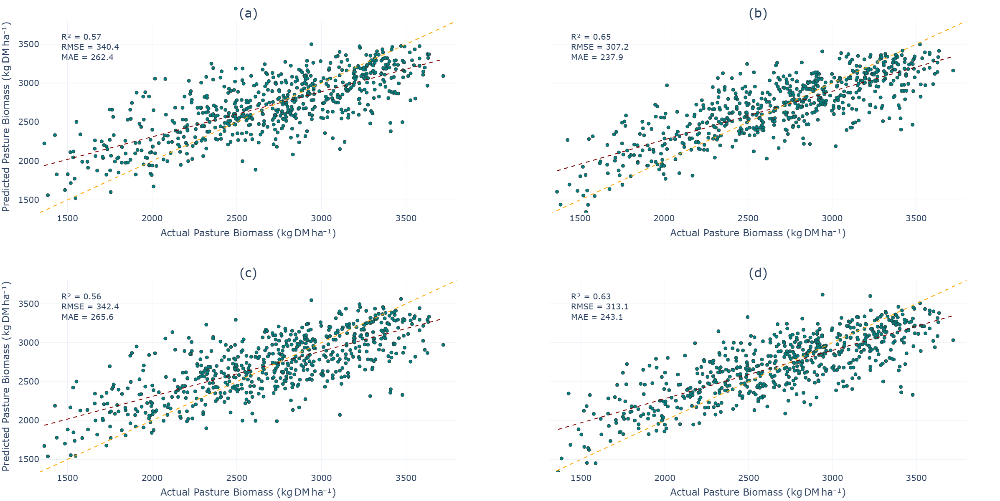

C:\Users\bnnen\anaconda3\envs\virtual1\Lib\site-packages\PIL\Image.py:3368: DecompressionBombWarning:

Image size (144000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.



✓ High-quality TIFF saved to: visual/Non_interpolated_2x2_test.tiff


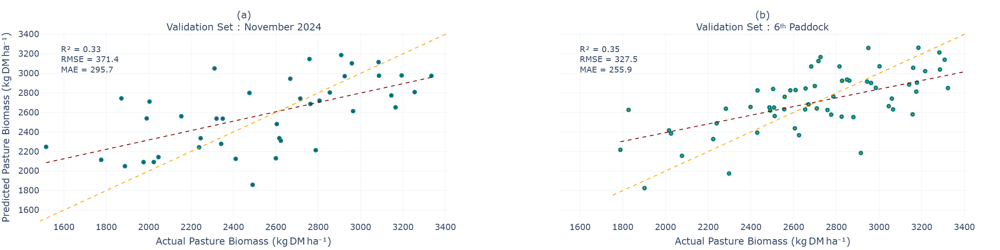

✓ High-quality TIFF saved to: visual/Non_interpolated_1x2_val.tiff


In [3]:
import os
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import math

# --- Function to load Non_interpolated results for one scenario ---
def load_non_interpolated_results(scenario_name):
    label = "Non_interpolated"
    summary_file = os.path.join("modelling_results", f"{scenario_name}_{label}_summary.xlsx")
    if not os.path.exists(summary_file):
        raise FileNotFoundError(f"File not found: {summary_file}")
    with pd.ExcelFile(summary_file) as xls:
        test_data     = pd.read_excel(xls, sheet_name="Test_Data")
        val1_data     = pd.read_excel(xls, sheet_name="Val1_Nov2024")
        val2_data     = pd.read_excel(xls, sheet_name="Val2_6thPaddock")
        summary_df    = pd.read_excel(xls, sheet_name="Summary")
        val1_metrics  = pd.read_excel(xls, sheet_name="Val1_Metrics")
        val2_metrics  = pd.read_excel(xls, sheet_name="Val2_Metrics")
    return test_data, val1_data, val2_data, summary_df, val1_metrics, val2_metrics

# helper: compute lower/upper bounds and regression line data
# - returns (lower, upper, reg_x, reg_y)
# - if first_upper_ref[0] is None, we treat this as the "first subplot" and store its upper there
def _compute_axes_and_regression(x, y, first_upper_ref):
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x_valid = np.array(x)[mask]
    y_valid = np.array(y)[mask]

    combined = np.concatenate([x_valid, y_valid]) if (x_valid.size + y_valid.size) > 0 else np.array([])

    if combined.size > 0:
        data_min = float(np.nanmin(combined))
        data_max = float(np.nanmax(combined))
    else:
        data_min = 0.0
        data_max = 0.0

    # compute proposed upper (small margin)
    proposed_upper = data_max * 1.02 if data_max > 0 else (data_max + 1.0)
    if proposed_upper > 10:
        proposed_upper = math.ceil(proposed_upper / 10.0) * 10.0
    else:
        proposed_upper = math.ceil(proposed_upper)

    # if first subplot has not set the shared upper, use proposed and set it
    if first_upper_ref[0] is None:
        first_upper_ref[0] = proposed_upper
    # use the first subplot's upper for all subsequent subplots
    upper = float(first_upper_ref[0])

    # compute lower from data (small downward margin), but not forcing to zero
    if combined.size > 0:
        if data_min >= 0:
            lower = data_min * 0.98
        else:
            lower = data_min * 1.02
        # if min == max, give a small symmetric padding
        if math.isclose(data_min, data_max, rel_tol=1e-9):
            pad = max(1.0, abs(data_max) * 0.05)
            lower = data_min - pad
            # if first_upper_ref was None, ensure upper updated accordingly (kept consistent by above)
    else:
        lower = 0.0

    # prepare regression line if possible
    reg_x = reg_y = None
    try:
        if x_valid.size >= 2 and y_valid.size >= 2 and (np.nanstd(x_valid) > 0) and (np.nanstd(y_valid) > 0):
            coeffs = np.polyfit(x_valid, y_valid, 1)
            slope, intercept = coeffs[0], coeffs[1]
            x_line = np.linspace(np.nanmin(x_valid), np.nanmax(x_valid), 100)
            y_line = slope * x_line + intercept
            reg_x = x_line
            reg_y = y_line
    except Exception:
        reg_x = reg_y = None

    return lower, upper, reg_x, reg_y

# --- 2×2 Test‐Set Plot ---
def plot_2x2_non_interpolated_test(scenarios, target_var="remote_cover"):
    fig = make_subplots(
        rows=2, cols=2,
        shared_yaxes=True,
        subplot_titles=["(a)","(b)","(c)","(d)"],
        vertical_spacing=0.15, horizontal_spacing=0.10
    )

    # container to hold the first subplot's upper bound (shared across the figure)
    first_upper_ref = [None]

    for idx, scenario_name in enumerate(scenarios):
        test_data, _, _, summary_df, _, _ = load_non_interpolated_results(scenario_name)
        pred_col = [c for c in test_data.columns if c.endswith("_pred")][0]
        metrics = summary_df[summary_df["model"] == pred_col.replace("_pred", "")].iloc[0]

        row = idx // 2 + 1
        col = idx % 2 + 1

        fig.add_trace(
            go.Scatter(
                x=test_data[target_var],
                y=test_data[pred_col],
                mode="markers",
                marker=dict(symbol="circle", color="teal", size=8,
                            line=dict(width=1, color="#2E2E2E")),
                showlegend=False
            ),
            row=row,
            col=col
        )

        # compute axes and regression (this will set first_upper_ref[0] on the very first subplot)
        lower, upper, reg_x, reg_y = _compute_axes_and_regression(test_data[target_var].values, test_data[pred_col].values, first_upper_ref)

        # add orange thicker regression line if available
        if reg_x is not None and reg_y is not None:
            fig.add_trace(
                go.Scatter(
                    x=reg_x,
                    y=reg_y,
                    mode="lines",
                    line=dict(color="maroon", dash="dash", width=2),
                    showlegend=False
                ),
                row=row,
                col=col
            )

        # add orange one-to-one line
        fig.add_trace(
            go.Scatter(
                x=[lower, upper],
                y=[lower, upper],
                mode="lines",
                line=dict(color="orange", dash="dash", width=2),
                showlegend=False
            ),
            row=row,
            col=col
        )
                    

        # apply axis ranges: use lower (data-derived) and the shared upper (from first subplot)
        fig.update_xaxes(range=[lower, upper], row=row, col=col)
        fig.update_yaxes(range=[lower, upper], row=row, col=col)

        annot = (
            f"R² = {metrics['test_r2']:.2f}<br>"
            f"RMSE = {metrics['test_rmse']:.1f}<br>"
            f"MAE = {metrics['test_mae']:.1f}"
        )
        fig.add_annotation(
            xref="x domain",
            yref="y domain",
            x=0.05,
            y=0.95,
            text=annot,
            showarrow=False,
            font=dict(size=19),
            xanchor="left",
            yanchor="top",
            align="left",
            row=row,
            col=col
        )

        fig.update_xaxes(
            title_text=f"Actual Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)",
            row=row,
            col=col,
            title_font=dict(size=23),
            tickfont=dict(size=20)
        )
        fig.update_yaxes(
            title_text=f"Predicted Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)",
            row=row,
            col=col,
            title_font=dict(size=23),
            tickfont=dict(size=20)
        )

    # remove only the title on the right column, keep ticks
    fig.update_yaxes(title_text="", row=1, col=2)
    fig.update_yaxes(title_text="", row=2, col=2)

    for ann in fig.layout.annotations:
        if ann.text in ["(a)", "(b)", "(c)", "(d)"]:
            ann.font.size = 30

    fig.update_layout(
        template="plotly_white",
        width=1200,
        height=1200,
        margin=dict(l=80, r=80, t=50, b=50)
    )

    os.makedirs("visualisations", exist_ok=True)
    out = "visualisations/Non_interpolated_2x2_test.svg"
    pio.write_image(fig, out, format="svg", scale=1)
    fig.show()

    # --- ADD THIS BLOCK to also export high-quality TIFF to visual/ ---
    from PIL import Image

    os.makedirs("visual", exist_ok=True)
    png_out  = "visual/Non_interpolated_2x2_test.png"
    tiff_out = "visual/Non_interpolated_2x2_test.tiff"

    # Export very high-res PNG (use same figure size, big scale for crisp text/lines)
    pio.write_image(
        fig,
        png_out,
        format="png",
        width=1200,
        height=1200,
        scale=10
    )

    # Convert PNG → TIFF (LZW compression, 600 DPI)
    with Image.open(png_out) as im:
        # If publisher requires CMYK, uncomment the next line:
        # im = im.convert("CMYK")
        im.save(tiff_out, format="TIFF", compression="tiff_lzw", dpi=(600, 600))
    print(f"✓ High-quality TIFF saved to: {tiff_out}")



# --- 1×2 Validation‐Set Plot ---
def plot_1x2_non_interpolated_val(scenarios, target_var="remote_cover"):
    scenario_name = "All_the_Bands_with_Weather_Data_without_Indices"
    _, val1_data, val2_data, _, val1_metrics, val2_metrics = load_non_interpolated_results(scenario_name)
    pred_col = [c for c in val1_data.columns if c.endswith("_pred")][0]

    fig = make_subplots(
        rows=1, cols=2,
        shared_yaxes=True,
        subplot_titles=["Validation Set\u00A0: November\u00A02024", "Validation Set\u00A0: 6\u1d57\u02b0\u00A0Paddock"],
        horizontal_spacing=0.12
    )

    # shared upper for this figure
    first_upper_ref = [None]

    # (a) Nov2024 (left subplot, row=1, col=1)
    m1 = val1_metrics.iloc[0]
    fig.add_trace(
        go.Scatter(
            x=val1_data[target_var],
            y=val1_data[pred_col],
            mode="markers",
            marker=dict(symbol="circle", color="purple", size=7,
                        line=dict(width=4, color="teal")),
            showlegend=False
        ),
        row=1,
        col=1
    )
    # compute axes/regression and set them (this will set the shared upper from subplot 1)
    lower1, upper1, reg_x1, reg_y1 = _compute_axes_and_regression(val1_data[target_var].values, val1_data[pred_col].values, first_upper_ref)
    if reg_x1 is not None and reg_y1 is not None:
        # maroon dashed regression line for left plot
        fig.add_trace(
            go.Scatter(
                x=reg_x1,
                y=reg_y1,
                mode="lines",
                line=dict(color="maroon", dash="dash", width=2),
                showlegend=False
            ),
            row=1,
            col=1
        )
        # orange one-to-one line for left plot
        fig.add_trace(
            go.Scatter(
                x=[lower1, upper1],
                y=[lower1, upper1],
                mode="lines",
                line=dict(color="orange", dash="dash", width=2),
                showlegend=False
            ),
            row=1,
            col=1
        )
    fig.update_xaxes(range=[lower1, first_upper_ref[0]], row=1, col=1)
    fig.update_yaxes(range=[lower1, first_upper_ref[0]], row=1, col=1)

    # (a) LEFT subplot metrics annotation (you were missing this)
    annot1 = (
        f"R² = {m1['r2']:.2f}<br>"
        f"RMSE = {m1['rmse']:.1f}<br>"
        f"MAE = {m1['mae']:.1f}"
    )
    fig.add_annotation(
        xref="x domain",
        yref="y domain",
        x=0.05,
        y=0.95,
        text=annot1,
        showarrow=False,
        font=dict(size=19),
        xanchor="left",
        yanchor="top",
        align="left",
        row=1,
        col=1
    )

    
    # (b) 6th Paddock (right subplot, row=1, col=2)
    m2 = val2_metrics.iloc[0]
    fig.add_trace(
        go.Scatter(
            x=val2_data[target_var],
            y=val2_data[pred_col],
            mode="markers",
            marker=dict(symbol="circle", color="orange", size=7,
                        line=dict(width=4, color="teal")),
            showlegend=False
        ),
        row=1,
        col=2
    )
    # compute axes/regression for subplot 2 (reuse first_upper_ref[0] as upper)
    lower2, upper2, reg_x2, reg_y2 = _compute_axes_and_regression(val2_data[target_var].values, val2_data[pred_col].values, first_upper_ref)
    if reg_x2 is not None and reg_y2 is not None:
        # maroon dashed regression line for right plot
        fig.add_trace(
            go.Scatter(
                x=reg_x2,
                y=reg_y2,
                mode="lines",
                line=dict(color="maroon", dash="dash", width=2),
                showlegend=False
            ),
            row=1,
            col=2
        )
        # orange one-to-one line for right plot
        fig.add_trace(
            go.Scatter(
                x=[lower2, upper2],
                y=[lower2, upper2],
                mode="lines",
                line=dict(color="orange", dash="dash", width=2),
                showlegend=False
            ),
            row=1,
            col=2
        )
    fig.update_xaxes(range=[lower2, first_upper_ref[0]], row=1, col=2)
    fig.update_yaxes(range=[lower2, first_upper_ref[0]], row=1, col=2)



    annot2 = (
        f"R² = {m2['r2']:.2f}<br>"
        f"RMSE = {m2['rmse']:.1f}<br>"
        f"MAE = {m2['mae']:.1f}"
    )
    fig.add_annotation(
        xref="x domain",
        yref="y domain",
        x=0.05,
        y=0.95,
        text=annot2,
        showarrow=False,
        font=dict(size=19),
        xanchor="left",
        yanchor="top",
        align="left",
        row=1,
        col=2
    )

    for col in [1, 2]:
        fig.update_xaxes(
            title_text=f"Actual Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)",
            row=1,
            col=col,
            title_font=dict(size=23),
            tickfont=dict(size=20)
        )
        if col == 1:
            fig.update_yaxes(
                title_text=f"Predicted Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)",
                row=1,
                col=col,
                title_font=dict(size=23),
                tickfont=dict(size=20)
            )
        else:
            fig.update_yaxes(title_text="", row=1, col=col)

    # --- Modify Validation Set subtitles ---
    count = 0
    for ann in fig.layout.annotations:
        if "Validation Set" in ann.text:
            count += 1
            label = "(a)" if count == 1 else "(b)"
            ann.text = f"{label}<br>{ann.text}"
            ann.font.size = 23
    
    fig.update_layout(
        template="plotly_white",
        width=1100,
        height=600,
        margin=dict(l=80, r=80, t=80, b=50)
    )


    # for ann in fig.layout.annotations:
    #     if "Validation Set" in ann.text:
    #         ann.font.size = 23

    # fig.update_layout(
    #     template="plotly_white",
    #     width=1100,
    #     height=600,
    #     margin=dict(l=80, r=80, t=50, b=50)
    # )

    # use 1500 as minimum instead of lower2 for second subplot
    fig.update_xaxes(range=[1500, first_upper_ref[0]], row=1, col=2)
    # fig.update_yaxes(range=[1500, first_upper_ref[0]], row=1, col=2)


    os.makedirs("visualisations", exist_ok=True)
    out = "visualisations/Non_interpolated_1x2_val.svg"
    pio.write_image(fig, out, format="svg", scale=1)
    fig.show()

    # --- ADD THIS BLOCK to also export high-quality TIFF to visual/ ---
    from PIL import Image

    os.makedirs("visual", exist_ok=True)
    png_out  = "visual/Non_interpolated_1x2_val.png"
    tiff_out = "visual/Non_interpolated_1x2_val.tiff"

    # Export very high-res PNG (match fig size, big scale)
    pio.write_image(
        fig,
        png_out,
        format="png",
        width=1100,
        height=600,
        scale=10
    )

    # Convert PNG → TIFF (LZW compression, 600 DPI)
    with Image.open(png_out) as im:
        # If publisher requires CMYK, uncomment the next line:
        # im = im.convert("CMYK")
        im.save(tiff_out, format="TIFF", compression="tiff_lzw", dpi=(600, 600))
    print(f"✓ High-quality TIFF saved to: {tiff_out}")


# --- Define scenarios exactly as in your modelling code ---
scenarios = {
    "All_the_Bands_with_Indices_without_Weather_Data": [...],
    "All_the_Bands_with_Weather_Data_with_Indices": [...],
    "All_the_Bands_Alone_without_Indices_and_without_Weather_Data": [...],
    "All_the_Bands_with_Weather_Data_without_Indices": [...]
}

# --- Run both plots ---
plot_2x2_non_interpolated_test(scenarios)
plot_1x2_non_interpolated_val(scenarios)


### Part 2: Impact of Interpolation on Model Performance

#### Modelling Code

In [363]:
"""
compare_interpolation_methods.py

This script evaluates the impact of different spatial interpolation methods on 
predicting remote biomass cover (remote_cover) using an XGBoost regressor with 
the feature set "All the Bands with Weather Data without Indices".

Interpolation variants modeled:
  - poly2: polynomial regression interpolation on all dates
  - rbf: Gaussian RBF interpolation on all dates
  - mq: multiquadric interpolation on all dates
  - mcg: minimum-curvature interpolation on all dates
  - k: kriging interpolation on all dates
  - yip_...: same five methods applied only to dates before April 1, 2023 (Year 1)
  - y2ip_...: same five methods applied only to dates on/after April 1, 2023 (Year 2)

Cross‑validation:
  - RepeatedKFold with 5 splits × 3 repeats for stable hyperparameter tuning

Validation sets:
  - Nov2024 (val_set_1_new): 41 rows (main five monitored paddocks per farm)
  - Paddock6   (val_set_4_new): 63 rows (sixth extra paddock per farm)

Outputs:
  - Prints train/test split shapes and validation metrics (R², MAE)
  - Saves test and validation predictions and metrics to Excel and pickle in 
    "modelling_results" folder.
"""

import time, os, pickle, warnings
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, RepeatedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, OrdinalEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

warnings.filterwarnings("ignore", category=UserWarning, module="zipfile")

# ───────── helpers (unchanged) ─────────
def _compute_metrics(actual, predicted):
    mse  = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    return {
        'mse': mse,
        'rmse': rmse,
        'r2': r2_score(actual, predicted),
        'mae': mean_absolute_error(actual, predicted)
    }

def _train_and_evaluate_all_models(
    train_df, test_df, cat_preds, num_preds,
    target_var, model_dict,
    scoring_metric='neg_mean_absolute_error',
    k_folds=5, cv_repeats=3, optimize=True,
    numeric_scaler_type="standard",
    categorical_encoder_type="onehot",
    random_state=42
):
    """
    Train each model using RepeatedKFold CV, then evaluate on test_df.
    Returns best_info, test_out (with predictions), and summary DataFrame.
    """
    X_tr, y_tr = train_df[cat_preds + num_preds], train_df[target_var]
    X_te, y_te = test_df[cat_preds + num_preds], test_df[target_var]

    num_scaler = StandardScaler() if numeric_scaler_type=="standard" else MinMaxScaler()
    cat_enc    = OneHotEncoder(handle_unknown='ignore') if categorical_encoder_type=="onehot" else OrdinalEncoder()
    preproc    = ColumnTransformer([('cat', cat_enc, cat_preds),
                                    ('num', num_scaler, num_preds)])

    best_info, best_cv, summary = None, -np.inf, []

    rkf = RepeatedKFold(n_splits=k_folds, n_repeats=cv_repeats, random_state=random_state)
    for name, spec in model_dict.items():
        pipe = Pipeline([('pre', preproc), ('model', spec['estimator'])])
        grid = GridSearchCV(
            pipe,
            param_grid=(spec['param_grid'] if optimize else {}),
            scoring=scoring_metric,
            cv=rkf,
            n_jobs=-1,
            refit=True
        )
        grid.fit(X_tr, y_tr)

        cv_score = grid.best_score_
        preds_te = grid.best_estimator_.predict(X_te)
        met_te   = _compute_metrics(y_te, preds_te)

        print(f"\n{name}: CV={cv_score:.4f}  "
              f"Test R²={met_te['r2']:.4f}, "
              f"MSE={met_te['mse']:.2f}, RMSE={met_te['rmse']:.2f}, "
              f"MAE={met_te['mae']:.2f}")

        if cv_score > best_cv:
            best_cv = cv_score
            best_info = {
                'name': name,
                'best_model': grid.best_estimator_,
                'metrics': met_te,
                'cv_score': cv_score
            }

        summary.append({
            'model': name,
            'cv_score': cv_score,
            **{f"test_{k}": v for k, v in met_te.items()}
        })

    test_out = test_df.copy()
    if best_info:
        test_out[f"{best_info['name']}_pred"] = best_info['best_model'].predict(X_te)
        print(f"→ Best: {best_info['name']} (CV={best_info['cv_score']:.4f})")

    return best_info, test_out, pd.DataFrame(summary)

def evaluate_model_on_validation(best_info, val_df, cat_preds, num_preds, target_var):
    """
    Generate predictions on val_df using best_info['best_model'] and compute metrics.
    """
    if best_info is None:
        return None, None
    X_val = val_df[cat_preds + num_preds]
    y_val = val_df[target_var]
    preds = best_info['best_model'].predict(X_val)
    return _compute_metrics(y_val, preds), val_df.assign(**{f"{best_info['name']}_pred": preds})

# ───────── Main Execution ─────────
if __name__ == "__main__":
    start = time.time()

    cat_preds = ['Farm Code', 'pcode', 'Season', 'Region', 'grazing']
    target_var = 'remote_cover'

    # only ONE feature scenario
    scenarios = {
        "All_the_Bands_with_Weather_Data_without_Indices": [
            'T.Max','T.Min','Evap','Radn','VP','Rainfall',
            'RHmaxT','RHminT','blue','green','red','nir',
            'rededge1','rededge2','rededge3','swir2','swir3'
        ]
    }

    model_dict = {
        'xgboost': {
            'estimator': XGBRegressor(random_state=42,
                                      use_label_encoder=False,
                                      objective="reg:squarederror"),
            'param_grid': {
                'model__n_estimators': [50,100,150,200,250,300,350,400,450],
                'model__learning_rate': [0.01,0.1,0.2],
                'model__max_depth': [3,5]
            }
        }
    }

    random_state   = 42
    scenarios_data = {
        "poly2"    : d_model_ip_new,
        "rbf"      : d_model_new_rbf,
        "mq"       : d_model_new_mq,
        "mcg"      : d_model_new_mcg,
        "k"        : d_model_new_k,
        "yip_poly2": d_model_yip_new,
        "yip_rbf"  : d_model_new_yip_rbf,
        "yip_mq"   : d_model_new_yip_mq,
        "yip_mcg"  : d_model_new_yip_mcg,
        "yip_k"    : d_model_new_yip_k,
        "y2ip_poly2": d_model_y2ip_new,
        "y2ip_rbf"  : d_model_new_y2ip_rbf,
        "y2ip_mq"   : d_model_new_y2ip_mq,
        "y2ip_mcg"  : d_model_new_y2ip_mcg,
        "y2ip_k"    : d_model_new_y2ip_k
    }

    val1, val1_name = val_set_1_new, "Nov2024"
    val2, val2_name = val_set_4_new, "Paddock6"

    all_results = {}
    os.makedirs("modelling_results", exist_ok=True)

    for scenario_name, num_preds in scenarios.items():
        print(f"\n========== {scenario_name} ==========")
        for label, df in scenarios_data.items():
            print(f"\nProcessing dataset: {label}")

            tr, te = train_test_split(df, test_size=0.1, random_state=random_state)
            print(f"Train set shape: {tr.shape} | Test set shape: {te.shape}")
            print(f"Validation 1 ({val1_name}) set shape: {val1.shape}")
            print(f"Validation 2 ({val2_name}) set shape: {val2.shape}")

            best, test_out, summary_df = _train_and_evaluate_all_models(
                tr, te, cat_preds, num_preds, target_var,
                model_dict,
                scoring_metric='neg_mean_absolute_error',
                k_folds=5,
                cv_repeats=3,
                optimize=True,
                numeric_scaler_type="standard",
                categorical_encoder_type="onehot",
                random_state=random_state
            )

            mets1, df1 = evaluate_model_on_validation(best, val1, cat_preds, num_preds, target_var)
            mets2, df2 = evaluate_model_on_validation(best, val2, cat_preds, num_preds, target_var)
            print(f"Validation 1 ({val1_name})  : R²={mets1['r2']:.4f}  MAE={mets1['mae']:.2f}")
            print(f"Validation 2 ({val2_name}) : R²={mets2['r2']:.4f}  MAE={mets2['mae']:.2f}")

            all_results[label] = {
                'best_info': best,
                'test_with_pred': test_out,
                'summary_df': summary_df,
                'val1_metrics': mets1,
                'val1_data': df1,
                'val2_metrics': mets2,
                'val2_data': df2
            }

            summary_file = os.path.join(
                "modelling_results",
                f"{scenario_name}_{label}_summary.xlsx"
            )
            with pd.ExcelWriter(summary_file) as xl:
                summary_df.to_excel(xl, "Summary", index=False)
                test_out.to_excel(xl, "Test_Data", index=False)
                df1.to_excel(xl, "Val1_Nov2024", index=False)
                df2.to_excel(xl, "Val2_6thPaddock", index=False)
                pd.DataFrame([mets1]).to_excel(xl, "Val1_Metrics", index=False)
                pd.DataFrame([mets2]).to_excel(xl, "Val2_Metrics", index=False)
            print("Saved Excel:", summary_file)

            pkl_path = os.path.join("modelling_results", f"{scenario_name}_{label}.pkl")
            with open(pkl_path, "wb") as f:
                pickle.dump(all_results, f)
            print("Saved pickle:", pkl_path)

    print(f"\nTotal execution time: {time.time() - start:.2f} s")


========== All_the_Bands_with_Weather_Data_without_Indices ==========

Processing dataset: poly2
Train set shape: (8820, 50) | Test set shape: (980, 50)
Validation 1 (Nov2024) set shape: (41, 56)
Validation 2 (Paddock6) set shape: (63, 56)

xgboost: CV=-236.2908  Test R²=0.6868, MSE=88453.76, RMSE=297.41, MAE=220.44
→ Best: xgboost (CV=-236.2908)
Validation 1 (Nov2024)  : R²=0.5420  MAE=233.02
Validation 2 (Paddock6) : R²=0.3041  MAE=264.26
Saved Excel: modelling_results\All_the_Bands_with_Weather_Data_without_Indices_poly2_summary.xlsx
Saved pickle: modelling_results\All_the_Bands_with_Weather_Data_without_Indices_poly2.pkl

Processing dataset: rbf
Train set shape: (8172, 50) | Test set shape: (909, 50)
Validation 1 (Nov2024) set shape: (41, 56)
Validation 2 (Paddock6) set shape: (63, 56)

xgboost: CV=-268.7810  Test R²=0.6081, MSE=124163.90, RMSE=352.37, MAE=255.71
→ Best: xgboost (CV=-268.7810)
Validation 1 (Nov2024)  : R²=-0.1226  MAE=366.39
Validation 2 (Paddock6) : R²=0.2558  MA

#### Plotting Codes

In [ ]:
import os
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

# --- Helper to load R² and MAE for xgboost (unchanged) ---
# --- Plot Year 1 & Year 2 in a single 1×2 figure ---
# --- Plot Year 1 & Year 2 in a single 1×2 figure ---
def plot_interpolation_year1_year2(scenario_name):
    # lookup labels (unchanged) ⇩
    labels_y1 = ["Non_interpolated", "yip_poly2", "yip_rbf", "yip_mq", "yip_mcg"]
    labels_y2 = ["Non_interpolated", "y2ip_poly2", "y2ip_rbf", "y2ip_mq", "y2ip_mcg"]

    # shorter x-axis display names
    disp = ["Non_ip", "poly2", "rbf", "mq", "mcg"]
    x_y1, x_y2 = disp, disp           # keep separate for clarity

    # load metrics
    r2_y1, mae_y1 = zip(*(load_metrics(scenario_name, l) for l in labels_y1))
    r2_y2, mae_y2 = zip(*(load_metrics(scenario_name, l) for l in labels_y2))
    base1, base2 = mae_y1[0], mae_y2[0]

    # 1 × 2 figure with shared‐y axes
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Year 1 Interpolation Only", "Year 2 Interpolation Only"],
        specs=[[{"secondary_y": True}, {"secondary_y": True}]],
        horizontal_spacing=0.15,
        shared_yaxes=True
    )

    # helper to avoid duplication
    panels = [
        (x_y1, r2_y1, mae_y1, base1, "x1", "y2"),
        (x_y2, r2_y2, mae_y2, base2, "x2", "y4")
    ]

    for idx, (xlabels, r2_vals, mae_vals, base, xref, yref) in enumerate(panels, start=1):
        show_leg = (idx == 1)  # show legend only once

        # bar – R²
        fig.add_trace(
            go.Bar(x=xlabels, y=r2_vals, name="Test R²",
                   marker=dict(color="#E8C1C8"), showlegend=show_leg),
            row=1, col=idx, secondary_y=False
        )

        # line – MAE
        fig.add_trace(
            go.Scatter(x=xlabels, y=mae_vals, mode="lines+markers", name="Test MAE",
                       line=dict(color="#C48E92", width=5, shape="spline", smoothing=0.3),
                       marker=dict(color="teal", size=10,
                                   line=dict(color="darkgray", width=3)),
                       showlegend=show_leg),
            row=1, col=idx, secondary_y=True
        )

        # %-change annotations
        for i, lbl in enumerate(xlabels[1:], start=1):
            pct = (mae_vals[i] - base) / base * 100
            ay  = 55 if pct > 0 else -55
            fig.add_annotation(
                x=lbl, y=mae_vals[i],
                xref=xref, yref=yref,
                text=f"{pct:.1f}%", showarrow=True, arrowhead=2,
                arrowwidth=3, arrowcolor="teal", ax=0, ay=ay,
                font=dict(size=16),
                row=1, col=idx
            )

        # axes
        fig.update_xaxes(title_text="Interpolation Method",
                         row=1, col=idx,
                         title_font=dict(size=23), tickfont=dict(size=20))
        fig.update_yaxes(title_text="Test R²",
                         row=1, col=idx, secondary_y=False,
                         title_font=dict(size=23), tickfont=dict(size=20))
        fig.update_yaxes(title_text="Test MAE (kg DM ha⁻¹)",
                         row=1, col=idx, secondary_y=True,
                         title_font=dict(size=23), tickfont=dict(size=20))

    # enlarge subplot titles to 30 pt
    for ann in fig.layout.annotations:
        if ann.text.strip().replace('\u00A0', ' ') in (
                "Year 1 Interpolation Only", "Year 2 Interpolation Only"):
            ann.font.size = 22

    # nudge titles upward
    for ann in fig.layout.annotations:
        if ann.xref == "paper" and ann.yref == "paper":
            ann.y += 0.17

    fig.update_layout(
        template="plotly_white",
        width=1200, height=600,
        margin=dict(t=120, b=50, l=80, r=80),
        legend=dict(orientation="h", x=0.5, xanchor="center",
                    y=1.00, yanchor="bottom", font=dict(size=18)),
        font=dict(size=14),
        barmode="group"
    )

    # save / show
    os.makedirs("visualisations", exist_ok=True)
    out = os.path.join("visualisations", f"{scenario_name}_year1_year2.svg")
    pio.write_image(fig, out, format="svg", width=1100, height=550, scale=1)
    fig.show()
    print(f"Saved: {out}")

# --- Plot Full‑Year in a 1×1 figure ---
def plot_interpolation_full_year(scenario_name):
    # raw labels used for lookup (leave untouched)
    labels = ["Non_interpolated", "poly2", "rbf", "mq", "mcg"]

    # shorter labels that actually appear on the x-axis
    xlabels = ["Non_ip", "poly2", "rbf", "mq", "mcg"]   # ← just one clean list

    r2_vals, mae_vals = zip(*(load_metrics(scenario_name, l) for l in labels))
    base = mae_vals[0]

    fig = make_subplots(
        rows=1, cols=1,
        subplot_titles=["Full Interpolation - Both Years"],
        specs=[[{"secondary_y": True}]]
    )

    # R² bar
    fig.add_trace(go.Bar(
        x=xlabels, y=r2_vals, name="Test R²",
        marker=dict(color="#E8C1C8"), showlegend=True
    ), row=1, col=1, secondary_y=False)

    # MAE line
    fig.add_trace(go.Scatter(
        x=xlabels, y=mae_vals, mode="lines+markers", name="Test MAE",
        line=dict(color="#C48E92", width=5, shape="spline", smoothing=0.3),
        marker=dict(color="teal", size=10, line=dict(color="darkgray", width=3)),
        showlegend=True
    ), row=1, col=1, secondary_y=True)

    # Annotations use same structure as Year1/Year2
    for i, lbl in enumerate(xlabels[1:], start=1):
        pct = (mae_vals[i] - base) / base * 100
        ay = 55 if pct > 0 else -55
        fig.add_annotation(
            x=lbl, y=mae_vals[i], xref="x1", yref="y2",
            text=f"{pct:.1f}%", showarrow=True, arrowhead=2,
            arrowwidth=3, arrowcolor="teal", ax=0, ay=ay,
            font=dict(size=16), row=1, col=1
        ) #standoff=15,

    # Axes styling
    fig.update_xaxes(
        title_text="Interpolation Method", row=1, col=1,
        title_font=dict(size=23), tickfont=dict(size=20)
    )
    fig.update_yaxes(
        title_text="Test R²", row=1, col=1, secondary_y=False,
        title_font=dict(size=23), tickfont=dict(size=20)
    )
    fig.update_yaxes(
        title_text="Test MAE (kg DM ha⁻¹)", row=1, col=1, secondary_y=True,
        title_font=dict(size=23), tickfont=dict(size=20)
    )

    # Subplot title size & nudge up
    for ann in fig.layout.annotations:
        if ann.text == "Full Interpolation - Both Years":
            ann.font.size = 22
            ann.y += 0.13

    fig.update_layout(
        template="plotly_white",
        width=600, height=600,
        margin=dict(t=120, b=50, l=80, r=80),
        legend=dict(
            orientation="h",
            x=0.45, xanchor="center",
            y=1.00, yanchor="bottom",
            font=dict(size=18)
        ),
        font=dict(size=14),
        barmode='group'
    )

    os.makedirs("visualisations", exist_ok=True)
    out = os.path.join("visualisations", f"{scenario_name}_full_year.svg")
    pio.write_image(fig, out, format="svg", width=600, height=600, scale=20)
    fig.show()
    print(f"Saved: {out}")

# --- Usage ---
scenario = "All_the_Bands_with_Weather_Data_without_Indices"
plot_interpolation_year1_year2(scenario)
plot_interpolation_full_year(scenario)

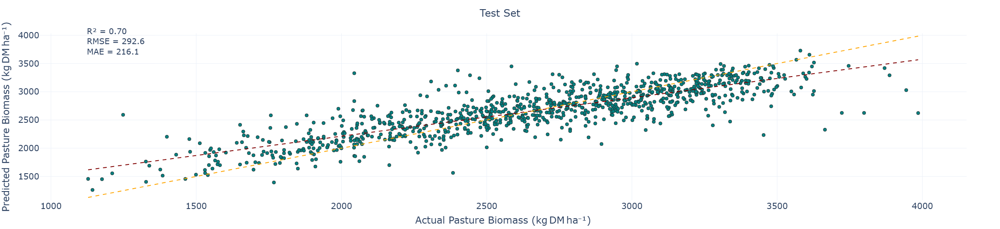

Saved: visualisations/All_the_Bands_with_Weather_Data_without_Indices_mq_test.svg


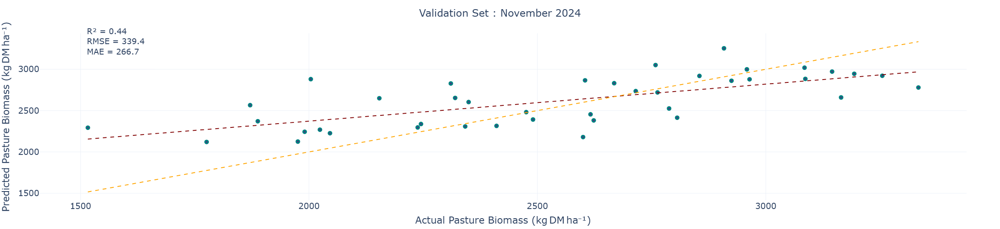

Saved: visualisations/All_the_Bands_with_Weather_Data_without_Indices_mq_val1.svg


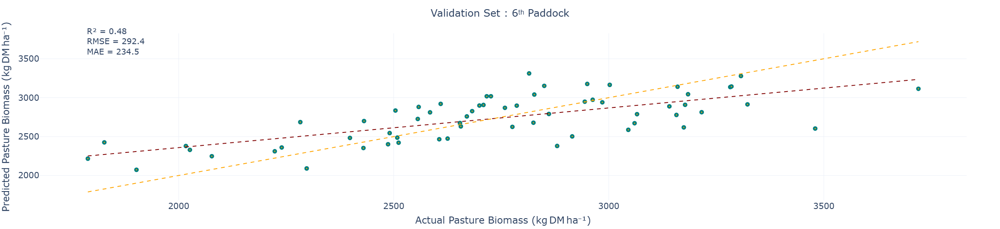

Saved: visualisations/All_the_Bands_with_Weather_Data_without_Indices_mq_val2.svg


In [56]:
import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio

# ——— Helper to load results for any label ———
def load_interpolation_results(scenario_name, label):
    """
    Loads Test, Val1, Val2 and metrics for a given scenario_name and label
    (e.g. label="mq" for multiquadric) from the "modelling_results" folder.
    """
    summary_file = os.path.join("modelling_results", f"{scenario_name}_{label}_summary.xlsx")
    if not os.path.exists(summary_file):
        raise FileNotFoundError(f"File not found: {summary_file}")
    with pd.ExcelFile(summary_file) as xls:
        test_data    = pd.read_excel(xls, sheet_name="Test_Data")
        val1_data    = pd.read_excel(xls, sheet_name="Val1_Nov2024")
        val2_data    = pd.read_excel(xls, sheet_name="Val2_6thPaddock")
        summary_df   = pd.read_excel(xls, sheet_name="Summary")
        val1_metrics = pd.read_excel(xls, sheet_name="Val1_Metrics")
        val2_metrics = pd.read_excel(xls, sheet_name="Val2_Metrics")
    return test_data, val1_data, val2_data, summary_df, val1_metrics, val2_metrics

# ——— Helper to add maroon regression line (dash, width=2) ———
def _add_maroon_regression(fig, x_series, y_series):
    x = np.asarray(x_series)
    y = np.asarray(y_series)
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x_valid = x[mask]
    y_valid = y[mask]
    if x_valid.size >= 2 and y_valid.size >= 2 and (np.nanstd(x_valid) > 0) and (np.nanstd(y_valid) > 0):
        coeffs = np.polyfit(x_valid, y_valid, 1)
        slope, intercept = coeffs[0], coeffs[1]
        x_line = np.linspace(np.nanmin(x_valid), np.nanmax(x_valid), 100)
        y_line = slope * x_line + intercept
        fig.add_trace(
            go.Scatter(
                x=x_line,
                y=y_line,
                mode="lines",
                line=dict(color="maroon", dash="dash", width=2),
                showlegend=False,
                name="Regression Line"
            )
        )

# ——— Helper to add orange 1:1 line (dash, width=2) ———
def _add_orange_one_to_one(fig, x_series, y_series):
    combined = np.concatenate([np.asarray(x_series), np.asarray(y_series)])
    if combined.size > 0:
        lower = np.nanmin(combined)
        upper = np.nanmax(combined)
        fig.add_trace(
            go.Scatter(
                x=[lower, upper],
                y=[lower, upper],
                mode="lines",
                line=dict(color="orange", dash="dash", width=2),
                showlegend=False,
                name="1:1 Line"
            )
        )

# ——— Helper to compute consistent y-axis limits with padding ———
def get_yaxis_limits(data_list, target_var, pred_suffix="_pred", padding=50):
    """
    Given a list of DataFrames, get the global min and max of the target_var and predicted columns.
    padding: add a small buffer above and below
    """
    y_mins = []
    y_maxs = []
    for df in data_list:
        pred_col = [c for c in df.columns if c.endswith(pred_suffix)][0]
        combined = np.concatenate([df[target_var].values, df[pred_col].values])
        y_mins.append(np.nanmin(combined))
        y_maxs.append(np.nanmax(combined))
    y_min = max(0, min(y_mins) - padding)  # y-axis minimum should not be negative
    y_max = max(y_maxs) + padding
    return y_min, y_max

# ——— Plot TEST only ———
def plot_mq_test(scenario_name, target_var="remote_cover", yaxis_limits=None):
    test_data, _, _, summary_df, _, _ = load_interpolation_results(scenario_name, "mq")
    pred_col = [c for c in test_data.columns if c.endswith("_pred")][0]
    model    = pred_col.replace("_pred", "")
    m        = summary_df[summary_df["model"]==model].iloc[0]

    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=test_data[target_var],
        y=test_data[pred_col],
        mode="markers",
        marker=dict(symbol="circle", color="teal", size=8, line=dict(width=1, color="#2E2E2E")),
        showlegend=False
    ))

    _add_maroon_regression(fig, test_data[target_var], test_data[pred_col])
    _add_orange_one_to_one(fig, test_data[target_var], test_data[pred_col])

    annot = (
        f"R² = {m['test_r2']:.2f}<br>"
        f"RMSE = {m['test_rmse']:.1f}<br>"
        f"MAE = {m['test_mae']:.1f}"
    )
    fig.add_annotation(
        xref="x domain", yref="y domain",
        x=0.05, y=1.05, text=annot, showarrow=False,
        font=dict(size=19), xanchor="left", yanchor="top", align="left"
    )
    fig.update_xaxes(title_text=f"Actual Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)", title_font=dict(size=23), tickfont=dict(size=20))
    fig.update_yaxes(title_text=f"Predicted Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)", title_font=dict(size=23), tickfont=dict(size=20))

    if yaxis_limits:
        fig.update_yaxes(range=yaxis_limits)

    fig.update_layout(
        title_text="Test Set", title_font_size=24,
        title_x=0.5,
        template="plotly_white", width=550, height=550,
        margin=dict(l=80, r=80, t=80, b=50)
    )
    os.makedirs("visualisations", exist_ok=True)
    out = f"visualisations/{scenario_name}_mq_test.svg"
    pio.write_image(fig, out, format="svg", scale=1)
    fig.show()
    print(f"Saved: {out}")

# ——— Plot VAL1 only ———
def plot_mq_val1(scenario_name, target_var="remote_cover", yaxis_limits=None):
    _, val1_data, _, _, val1_metrics, _ = load_interpolation_results(scenario_name, "mq")
    pred_col = [c for c in val1_data.columns if c.endswith("_pred")][0]
    m        = val1_metrics.iloc[0]

    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=val1_data[target_var],
        y=val1_data[pred_col],
        mode="markers",
        marker=dict(symbol="circle", color="purple", size=7, line=dict(width=4, color="teal")),
        showlegend=False
    ))

    # Add maroon regression line
    x = np.asarray(val1_data[target_var])
    y = np.asarray(val1_data[pred_col])
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x_valid = x[mask]
    y_valid = y[mask]
    if x_valid.size >= 2 and y_valid.size >= 2 and (np.nanstd(x_valid) > 0) and (np.nanstd(y_valid) > 0):
        coeffs = np.polyfit(x_valid, y_valid, 1)
        slope, intercept = coeffs[0], coeffs[1]
        x_line = np.linspace(np.nanmin(x_valid), np.nanmax(x_valid), 100)
        y_line = slope * x_line + intercept
        fig.add_trace(
            go.Scatter(
                x=x_line,
                y=y_line,
                mode="lines",
                line=dict(color="maroon", dash="dash", width=2),
                showlegend=False
            )
        )

    # Add orange 1:1 line
    if yaxis_limits is not None:
        lower, upper = yaxis_limits
    else:
        lower = min(np.nanmin(x_valid), np.nanmin(y_valid))
        upper = max(np.nanmax(x_valid), np.nanmax(y_valid))
    fig.add_trace(
        go.Scatter(
            x=[lower, upper],
            y=[lower, upper],
            mode="lines",
            line=dict(color="orange", dash="dash", width=2),
            showlegend=False
        )
    )

    annot = (
        f"R² = {m['r2']:.2f}<br>"
        f"RMSE = {m['rmse']:.1f}<br>"
        f"MAE = {m['mae']:.1f}"
    )
    fig.add_annotation(
        xref="x domain", yref="y domain",
        x=0.05, y=1.05, text=annot, showarrow=False,
        font=dict(size=19), xanchor="left", yanchor="top", align="left"
    )
    fig.update_xaxes(
        title_text=f"Actual Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)",
        title_font=dict(size=23), tickfont=dict(size=20)
    )
    fig.update_yaxes(
        title_text=f"Predicted Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)",
        title_font=dict(size=23), tickfont=dict(size=20)
    )

    if yaxis_limits is not None:
        fig.update_xaxes(range=yaxis_limits)
        fig.update_yaxes(range=yaxis_limits)

    fig.update_layout(
        title_text="Validation Set : November 2024",
        title_font_size=24,
        title_x=0.5,
        template="plotly_white",
        width=550,
        height=550,
        margin=dict(l=80, r=80, t=80, b=50)
    )
    os.makedirs("visualisations", exist_ok=True)
    out = f"visualisations/{scenario_name}_mq_val1.svg"
    pio.write_image(fig, out, format="svg", scale=1)
    fig.show()
    print(f"Saved: {out}")




# ——— Plot VAL2 only ———
def plot_mq_val2(scenario_name, target_var="remote_cover", yaxis_limits=None):
    _, _, val2_data, _, _, val2_metrics = load_interpolation_results(scenario_name, "mq")
    pred_col = [c for c in val2_data.columns if c.endswith("_pred")][0]
    m        = val2_metrics.iloc[0]

    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=val2_data[target_var],
        y=val2_data[pred_col],
        mode="markers",
        marker=dict(symbol="circle", color="orange", size=7, line=dict(width=4, color="teal")),
        showlegend=False
    ))

    _add_maroon_regression(fig, val2_data[target_var], val2_data[pred_col])
    _add_orange_one_to_one(fig, val2_data[target_var], val2_data[pred_col])

    annot = (
        f"R² = {m['r2']:.2f}<br>"
        f"RMSE = {m['rmse']:.1f}<br>"
        f"MAE = {m['mae']:.1f}"
    )
    fig.add_annotation(
        xref="x domain", yref="y domain",
        x=0.05, y=1.05, text=annot, showarrow=False,
        font=dict(size=19), xanchor="left", yanchor="top", align="left"
    )
    fig.update_xaxes(title_text=f"Actual Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)", title_font=dict(size=23), tickfont=dict(size=20))
    fig.update_yaxes(title_text=f"Predicted Pasture Biomass (kg\u202fDM\u202fha\u207B\u00B9)", title_font=dict(size=23), tickfont=dict(size=20))

    if yaxis_limits:
        fig.update_yaxes(range=yaxis_limits)

    fig.update_layout(
        title_text="Validation Set : 6ᵗʰ Paddock", title_font_size=24,
        title_x=0.5,
        template="plotly_white", width=550, height=550,
        margin=dict(l=80, r=80, t=80, b=50)
    )
    os.makedirs("visualisations", exist_ok=True)
    out = f"visualisations/{scenario_name}_mq_val2.svg"
    pio.write_image(fig, out, format="svg", scale=1)
    fig.show()
    print(f"Saved: {out}")

# ——— Main runner ———
if __name__ == "__main__":
    scenario = "All_the_Bands_with_Weather_Data_without_Indices"
    target_var = "remote_cover"

    # Load data once for axis limits
    test_data, val1_data, val2_data, _, _, _ = load_interpolation_results(scenario, "mq")

    # Get y-axis limits for test and validation separately
    test_ymin, test_ymax = get_yaxis_limits([test_data], target_var)
    val_ymin, val_ymax = get_yaxis_limits([val1_data, val2_data], target_var)

    # Plot all three with consistent y-axis per set
    plot_mq_test(scenario, target_var=target_var, yaxis_limits=[test_ymin, test_ymax])
    plot_mq_val1(scenario)
    plot_mq_val2(scenario)


In [21]:
import time
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, RepeatedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor

# ───────── Helpers ─────────
def compute_metrics(actual, predicted):
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    return {
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2_score(actual, predicted),
        'MAE': mean_absolute_error(actual, predicted)
    }

# ───────── Main Execution ─────────
if __name__ == "__main__":
    start = time.time()
    
    # Configuration
    cat_preds = ['Farm Code', 'pcode', 'Season', 'Region', 'grazing']
    num_preds = [
        'T.Max', 'T.Min', 'Evap', 'Radn', 'VP', 'Rainfall',
        'RHmaxT', 'RHminT', 'blue', 'green', 'red', 'nir',
        'rededge1', 'rededge2', 'rededge3', 'swir2', 'swir3'
    ]
    target_var = 'remote_cover'
    random_state = 42
    
    # Model dictionary
    model_dict = {
        'Linear Regression': {
            'estimator': LinearRegression(), 
            'param_grid': {}
        },
        'Lasso Regression': {
            'estimator': Lasso(random_state=42),
            'param_grid': {'model__alpha': [0.001, 0.01, 0.1, 1.0, 10, 100]}
        },
        'Decision Tree': {
            'estimator': DecisionTreeRegressor(random_state=42),
            'param_grid': {
                'model__max_depth': [None, 5, 10],
                'model__min_samples_split': [2, 5, 10]
            }
        },
        'Support Vector Regression': {
            'estimator': SVR(),
            'param_grid': {
                'model__C': [0.1, 1, 10],
                'model__kernel': ['linear', 'rbf']
            }
        },
        'K-Nearest Neighbours': {
            'estimator': KNeighborsRegressor(),
            'param_grid': {
                'model__n_neighbors': [3, 5, 7],
                'model__weights': ['uniform', 'distance']
            }
        },
        'Random Forest': {
            'estimator': RandomForestRegressor(random_state=42),
            'param_grid': {
                'model__n_estimators': [50, 100, 150, 200, 250, 300, 350, 400, 450],
                'model__max_depth': [None, 5, 10]
            }
        },
        'Gradient Boosting Machines': {
            'estimator': GradientBoostingRegressor(random_state=42),
            'param_grid': {
                'model__n_estimators': [50, 100, 150, 200, 250, 300, 350, 400, 450],
                'model__learning_rate': [0.01, 0.1, 0.2],
                'model__max_depth': [3, 5]
            }
        },
        'Extreme Boosting Regressor': {
            'estimator': XGBRegressor(
                random_state=42,
                use_label_encoder=False,
                objective="reg:squarederror"
            ),
            'param_grid': {
                'model__n_estimators': [50, 100, 150, 200, 250, 300, 350, 400, 450],
                'model__learning_rate': [0.01, 0.1, 0.2],
                'model__max_depth': [3, 5]
            }
        }
    }
    
    # Load MQ dataset
    df = d_model_new_mq
    
    # Train/test split
    train_df, test_df = train_test_split(df, test_size=0.1, random_state=random_state)
    print(f"Train set shape: {train_df.shape}")
    print(f"Test set shape: {test_df.shape}\n")
    
    X_train = train_df[cat_preds + num_preds]
    y_train = train_df[target_var]
    X_test = test_df[cat_preds + num_preds]
    y_test = test_df[target_var]
    
    # Preprocessing pipeline
    preprocessor = ColumnTransformer([
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_preds),
        ('num', StandardScaler(), num_preds)
    ])
    
    # RepeatedKFold CV
    rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=random_state)
    
    # Train and evaluate all models
    results = []
    
    for model_name, spec in model_dict.items():
        print(f"Training {model_name}...")
        
        # Create pipeline
        pipeline = Pipeline([
            ('preprocessor', preprocessor),
            ('model', spec['estimator'])
        ])
        
        # GridSearchCV
        grid_search = GridSearchCV(
            pipeline,
            param_grid=spec['param_grid'],
            scoring='neg_mean_absolute_error',
            cv=rkf,
            n_jobs=-1,
            refit=True
        )
        
        grid_search.fit(X_train, y_train)
        
        # Get CV score
        cv_score = grid_search.best_score_
        
        # Predict on test set
        y_pred = grid_search.best_estimator_.predict(X_test)
        
        # Compute test metrics
        test_metrics = compute_metrics(y_test, y_pred)
        
        # Store results
        results.append({
            'Model': model_name,
            'CV Score': cv_score,
            'MSE': test_metrics['MSE'],
            'RMSE': test_metrics['RMSE'],
            'MAE': test_metrics['MAE'],
            'R2': test_metrics['R2']
        })
        
        print(f"  CV Score: {cv_score:.2f}")
        print(f"  Test R²: {test_metrics['R2']:.2f}, MAE: {test_metrics['MAE']:.2f}\n")
    
    # Create summary table
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values('R2', ascending=False).reset_index(drop=True)
    
    # Format the table
    print("\n" + "="*80)
    print("FINAL RESULTS - MQ Interpolation Dataset")
    print("="*80)
    print(results_df.to_string(index=False))
    print("="*80)
    
    print(f"\nTotal execution time: {time.time() - start:.2f} seconds")
# ```

# **Key changes:**
# 1. ✅ Only uses `d_model_new_mq` dataset
# 2. ✅ Uses your 8-model dictionary with proper names
# 3. ✅ No validation sets - only train/test split
# 4. ✅ No Excel/pickle saving
# 5. ✅ Outputs clean table with: Model, CV Score, MSE, RMSE, MAE, R2
# 6. ✅ Sorted by R² (descending) for easy comparison

# **Output will look like:**
# ```
# ================================================================================
# FINAL RESULTS - MQ Interpolation Dataset
# ================================================================================
#                         Model  CV Score          MSE   RMSE    MAE    R2
# Extreme Boosting Regressor     -246.41     98036.41 313.11 243.12  0.63
# Gradient Boosting Machines     -249.08    105539.33 324.87 252.70  0.60
#             Random Forest     -274.80    105868.82 325.37 259.31  0.60
# ...
# ================================================================================

Train set shape: (8834, 50)
Test set shape: (982, 50)

Training Linear Regression...
  CV Score: -308.63
  Test R²: 0.40, MAE: 325.34

Training Lasso Regression...
  CV Score: -308.63
  Test R²: 0.40, MAE: 325.34

Training Decision Tree...
  CV Score: -324.31
  Test R²: 0.33, MAE: 308.96

Training Support Vector Regression...
  CV Score: -310.76
  Test R²: 0.39, MAE: 322.48

Training K-Nearest Neighbours...
  CV Score: -261.54
  Test R²: 0.57, MAE: 253.14

Training Random Forest...
  CV Score: -246.65
  Test R²: 0.65, MAE: 237.21

Training Gradient Boosting Machines...
  CV Score: -233.05
  Test R²: 0.70, MAE: 218.05

Training Extreme Boosting Regressor...
  CV Score: -231.89
  Test R²: 0.70, MAE: 216.13


FINAL RESULTS - MQ Interpolation Dataset
                     Model    CV Score           MSE       RMSE        MAE       R2
Extreme Boosting Regressor -231.891135  85631.654837 292.628869 216.133924 0.700183
Gradient Boosting Machines -233.054432  87026.311345 295.002223 218.051744 

In [25]:
results_df.to_csv("interpolated_results.csv", index = False)

In [36]:
# --- Pre-filter for PM observations: remove gaps > 20 days ---
final_data_pm = final_data_pm.copy()
final_data_pm['Date'] = pd.to_datetime(final_data_pm['Date'], errors='coerce')
final_data_pm = final_data_pm.sort_values(['Farm Code', 'pcode', 'Date'])

final_data_pm['prev_date'] = final_data_pm.groupby(['Farm Code', 'pcode'])['Date'].shift(1)
final_data_pm['gap_days'] = (final_data_pm['Date'] - final_data_pm['prev_date']).dt.days

# keep first record per paddock and those with gap <= 20
mask_keep_pm = final_data_pm['prev_date'].isna() | (final_data_pm['gap_days'] <= 20)
removed_pm = (~mask_keep_pm).sum()

final_data_pm = final_data_pm.loc[mask_keep_pm].drop(columns=['prev_date', 'gap_days']).reset_index(drop=True)
print(f"[PM pre-filter] Removed {removed_pm} rows with gaps > 20 days.")

[PM pre-filter] Removed 794 rows with gaps > 20 days.


In [39]:
# --- Pre-filter for MQ dataset: remove REAL-observation intervals > 20 days ---
_df = d_model_new_mq.copy()
_df['Date'] = pd.to_datetime(_df['Date'], errors='coerce')

# only real observations define the consecutive-interval logic
_real = _df[_df['was_interpolated'] == False].sort_values(['Farm Code', 'pcode', 'Date'])

_real['prev_date'] = _real.groupby(['Farm Code', 'pcode'])['Date'].shift(1)
_real['gap_days'] = (_real['Date'] - _real['prev_date']).dt.days

# identify the later endpoint of intervals where gap > 20 days (stricter)
bad_real_idx = _real.index[_real['gap_days'] > 20]

# drop those later endpoints from the FULL dataset (real + interpolated stay aligned by index)
dropped_mq = len(bad_real_idx)
d_model_new_mq = _df.drop(index=bad_real_idx).reset_index(drop=True)

print(f"[MQ pre-filter] Removed {dropped_mq} REAL-observation rows that closed gaps > 20 days.")

[MQ pre-filter] Removed 670 REAL-observation rows that closed gaps > 20 days.


In [41]:
"""
analyze_observation_intervals.py

Calculates time gaps between consecutive pasture meter observations.

Per request:
1) Show the distribution first, capped at 60 days (≤14, ≤30, ≤45, ≤60).
2) Exclude intervals >14 days BEFORE computing summary statistics.
"""

import pandas as pd
import numpy as np

# --- Load & prep ---
pm_data = final_data_pm.copy()
pm_data['Date'] = pd.to_datetime(pm_data['Date'], errors='coerce')

# Strip whitespace from object columns
for col in pm_data.select_dtypes(include='object'):
    pm_data[col] = pm_data[col].str.strip()

# Sort by farm, paddock, date
pm_data = pm_data.sort_values(['Farm Code', 'pcode', 'Date']).reset_index(drop=True)

# --- Compute consecutive gaps (vectorised) ---
pm_data['prev_date'] = pm_data.groupby(['Farm Code', 'pcode'])['Date'].shift(1)
pm_data['gap_days'] = (pm_data['Date'] - pm_data['prev_date']).dt.days

# One row per consecutive observation pair
gaps_df_all = (
    pm_data.loc[pm_data['prev_date'].notna(), ['Farm Code', 'pcode', 'prev_date', 'Date', 'gap_days']]
    .rename(columns={'prev_date': 'date_start', 'Date': 'date_end'})
    .reset_index(drop=True)
)

# Save the complete set for reference
gaps_df_all.to_csv('observation_intervals_all.csv', index=False)

# --- Distribution first (capped at 60 days) ---
print("\n" + "="*80)
print("OBSERVATION INTERVAL DISTRIBUTION (capped at 60 days)")
print("="*80)

if len(gaps_df_all) > 0:
    g = gaps_df_all['gap_days']
    print(f"\nTotal paddocks: {pm_data.groupby(['Farm Code', 'pcode']).ngroups}")
    print(f"Total intervals (all): {len(g)}\n")

    # Cumulative thresholds up to 60 days
    thresholds = [14, 30, 45, 60]
    for t in thresholds:
        count = (g <= t).sum()
        pct = (g <= t).mean() * 100
        print(f"  ≤ {t:>2} days: {count:>6} ({pct:5.1f}%)")

    # Optional: show how many exceed 60 (for context only; not part of capped distribution)
    over_60 = (g > 60).sum()
    if over_60 > 0:
        pct_over_60 = (g > 60).mean() * 100
        print(f"\n  > 60 days (not included in capped distribution): {over_60} ({pct_over_60:5.1f}%)")
else:
    print("No intervals found.")

# --- Stats on ≤14-day intervals ONLY ---
gaps_df_14 = gaps_df_all.loc[gaps_df_all['gap_days'] <= 14].reset_index(drop=True)

print("\n" + "="*80)
print("OBSERVATION INTERVAL STATISTICS (≤14 days only)")
print("="*80)
print(f"\nIntervals used for stats (≤14 days): {len(gaps_df_14)}")

if len(gaps_df_14) > 0:
    s = gaps_df_14['gap_days']
    print(f"\nTime between consecutive PM observations (days) [≤14 only]:")
    print(f"  Minimum:  {s.min():.1f}")
    print(f"  Q1 (25%): {s.quantile(0.25):.1f}")
    print(f"  Median:   {s.median():.1f}")
    print(f"  Mean:     {s.mean():.1f}")
    print(f"  Q3 (75%): {s.quantile(0.75):.1f}")
    print(f"  Maximum:  {s.max():.1f}")
else:
    print("No intervals ≤14 days; cannot compute stats.")

print("="*80)

# Save filtered (≤14-day) intervals for reference
gaps_df_14.to_csv('observation_intervals_le14.csv', index=False)


OBSERVATION INTERVAL DISTRIBUTION (capped at 60 days)

Total paddocks: 390
Total intervals (all): 4701

  ≤ 14 days:   3991 ( 84.9%)
  ≤ 30 days:   4432 ( 94.3%)
  ≤ 45 days:   4552 ( 96.8%)
  ≤ 60 days:   4628 ( 98.4%)

  > 60 days (not included in capped distribution): 73 (  1.6%)

OBSERVATION INTERVAL STATISTICS (≤14 days only)

Intervals used for stats (≤14 days): 3991

Time between consecutive PM observations (days) [≤14 only]:
  Minimum:  1.0
  Q1 (25%): 7.0
  Median:   7.0
  Mean:     8.4
  Q3 (75%): 9.0
  Maximum:  14.0


In [34]:
d_model_new_mq.was_interpolated.unique()

array([False,  True])

### Part 3 - Train on Year 1 and Test on Year 2 (Non-Interpolated data and Interpolated Data)

#### Modelling Code

In [280]:
"""
compare_interpolation_year1_to_year2.py

Train on Year 1 (pre-Apr 1 2023) and test on Year 2 (on/after Apr 1 2023) for three datasets:
  - Non_interpolated (raw)
  - Year 1 multiquadric interpolation only
  - Full-year multiquadric interpolation

Uses XGBoost with RepeatedKFold CV on the Year 1 training data.
Saves test predictions & metrics to Excel/pickle in "modelling_results".
"""

import time, os, pickle, warnings
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV, RepeatedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, OrdinalEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

warnings.filterwarnings("ignore", category=UserWarning, module="zipfile")

def _compute_metrics(actual, predicted):
    mse  = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    return {
        'mse': mse,
        'rmse': rmse,
        'r2': r2_score(actual, predicted),
        'mae': mean_absolute_error(actual, predicted)
    }

def _train_and_evaluate(
    train_df, test_df, cat_preds, num_preds,
    target_var, model_dict,
    scoring_metric='neg_mean_absolute_error',
    k_folds=5, cv_repeats=3, optimize=True,
    numeric_scaler_type="standard",
    categorical_encoder_type="onehot",
    random_state=42
):
    X_tr, y_tr = train_df[cat_preds + num_preds], train_df[target_var]
    X_te, y_te = test_df[cat_preds + num_preds], test_df[target_var]

    num_scaler = StandardScaler() if numeric_scaler_type=="standard" else MinMaxScaler()
    cat_enc    = OneHotEncoder(handle_unknown='ignore') if categorical_encoder_type=="onehot" else OrdinalEncoder()
    preproc    = ColumnTransformer([('cat', cat_enc, cat_preds), ('num', num_scaler, num_preds)])

    best_info, best_cv, summary = None, -np.inf, []
    rkf = RepeatedKFold(n_splits=k_folds, n_repeats=cv_repeats, random_state=random_state)

    for name, spec in model_dict.items():
        pipe = Pipeline([('pre', preproc), ('model', spec['estimator'])])
        grid = GridSearchCV(pipe,
                            param_grid=(spec['param_grid'] if optimize else {}),
                            scoring=scoring_metric, cv=rkf,
                            n_jobs=-1, refit=True)
        grid.fit(X_tr, y_tr)

        cv_score = grid.best_score_
        preds_te = grid.best_estimator_.predict(X_te)
        met_te   = _compute_metrics(y_te, preds_te)

        print(f"\n{name}: CV={cv_score:.4f}  Test R²={met_te['r2']:.4f}, "
              f"MSE={met_te['mse']:.2f}, RMSE={met_te['rmse']:.2f}, MAE={met_te['mae']:.2f}")

        if cv_score > best_cv:
            best_cv = cv_score
            best_info = {
                'name': name,
                'best_model': grid.best_estimator_,
                'metrics': met_te,
                'cv_score': cv_score
            }

        summary.append({'model': name, 'cv_score': cv_score, **{f"test_{k}": v for k, v in met_te.items()}})

    test_out = test_df.copy()
    if best_info:
        test_out[f"{best_info['name']}_pred"] = best_info['best_model'].predict(X_te)
        print(f"→ Best: {best_info['name']} (CV={best_info['cv_score']:.4f})")

    return best_info, test_out, pd.DataFrame(summary)


if __name__ == "__main__":
    start = time.time()

    # categorical predictors unchanged
    cat_preds    = ['Farm Code', 'pcode', 'Season', 'Region', 'grazing']
    # your requested numeric predictors:
    num_preds    = [
        'T.Max','T.Min','Evap','Radn','VP','Rainfall',
        'RHmaxT','RHminT','blue','green','red','nir',
        'rededge1','rededge2','rededge3','swir2','swir3'
    ]
    target_var   = 'remote_cover'

    model_dict = {
        'xgboost': {
            'estimator': XGBRegressor(random_state=42,
                                      use_label_encoder=False,
                                      objective="reg:squarederror"),
            'param_grid': {
                'model__n_estimators': [50,100,150,200,250,300,350,400,450],
                'model__learning_rate': [0.01,0.1,0.2],
                'model__max_depth': [3,5]
            }
        }
    }
    random_state = 42

    # only these three datasets
    scenarios_data = {
        "Non_interpolated": d_model_new,
        "Year1_MQ":        d_model_new_yip_mq,
        "Full_MQ":         d_model_new_mq
    }

    split_date = pd.Timestamp("2023-04-01")
    out_dir    = "modelling_results"
    os.makedirs(out_dir, exist_ok=True)
    all_results = {}

    for label, df in scenarios_data.items():
        print(f"\n===== Scenario: {label} =====")
        df = df.copy()
        df['Date'] = pd.to_datetime(df['Date'])

        # train = pre-Apr 1 2023, test = on/after Apr 1 2023
        train_df = df[df['Date'] <  split_date]
        test_df  = df[df['Date'] >= split_date]
        print(f"Year 1 train: {train_df.shape}  | Year 2 test: {test_df.shape}")

        best_info, test_out, summary_df = _train_and_evaluate(
            train_df, test_df,
            cat_preds, num_preds,
            target_var, model_dict,
            k_folds=5, cv_repeats=3,
            random_state=random_state
        )

        all_results[label] = {
            'best_info':      best_info,
            'test_with_pred': test_out,
            'summary_df':     summary_df
        }

        base       = f"Year1to2_{label}"
        excel_path = os.path.join(out_dir, f"{base}_summary.xlsx")
        with pd.ExcelWriter(excel_path) as w:
            summary_df.to_excel(w, "Summary", index=False)
            test_out.to_excel(w,   "Test_Data", index=False)
        print(f"Saved Excel: {excel_path}")

        pkl_path = os.path.join(out_dir, f"{base}.pkl")
        with open(pkl_path, "wb") as f:
            pickle.dump(all_results[label], f)
        print(f"Saved pickle: {pkl_path}")

    print(f"\nTotal time: {time.time() - start:.2f}s")


===== Scenario: Non_interpolated =====
Year 1 train: (1792, 56)  | Year 2 test: (1369, 56)

xgboost: CV=-220.4672  Test R²=0.2417, MSE=195667.45, RMSE=442.34, MAE=349.68
→ Best: xgboost (CV=-220.4672)
Saved Excel: modelling_results\Year1to2_Non_interpolated_summary.xlsx
Saved pickle: modelling_results\Year1to2_Non_interpolated.pkl

===== Scenario: Year1_MQ =====
Year 1 train: (4242, 50)  | Year 2 test: (1354, 50)

xgboost: CV=-173.5462  Test R²=0.1434, MSE=220170.51, RMSE=469.22, MAE=368.46
→ Best: xgboost (CV=-173.5462)
Saved Excel: modelling_results\Year1to2_Year1_MQ_summary.xlsx
Saved pickle: modelling_results\Year1to2_Year1_MQ.pkl

===== Scenario: Full_MQ =====
Year 1 train: (4218, 50)  | Year 2 test: (5598, 50)

xgboost: CV=-180.1604  Test R²=0.0992, MSE=259874.76, RMSE=509.78, MAE=397.06
→ Best: xgboost (CV=-180.1604)
Saved Excel: modelling_results\Year1to2_Full_MQ_summary.xlsx
Saved pickle: modelling_results\Year1to2_Full_MQ.pkl

Total time: 255.70s


#### Plotting Code

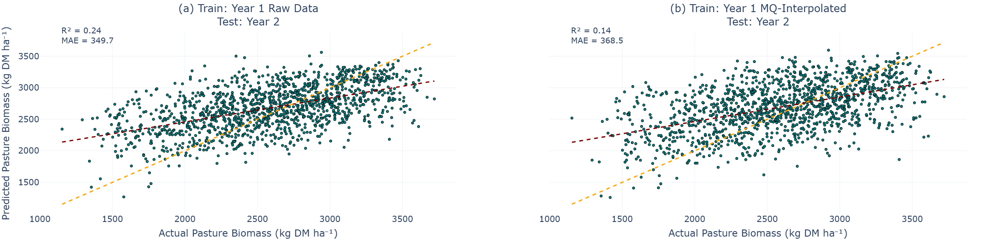

Saved SVG to visualisations/year1_to_year2_comparison.svg
Saved high-quality TIFF to visual/year1_to_year2_comparison.tiff


In [36]:
import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
from PIL import Image  # <-- added

def load_year1to2_results(label):
    """
    Load the test‐set predictions & metrics for the Year1→Year2 run.
    Expects Excel in modelling_results/Year1to2_{label}_summary.xlsx
    """
    folder = "modelling_results"
    path = os.path.join(folder, f"Year1to2_{label}_summary.xlsx")
    if not os.path.exists(path):
        raise FileNotFoundError(f"Cannot find {path}")
    with pd.ExcelFile(path) as xls:
        test_df    = pd.read_excel(xls, sheet_name="Test_Data")
        summary_df = pd.read_excel(xls, sheet_name="Summary")
    return test_df, summary_df

# helper to add maroon dashed regression line (width=3) on a subplot
def _add_maroon_regression_line(fig, x_series, y_series, row, col):
    x = np.asarray(x_series)
    y = np.asarray(y_series)
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x_valid = x[mask]
    y_valid = y[mask]
    if x_valid.size >= 2 and y_valid.size >= 2 and (np.nanstd(x_valid) > 0) and (np.nanstd(y_valid) > 0):
        coeffs = np.polyfit(x_valid, y_valid, 1)
        slope, intercept = coeffs[0], coeffs[1]
        x_line = np.linspace(np.nanmin(x_valid), np.nanmax(x_valid), 100)
        y_line = slope * x_line + intercept
        fig.add_trace(
            go.Scatter(
                x=x_line,
                y=y_line,
                mode="lines",
                line=dict(color="maroon", dash="dash", width=3),
                showlegend=False
            ),
            row=row,
            col=col
        )

# helper to add orange 1:1 line (width=3) on a subplot
def _add_orange_one_to_one_line(fig, x_series, y_series, row, col):
    combined = np.concatenate([np.asarray(x_series), np.asarray(y_series)])
    if combined.size > 0:
        lower = np.nanmin(combined)
        upper = np.nanmax(combined)
        fig.add_trace(
            go.Scatter(
                x=[lower, upper],
                y=[lower, upper],
                mode="lines",
                line=dict(color="orange", dash="dash", width=3),
                showlegend=False
            ),
            row=row,
            col=col
        )

def plot_year1_to_year2_comparison():
    labels = ["Non_interpolated", "Year1_MQ"]
    titles = [
        "(a) Train: Year 1 Raw Data<br>Test: Year 2",
        "(b) Train: Year 1 MQ-Interpolated<br>Test: Year 2"
    ]
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=titles,
        horizontal_spacing=0.10,
        shared_yaxes=True
    )

    for i, lbl in enumerate(labels, start=1):
        test_df, summ = load_year1to2_results(lbl)
        pred_col = [c for c in test_df.columns if c.endswith("_pred")][0]

        # scatter
        fig.add_trace(go.Scatter(
            x=test_df["remote_cover"],
            y=test_df[pred_col],
            mode="markers",
            marker=dict(color="teal", size=6, line=dict(width=1, color="black")),
            showlegend=False
        ), row=1, col=i)

        # maroon regression + orange 1:1
        _add_maroon_regression_line(fig, test_df["remote_cover"], test_df[pred_col], row=1, col=i)
        _add_orange_one_to_one_line(fig, test_df["remote_cover"], test_df[pred_col], row=1, col=i)

        # annotate R² & MAE (use proper xref/yref for each subplot)
        xref, yref = ("x domain", "y domain") if i == 1 else (f"x{i} domain", f"y{i} domain")
        r2  = summ.loc[summ["model"] == "xgboost", "test_r2"].iloc[0]
        mae = summ.loc[summ["model"] == "xgboost", "test_mae"].iloc[0]
        fig.add_annotation(
            xref=xref, yref=yref,
            x=0.05, y=1.05,
            text=f"R² = {r2:.2f}<br>MAE = {mae:.1f}",
            font=dict(size=19), showarrow=False,
            xanchor="left", yanchor="top", align="left",
            row=1, col=i
        )

        # axes labels
        fig.update_xaxes(
            title_text="Actual Pasture Biomass (kg DM ha⁻¹)",
            row=1, col=i,
            title_font=dict(size=23), tickfont=dict(size=20)
        )
        fig.update_yaxes(
            title_text="Predicted Pasture Biomass (kg DM ha⁻¹)" if i == 1 else "",
            row=1, col=i,
            title_font=dict(size=23), tickfont=dict(size=20)
        )

    # bump subplot titles
    for ann in fig.layout.annotations:
        if ann.text in titles:
            ann.font.size = 25
            if ann.xref == "paper" and ann.yref == "paper":
                ann.y += 0.03

    fig.update_layout(
        template="plotly_white",
        width=2*550, height=580,
        margin=dict(l=80, r=80, t=80, b=50)
    )

    # --- Save SVG to visualisations/ (kept)
    os.makedirs("visualisations", exist_ok=True)
    svg_out = "visualisations/year1_to_year2_comparison.svg"
    pio.write_image(fig, svg_out, format="svg", width=2*550, height=580, scale=20)

    # --- ALSO save high-quality TIFF to visual/ ---
    os.makedirs("visual", exist_ok=True)
    png_out  = "visual/year1_to_year2_comparison.png"
    tiff_out = "visual/year1_to_year2_comparison.tiff"

    # Export very high-res PNG first (clean base for TIFF)
    pio.write_image(fig, png_out, format="png", width=2*550, height=580, scale=10)

    # Convert PNG → TIFF with LZW compression and 600 DPI
    with Image.open(png_out) as im:
        # If a CMYK TIFF is required by a publisher, uncomment:
        # im = im.convert("CMYK")
        im.save(tiff_out, format="TIFF", compression="tiff_lzw", dpi=(600, 600))

    fig.show()
    print(f"Saved SVG to {svg_out}")
    print(f"Saved high-quality TIFF to {tiff_out}")

# call it
plot_year1_to_year2_comparison()


### Part 4 - Impact of Progressive Training on Model Performance (Based on Martin's Work)

#### Modelling Code

In [325]:
import os
import pickle
import time
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# regressors
from xgboost import XGBRegressor

# ───────── Helpers ─────────
def _compute_metrics(actual, predicted):
    mse  = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    return {
        'mse':  mse,
        'rmse': rmse,
        'r2':   r2_score(actual, predicted),
        'mae':  mean_absolute_error(actual, predicted)
    }

def _train_and_evaluate_all_models(
    train_df, test_df, cat_preds, num_preds, target_var,
    model_dict, scoring_metric, k_folds, random_state, optimize
):
    X_tr, y_tr = train_df[cat_preds + num_preds], train_df[target_var]
    X_te, y_te = test_df[cat_preds + num_preds], test_df[target_var]

    preproc = ColumnTransformer([
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_preds),
        ('num', StandardScaler(), num_preds)
    ])

    best_info, best_cv = None, -np.inf
    summary = []

    for name, spec in model_dict.items():
        pipe = Pipeline([('pre', preproc), ('model', spec['estimator'])])
        grid = GridSearchCV(
            pipe,
            param_grid=(spec['param_grid'] if optimize else {}),
            scoring=scoring_metric,
            cv=k_folds,
            n_jobs=-1,
            refit=True
        )
        grid.fit(X_tr, y_tr)

        cv_score = grid.best_score_
        preds_te = grid.best_estimator_.predict(X_te)
        met_te   = _compute_metrics(y_te, preds_te)

        print(f"\n{name}: CV={cv_score:.4f} | Test R²={met_te['r2']:.4f}, MAE={met_te['mae']:.2f}")

        if cv_score > best_cv:
            best_cv = cv_score
            best_info = {
                'name': name,
                'best_model': grid.best_estimator_,
                'metrics': met_te,
                'cv_score': cv_score
            }

        summary.append({
            'model': name,
            'cv_score': cv_score,
            **{f"test_{k}": v for k, v in met_te.items()}
        })

    test_out = test_df.copy()
    if best_info:
        test_out[f"{best_info['name']}_pred"] = best_info['best_model'].predict(X_te)
        print(f"→ Best model: {best_info['name']}")

    return best_info, test_out, pd.DataFrame(summary)

def evaluate_model_on_validation(best_info, val_df, cat_preds, num_preds, target_var):
    """
    Returns: (metrics_dict, val_df_with_pred_col)
    """
    if best_info is None:
        return None, None
    X_val = val_df[cat_preds + num_preds]
    y_val = val_df[target_var]
    preds = best_info['best_model'].predict(X_val)
    met   = _compute_metrics(y_val, preds)
    out_df = val_df.copy()
    out_df[f"{best_info['name']}_pred"] = preds
    return met, out_df

# ───────── Main ─────────
if __name__ == "__main__":
    start = time.time()

    # two datasets to compare
    datasets = {
        "non_interpolated": d_model_pt_new,
        "interpolated":     d_model_ip_pt_new
    }

    # validation sets
    val1, val1_name = val_set_1_new, "Nov2024"
    val2, val2_name = val_set_4_new, "6thPaddock"

    # predictors
    cat_preds = ['Farm Code','pcode','Season','Region','grazing']
    num_preds = [
        'T.Max','T.Min','Evap','Radn','VP','Rainfall',
        'RHmaxT','RHminT','blue','green','red','nir',
        'rededge1','rededge2','rededge3','swir2','swir3'
    ]
    target_var = 'remote_cover'

    # model dict
    model_dict = {
        'xgboost': {
            'estimator': XGBRegressor(
                random_state=42,
                use_label_encoder=False,
                objective="reg:squarederror"
            ),
            'param_grid': {
                'model__n_estimators':   [50,100,150,200,250,300,350,400,450],
                'model__learning_rate':  [0.01,0.1,0.2],
                'model__max_depth':      [3,5]
            }
        }
    }

    os.makedirs("modelling_results", exist_ok=True)

    for ds_name, df in datasets.items():
        print(f"\n========== DATASET: {ds_name} ==========")

        # single 80/20 split
        tr, te = train_test_split(df, test_size=0.2,
                                  random_state=42, shuffle=True)
        print(f"Train: {tr.shape} | Test: {te.shape} | "
              f"Val1({val1_name}): {val1.shape} | Val2({val2_name}): {val2.shape}")

        # build WOM subsets
        subsets = {
            "1W_(25%)":   tr[tr['WOM']==1].copy(),
            "2W_(50%)":   tr[tr['WOM'].isin([1,3])].copy(),
            "3W_(75%)":   tr[tr['WOM'].isin([1,2,3])].copy(),
            "4W_(100%)":  tr[tr['WOM'].isin([1,2,3,4])].copy(),
        }

        results = {}
        for label, sub in subsets.items():
            print(f"\n--- Subset {label}: {len(sub)} rows ---")

            # train + test
            best, test_out, test_summary = _train_and_evaluate_all_models(
                sub, te,
                cat_preds, num_preds, target_var,
                model_dict,
                scoring_metric='neg_mean_absolute_error',
                k_folds=5,
                random_state=42,
                optimize=True
            )

            # validation
            val1_metrics, val1_df = evaluate_model_on_validation(
                best, val1, cat_preds, num_preds, target_var
            )
            val2_metrics, val2_df = evaluate_model_on_validation(
                best, val2, cat_preds, num_preds, target_var
            )

            print(f" Val1({val1_name}): R²={val1_metrics['r2']:.3f}, MAE={val1_metrics['mae']:.2f}")
            print(f" Val2({val2_name}): R²={val2_metrics['r2']:.3f}, MAE={val2_metrics['mae']:.2f}")

            # write Excel summary
            fn   = f"{ds_name}_{label}_summary.xlsx"
            path = os.path.join("modelling_results", fn)
            with pd.ExcelWriter(path) as xl:
                test_summary .to_excel(xl, "Summary",             index=False)
                test_out     .to_excel(xl, "Test_Data",           index=False)
                val1_df      .to_excel(xl, f"Val1_{val1_name}",   index=False)
                pd.DataFrame([val1_metrics]).to_excel(xl, f"Val1_Metrics", index=False)
                val2_df      .to_excel(xl, f"Val2_{val2_name}",   index=False)
                pd.DataFrame([val2_metrics]).to_excel(xl, f"Val2_Metrics", index=False)
            print("Saved:", fn)

            # store for pickle
            results[label] = {
                'best':         best,
                'test':         test_out,
                'test_summary': test_summary,
                'val1_data':    val1_df,
                'val1_metrics': val1_metrics,
                'val2_data':    val2_df,
                'val2_metrics': val2_metrics
            }

        # pick best subset
        best_lbl = min(
            results,
            key=lambda L: results[L]['best']['metrics']['mae']
        )
        print(f"\n→ Best subset for {ds_name}: {best_lbl}")

        # pickle the entire results dict
        pkl = os.path.join("modelling_results", f"{ds_name}_progressive_overall.pkl")
        with open(pkl, "wb") as f:
            pickle.dump(results, f)
        print("Saved overall pickle:", os.path.basename(pkl))

    print(f"\nCompleted in {time.time()-start:.1f}s")


========== DATASET: non_interpolated ==========
Train: (2578, 58) | Test: (645, 58) | Val1(Nov2024): (41, 56) | Val2(6thPaddock): (63, 56)

--- Subset 1W_(25%): 555 rows ---

xgboost: CV=-260.8791 | Test R²=0.3121, MAE=328.17
→ Best model: xgboost
 Val1(Nov2024): R²=0.103, MAE=357.28
 Val2(6thPaddock): R²=0.090, MAE=275.11
Saved: non_interpolated_1W_(25%)_summary.xlsx

--- Subset 2W_(50%): 1254 rows ---

xgboost: CV=-266.4276 | Test R²=0.5028, MAE=271.90
→ Best model: xgboost
 Val1(Nov2024): R²=0.185, MAE=346.62
 Val2(6thPaddock): R²=0.298, MAE=256.07
Saved: non_interpolated_2W_(50%)_summary.xlsx

--- Subset 3W_(75%): 2017 rows ---

xgboost: CV=-252.5775 | Test R²=0.5429, MAE=258.85
→ Best model: xgboost
 Val1(Nov2024): R²=0.326, MAE=310.39
 Val2(6thPaddock): R²=0.314, MAE=253.96
Saved: non_interpolated_3W_(75%)_summary.xlsx

--- Subset 4W_(100%): 2578 rows ---

xgboost: CV=-248.6232 | Test R²=0.6009, MAE=244.20
→ Best model: xgboost
 Val1(Nov2024): R²=0.320, MAE=306.99
 Val2(6thPaddo

#### Plotting Code

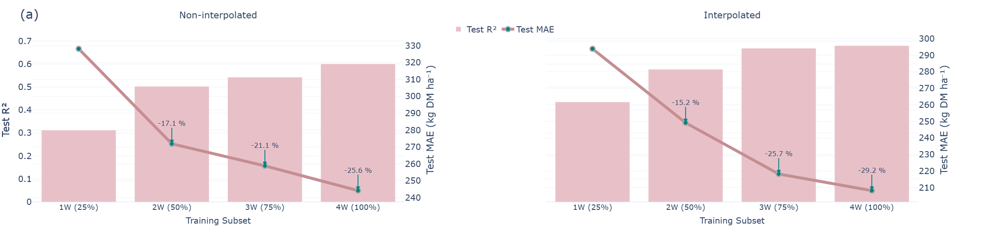

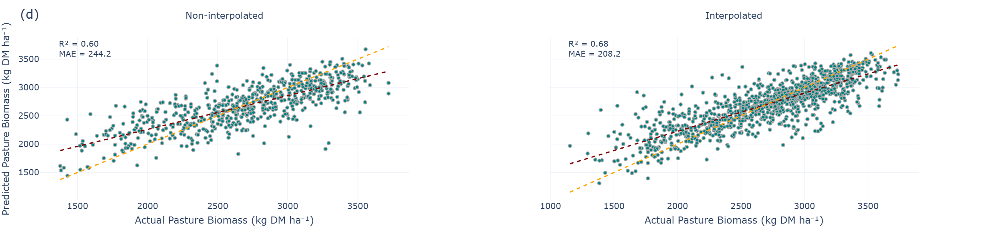

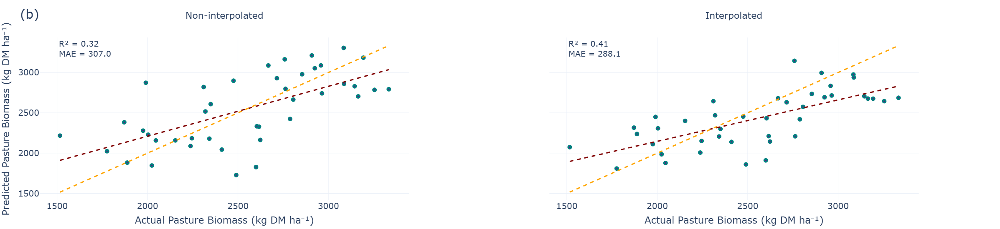

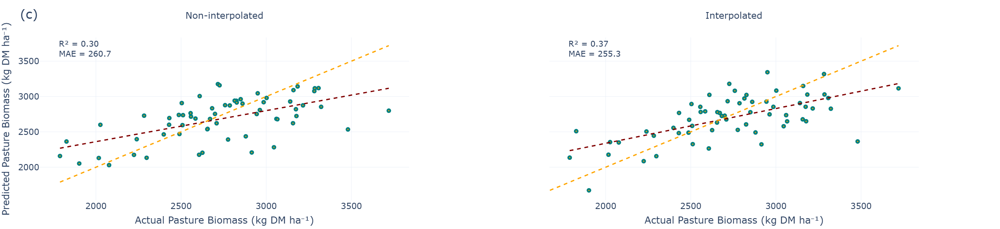

In [62]:
import os
import pickle
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# ─────────── helpers ───────────
def load_progressive(ds_key):
    path = os.path.join("modelling_results", f"{ds_key}_progressive_overall.pkl")
    if not os.path.exists(path):
        raise FileNotFoundError(path)
    with open(path, "rb") as f:
        return pickle.load(f)

def make_1x2_fig(tag, subtitles):
    """
    tag        → figure-level label like "(a)" … "(d)"
    subtitles  → column headings ("Non-interpolated", "Interpolated")
    """
    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{"secondary_y": True}, {"secondary_y": True}]],
        subplot_titles=subtitles,
        shared_yaxes=True,
        horizontal_spacing=0.15
    )
    fig.update_layout(
        template="plotly_white",
        title=dict(text=tag, x=0.02, xanchor="left", font_size=30),   # tag in upper-left
        legend=dict(orientation="h", y=1.10, x=0.5, xanchor="center", font_size=20),
        height=550, width=1100,
        margin=dict(t=90, b=60, l=60, r=60),
        font=dict(size=16),
        barmode="group"
    )
    # bump column subtitles up & enlarge
    for ann in fig.layout.annotations:
        ann.y += 0.10
        ann.font.size = 22
    return fig

# consistent subset ordering / pretty labels
SUBSET_KEYS   = ["1W_(25%)","2W_(50%)","3W_(75%)","4W_(100%)"]
SUBSET_LABELS = ["1W (25%)","2W (50%)","3W (75%)","4W (100%)"]

DATASETS = [
    ("non_interpolated", "Non-interpolated"),
    ("interpolated",     "Interpolated")
]

# ───────── helper: add maroon dashed regression line (width=3) on a subplot ─────────
def _add_maroon_regression_line(fig, x_series, y_series, row, col):
    x = np.asarray(x_series)
    y = np.asarray(y_series)
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x_valid = x[mask]
    y_valid = y[mask]
    if x_valid.size >= 2 and y_valid.size >= 2 and (np.nanstd(x_valid) > 0) and (np.nanstd(y_valid) > 0):
        slope, intercept = np.polyfit(x_valid, y_valid, 1)
        x_line = np.linspace(np.nanmin(x_valid), np.nanmax(x_valid), 100)
        y_line = slope * x_line + intercept
        fig.add_trace(
            go.Scatter(
                x=x_line, y=y_line, mode="lines",
                line=dict(color="maroon", dash="dash", width=3),
                showlegend=False, name="Regression"
            ),
            row=row, col=col
        )

# ───────── helper: add orange dashed 1:1 line (width=3) on a subplot ─────────
def _add_orange_one_to_one_line(fig, x_series, y_series, row, col):
    combined = np.concatenate([np.asarray(x_series), np.asarray(y_series)])
    if combined.size > 0:
        lower = np.nanmin(combined)
        upper = np.nanmax(combined)
        fig.add_trace(
            go.Scatter(
                x=[lower, upper], y=[lower, upper], mode="lines",
                line=dict(color="orange", dash="dash", width=3),
                showlegend=False, name="1:1"
            ),
            row=row, col=col
        )


# ═════════════ (a) R² & MAE ═════════════
def plot_r2_mae():
    fig = make_1x2_fig("(a)", [lbl for _, lbl in DATASETS])

    for col, (ds_key, _) in enumerate(DATASETS, start=1):
        prog = load_progressive(ds_key)
        r2s  = [prog[k]["best"]["metrics"]["r2"]  for k in SUBSET_KEYS]
        maes = [prog[k]["best"]["metrics"]["mae"] for k in SUBSET_KEYS]

        show_leg = (col == 1)             # only left column gets legend entries

        # R² bars
        fig.add_trace(
            go.Bar(
                x=SUBSET_LABELS, y=r2s, name="Test R²",
                marker=dict(color="#E8C1C8"), showlegend=show_leg
            ),
            row=1, col=col, secondary_y=False
        )
        # MAE line
        fig.add_trace(
            go.Scatter(
                x=SUBSET_LABELS, y=maes, mode="lines+markers", name="Test MAE",
                line=dict(color="#C48E92", width=7),
                marker=dict(size=12, color="teal", line=dict(width=3, color="darkgray")),
                showlegend=show_leg
            ),
            row=1, col=col, secondary_y=True
        )

        # %-change annotations (anchored to data points)
        # -------- ΔMAE arrows --------
        baseline = maes[0]                      # 1 W (25 %) MAE in *this* column
        for i in range(1, len(maes)):
            pct = (maes[i] - baseline) / baseline * 100.0
            fig.add_annotation(
                x=SUBSET_LABELS[i],
                y=maes[i],
                xref=f"x{col}",                 # correct axis ids per column
                yref=f"y{col*2}",               # y2 for col-1, y4 for col-2
                text=f"{pct:+.1f} %",
                showarrow=True,
                arrowhead=2, arrowwidth=2,
                arrowcolor="teal",
                ax=0, ay=50 if pct > 0 else -50,
                font=dict(size=16),
                row=1, col=col
            )

        fig.update_xaxes(title_text="Training Subset", row=1, col=col,
                         tickfont=dict(size=18), title_font=dict(size=20))
        fig.update_yaxes(title_text="Test R²",  row=1, col=col, secondary_y=False,tickfont=dict(size=20), title_font=dict(size=23))
        fig.update_yaxes(title_text="Test MAE (kg DM ha⁻¹)", row=1, col=col, secondary_y=True, tickfont=dict(size=20), title_font=dict(size=23))

    os.makedirs("visualisations", exist_ok=True)
    fig.write_image("visualisations/progressive_r2_mae.svg")
    fig.show()

# ═════════════ helper for the three scatter figures ═════════════
def _scatter_panel(tag, panel_title, data_key, metrics_key, marker_style):
    fig = make_1x2_fig(tag, [lbl for _, lbl in DATASETS])

    for col, (ds_key, _) in enumerate(DATASETS, start=1):
        prog     = load_progressive(ds_key)
        best_sub = min(prog, key=lambda k: prog[k]["best"]["metrics"]["mae"])
        df       = prog[best_sub][data_key]
        mets     = prog[best_sub]["best"]["metrics"] if metrics_key == "best" else prog[best_sub][metrics_key]
        pred_col = f"{prog[best_sub]['best']['name']}_pred"

        # scatter
        fig.add_trace(
            go.Scatter(
                x=df["remote_cover"], y=df[pred_col],
                mode="markers", marker=marker_style, showlegend=False
            ),
            row=1, col=col
        )

        # add lines: maroon regression + orange 1:1
        _add_maroon_regression_line(fig, df["remote_cover"], df[pred_col], row=1, col=col)
        _add_orange_one_to_one_line(fig, df["remote_cover"], df[pred_col], row=1, col=col)
        
        # fixed-position annotation inside subplot domain
        xdom = "x" if col == 1 else "x2"
        ydom = "y" if col == 1 else "y3"
        fig.add_annotation(
            x=0.05, y=1.00,
            xref=f"{xdom} domain", yref=f"{ydom} domain",
            text=f"R² = {mets['r2']:.2f}<br>MAE = {mets['mae']:.1f}",
            showarrow=False, align="left", font=dict(size=19),
            row=1, col=col
        )

        fig.update_xaxes(title_text="Actual Pasture Biomass (kg DM ha⁻¹)", row=1, col=col,
                         tickfont=dict(size=20), title_font=dict(size=23), autorange=True)
        if col == 1:
            fig.update_yaxes(title_text="Predicted Pasture Biomass (kg DM ha⁻¹)",
                             row=1, col=1, tickfont=dict(size=20), title_font=dict(size=23),
                             autorange=True)
        else:
            fig.update_yaxes(title_text="", row=1, col=2, autorange=True)

    return fig

# ═════════════ (b) – (d) figures ═════════════
def plot_best_test():
    fig = _scatter_panel(
        "(d)", "Best-subset Test Scatter",
        "test", "best",
        marker_style=dict(color="teal", size=8,
                          line=dict(width=2, color="darkgray"))
    )
    fig.write_image("visualisations/best_test_scatter.svg")
    fig.show()

def plot_best_val1():
    fig = _scatter_panel(
        "(b)", "Best-subset Validation 1 Scatter",
        "val1_data", "val1_metrics",
        marker_style=dict(symbol="circle", color="purple", size=7,
                          line=dict(width=4, color="teal"))
    )
    fig.write_image("visualisations/best_val1_scatter.svg")
    fig.show()

def plot_best_val2():
    fig = _scatter_panel(
        "(c)", "Best-subset Validation 2 Scatter",
        "val2_data", "val2_metrics",
        marker_style=dict(symbol="circle", color="orange", size=7,
                          line=dict(width=4, color="teal"))
    )
    fig.write_image("visualisations/best_val2_scatter.svg")
    fig.show()

# ═════════════ run everything ═════════════
if __name__ == "__main__":
    os.makedirs("visualisations", exist_ok=True)
    plot_r2_mae()
    plot_best_test()
    plot_best_val1()
    plot_best_val2()

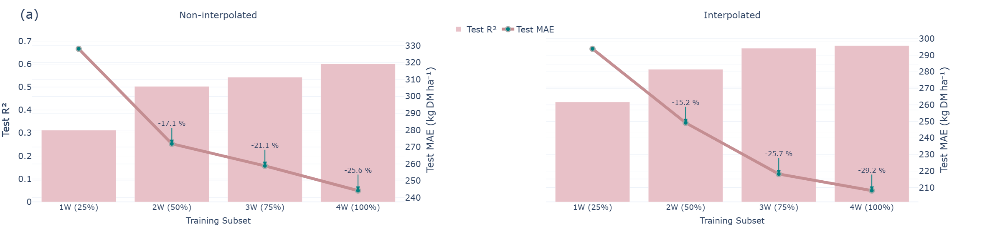

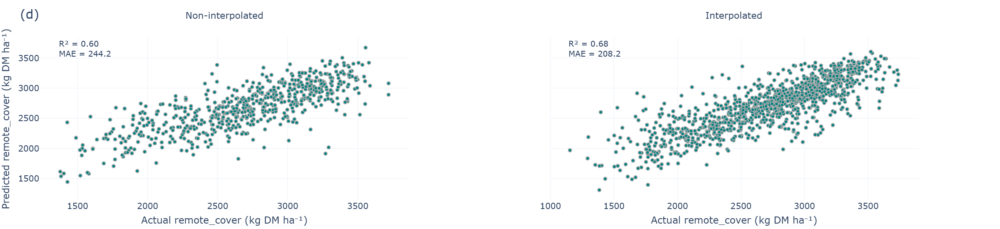

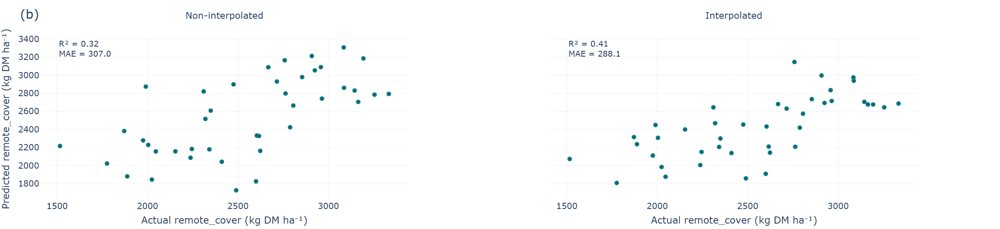

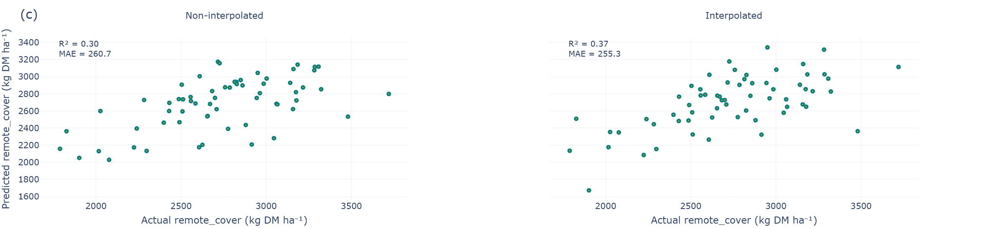

In [10]:
import os
import pickle
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# ─────────── helpers ───────────
def load_progressive(ds_key):
    path = os.path.join("modelling_results", f"{ds_key}_progressive_overall.pkl")
    if not os.path.exists(path):
        raise FileNotFoundError(path)
    with open(path, "rb") as f:
        return pickle.load(f)

def make_1x2_fig(tag, subtitles):
    """
    tag        → figure-level label like "(a)" … "(d)"
    subtitles  → column headings ("Non-interpolated", "Interpolated")
    """
    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{"secondary_y": True}, {"secondary_y": True}]],
        subplot_titles=subtitles,
        shared_yaxes=True,
        horizontal_spacing=0.15
    )
    fig.update_layout(
        template="plotly_white",
        title=dict(text=tag, x=0.02, xanchor="left", font_size=30),   # tag in upper-left
        legend=dict(orientation="h", y=1.10, x=0.5, xanchor="center", font_size=20),
        height=550, width=1100,
        margin=dict(t=90, b=60, l=60, r=60),
        font=dict(size=16),
        barmode="group"
    )
    # bump column subtitles up & enlarge
    for ann in fig.layout.annotations:
        ann.y += 0.10
        ann.font.size = 22
    return fig

# consistent subset ordering / pretty labels
SUBSET_KEYS   = ["1W_(25%)","2W_(50%)","3W_(75%)","4W_(100%)"]
SUBSET_LABELS = ["1W (25%)","2W (50%)","3W (75%)","4W (100%)"]

DATASETS = [
    ("non_interpolated", "Non-interpolated"),
    ("interpolated",     "Interpolated")
]

# ═════════════ (a) R² & MAE ═════════════
def plot_r2_mae():
    fig = make_1x2_fig("(a)", [lbl for _, lbl in DATASETS])

    for col, (ds_key, _) in enumerate(DATASETS, start=1):
        prog = load_progressive(ds_key)
        r2s  = [prog[k]["best"]["metrics"]["r2"]  for k in SUBSET_KEYS]
        maes = [prog[k]["best"]["metrics"]["mae"] for k in SUBSET_KEYS]

        show_leg = (col == 1)             # only left column gets legend entries

        # R² bars
        fig.add_trace(
            go.Bar(
                x=SUBSET_LABELS, y=r2s, name="Test R²",
                marker=dict(color="#E8C1C8"), showlegend=show_leg
            ),
            row=1, col=col, secondary_y=False
        )
        # MAE line
        fig.add_trace(
            go.Scatter(
                x=SUBSET_LABELS, y=maes, mode="lines+markers", name="Test MAE",
                line=dict(color="#C48E92", width=7),
                marker=dict(size=12, color="teal", line=dict(width=3, color="darkgray")),
                showlegend=show_leg
            ),
            row=1, col=col, secondary_y=True
        )

        # %-change annotations (anchored to data points)
        # -------- ΔMAE arrows --------
        baseline = maes[0]                      # 1 W (25 %) MAE in *this* column
        for i in range(1, len(maes)):
            pct = (maes[i] - baseline) / baseline * 100.0
            fig.add_annotation(
                x=SUBSET_LABELS[i],
                y=maes[i],
                xref=f"x{col}",                 # correct axis ids per column
                yref=f"y{col*2}",               # y2 for col-1, y4 for col-2
                text=f"{pct:+.1f} %",
                showarrow=True,
                arrowhead=2, arrowwidth=2,
                arrowcolor="teal",
                ax=0, ay=50 if pct > 0 else -50,
                font=dict(size=16),
                row=1, col=col
            )

        fig.update_xaxes(title_text="Training Subset", row=1, col=col,
                         tickfont=dict(size=18), title_font=dict(size=20))
        fig.update_yaxes(title_text="Test R²",  row=1, col=col, secondary_y=False,tickfont=dict(size=20), title_font=dict(size=23))
        fig.update_yaxes(title_text="Test MAE (kg DM ha⁻¹)", row=1, col=col, secondary_y=True, tickfont=dict(size=20), title_font=dict(size=23))

    os.makedirs("visualisations", exist_ok=True)
    fig.write_image("visualisations/progressive_r2_mae.svg")
    fig.show()

# ═════════════ helper for the three scatter figures ═════════════
def _scatter_panel(tag, panel_title, data_key, metrics_key, marker_style):
    fig = make_1x2_fig(tag, [lbl for _, lbl in DATASETS])

    for col, (ds_key, _) in enumerate(DATASETS, start=1):
        prog     = load_progressive(ds_key)
        best_sub = min(prog, key=lambda k: prog[k]["best"]["metrics"]["mae"])
        df       = prog[best_sub][data_key]
        mets     = prog[best_sub]["best"]["metrics"] if metrics_key == "best" else prog[best_sub][metrics_key]
        pred_col = f"{prog[best_sub]['best']['name']}_pred"

        # scatter
        fig.add_trace(
            go.Scatter(
                x=df["remote_cover"], y=df[pred_col],
                mode="markers", marker=marker_style, showlegend=False
            ),
            row=1, col=col
        )

        # fixed-position annotation inside subplot domain
        xdom = "x" if col == 1 else "x2"
        ydom = "y" if col == 1 else "y3"
        fig.add_annotation(
            x=0.05, y=1.00,
            xref=f"{xdom} domain", yref=f"{ydom} domain",
            text=f"R² = {mets['r2']:.2f}<br>MAE = {mets['mae']:.1f}",
            showarrow=False, align="left", font=dict(size=19),
            row=1, col=col
        )

        fig.update_xaxes(title_text="Actual remote_cover (kg DM ha⁻¹)", row=1, col=col,
                         tickfont=dict(size=20), title_font=dict(size=23), autorange=True)
        if col == 1:
            fig.update_yaxes(title_text="Predicted remote_cover (kg DM ha⁻¹)",
                             row=1, col=1, tickfont=dict(size=20), title_font=dict(size=23),
                             autorange=True)
        else:
            fig.update_yaxes(title_text="", row=1, col=2, autorange=True)

    return fig

# ═════════════ (b) – (d) figures ═════════════
def plot_best_test():
    fig = _scatter_panel(
        "(d)", "Best-subset Test Scatter",
        "test", "best",
        marker_style=dict(color="teal", size=8,
                          line=dict(width=2, color="darkgray"))
    )
    fig.write_image("visualisations/best_test_scatter.svg")
    fig.show()

def plot_best_val1():
    fig = _scatter_panel(
        "(b)", "Best-subset Validation 1 Scatter",
        "val1_data", "val1_metrics",
        marker_style=dict(symbol="circle", color="purple", size=7,
                          line=dict(width=4, color="teal"))
    )
    fig.write_image("visualisations/best_val1_scatter.svg")
    fig.show()

def plot_best_val2():
    fig = _scatter_panel(
        "(c)", "Best-subset Validation 2 Scatter",
        "val2_data", "val2_metrics",
        marker_style=dict(symbol="circle", color="orange", size=7,
                          line=dict(width=4, color="teal"))
    )
    fig.write_image("visualisations/best_val2_scatter.svg")
    fig.show()

# ═════════════ run everything ═════════════
if __name__ == "__main__":
    os.makedirs("visualisations", exist_ok=True)
    plot_r2_mae()
    plot_best_test()
    plot_best_val1()
    plot_best_val2()

In [11]:
import os, pickle
SUBSET_KEYS   = ["1W_(25%)","2W_(50%)","3W_(75%)","4W_(100%)"]
SUBSET_LABELS = ["1W (25%)","2W (50%)","3W (75%)","4W (100%)"]
DATASETS      = ["non_interpolated", "interpolated"]

def show_mae_arrays():
    for ds in DATASETS:
        fn = f"modelling_results/{ds}_progressive_overall.pkl"
        with open(fn, "rb") as f:
            prog = pickle.load(f)

        maes = [prog[k]["best"]["metrics"]["mae"] for k in SUBSET_KEYS]
        print(f"\n{ds.upper()}")
        for lbl, m in zip(SUBSET_LABELS, maes):
            print(f"  {lbl:<10}  MAE = {m:7.2f}")
        baseline = maes[0]
        print("  ΔMAE vs baseline:",
              [f"{(m-baseline)/baseline*100:+.1f} %" for m in maes[1:]])

show_mae_arrays()


NON_INTERPOLATED
  1W (25%)    MAE =  328.17
  2W (50%)    MAE =  271.90
  3W (75%)    MAE =  258.85
  4W (100%)   MAE =  244.20
  ΔMAE vs baseline: ['-17.1 %', '-21.1 %', '-25.6 %']

INTERPOLATED
  1W (25%)    MAE =  293.88
  2W (50%)    MAE =  249.16
  3W (75%)    MAE =  218.21
  4W (100%)   MAE =  208.18
  ΔMAE vs baseline: ['-15.2 %', '-25.7 %', '-29.2 %']


### Part 5 - Farm Level Modelling

#### Distribution of Farms across Regions

In [14]:
def print_farm_codes_by_region(df):
    """
    Prints the unique Farm Codes for each Region in the given DataFrame.
    
    Parameters:
        df (pd.DataFrame): DataFrame containing at least the columns 'Farm Code' and 'Region'
    """
    # Group by 'Region' and get unique 'Farm Code' values
    farms_by_region = df.groupby('Region')['Farm Code'].unique()
    
    # Print the results
    for region, farms in farms_by_region.items():
        print(f"Region: {region}")
        print("Farm Codes:", farms)
        print("-" * 40)

# Example usage:
# Assuming d_model is your DataFrame:
print_farm_codes_by_region(d_model_new)

Region: Mid Coast
Farm Codes: ['Bale' 'Corstorphine' 'Jneal' 'Neal' 'Neilson' 'Nicholson' 'Tocal']
----------------------------------------
Region: North Coast
Farm Codes: ['Behrens' 'Clarke' 'Gould' 'Tonge']
----------------------------------------
Region: South Coast
Farm Codes: ['Apps' 'Game' 'Holmes' 'Russell' 'Ryan']
----------------------------------------


In [24]:
# Count the rows per Region × Farm Code,
# then order farms by descending count inside each Region
counts = (
    d_model_new
      .groupby(["Region", "Farm Code"], as_index=False)
      .size()                                 # → column “size”
      .rename(columns={"size": "count"})
      .sort_values(["Region", "count"],       # primary = Region, secondary = count
                   ascending=[True, False])   # region A→Z, count high→low
      .reset_index(drop=True)                 # neat 0-based index
)

print(counts)


         Region     Farm Code  count
0     Mid Coast         Tocal    221
1     Mid Coast          Bale    210
2     Mid Coast       Neilson    203
3     Mid Coast     Nicholson    172
4     Mid Coast          Neal    156
5     Mid Coast  Corstorphine     68
6     Mid Coast         Jneal     53
7   North Coast         Tonge    302
8   North Coast       Behrens    264
9   North Coast         Gould    174
10  North Coast        Clarke    139
11  South Coast       Russell    262
12  South Coast          Game    250
13  South Coast          Ryan    244
14  South Coast        Holmes    229
15  South Coast          Apps    214


In [ ]:
# farm_sets = {
#     "set1": ["Neal", "Tonge", "Ryan"],
#     "set2": ["Bale", "Behrens", "Apps"],
#     "set3": ["Tocal", "Clarke", "Game"],
#     "set4": ["Corstorphine", "Gould", "Russell"],
# }

In [68]:
d_model_new.columns

Index(['Farm Code', 'pcode', 'Date', 'FarmName', 'pname_pm', 'pname_s',
       'WalkAverage', 'RawReading', 'remote_cover', 'FarmResidualSetting',
       'Week', 'Season', 'Year', 'T.Max', 'Smx', 'T.Min', 'Smn', 'Rain', 'Srn',
       'Evap', 'Sev', 'Radn', 'Ssl', 'VP', 'Svp', 'RHmaxT', 'RHminT', 'FAO56',
       'StationName', 'Region', 'Weatherstation', 'blue', 'green', 'red',
       'nir', 'rededge1', 'rededge2', 'rededge3', 'swir2', 'swir3', 'ndvi',
       'evi', 'savi', 'ndre', 'date_matched', 'was_aggregated', 'grazed',
       'grazing', 'is_grazed', 'Rain intensity', 'Rainfall', 'avg_T', 'RH_avg',
       'RH_class', 'RH_group', 'pcode_area'],
      dtype='object')

In [80]:
# ------------------------------------------------------------
# Predicting Selected Farms (one per region) using the rest
# ------------------------------------------------------------
# A toggle lets you choose whether the test set contains ONLY rows where
# `date_matched` is True (original behaviour) or ALL rows for the
# selected farms.  When the latter is chosen, the same test sample built
# from the non_interpolated dataset is reused for every other dataset.
# ------------------------------------------------------------
import os
import pickle
import time
import numpy as np
import pandas as pd

from sklearn.model_selection import GridSearchCV, KFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# ──────────────────────────────────────────────────────────────
# 0.  Toggle for the test-set rule
# ──────────────────────────────────────────────────────────────
# True  ➜ test set keeps only rows where `date_matched` is True
# False ➜ test set keeps ALL rows for the selected farms
USE_DATE_MATCHED_ONLY = False                      # ← change here

# ──────────────────────────────────────────────────────────────
# 1.  Utility functions
# ──────────────────────────────────────────────────────────────
def compute_metrics(actual, predicted):
    mse = mean_squared_error(actual, predicted)
    return {
        "mse": mse,
        "rmse": np.sqrt(mse),
        "r2":  r2_score(actual, predicted),
        "mae": mean_absolute_error(actual, predicted),
    }


def get_train_test_split(
    df: pd.DataFrame,
    test_farms: list[str],
    date_matched_only: bool = True,
):
    """
    Create train/test DataFrames.

    Rules
    -----
    • ALL rows from `test_farms` are removed from the training set.
    • Test set is:
        – ONLY rows with `date_matched` == True   (if date_matched_only)
        – ALL rows for the test farms             (otherwise)
    """
    farm_mask = df["Farm Code"].isin(test_farms)

    # which rows are in the test set?
    test_mask = farm_mask & (df["date_matched"] if date_matched_only else True)

    test_df  = df[test_mask].copy()
    train_df = df[~farm_mask].copy()

    if test_df.empty:
        raise ValueError(
            f"No rows found for farms {test_farms} under the chosen split rule"
        )
    return train_df, test_df


def train_and_evaluate(
    train_df: pd.DataFrame,
    test_df:  pd.DataFrame,
    cat_cols: list[str],
    num_cols: list[str],
    target:   str,
    model_dict: dict,
    *,
    k_folds: int = 5,
    random_state: int = 42,
    optimize: bool = True,
    date_matched_only: bool = True,   # accepted for visibility only
):
    """
    Grid-search the supplied models, returning the best model,
    its predictions appended to `test_df`, and a summary DataFrame.
    """
    X_train, y_train = train_df[cat_cols + num_cols], train_df[target]
    X_test,  y_test  = test_df[cat_cols + num_cols], test_df[target]

    preprocessing = ColumnTransformer([
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_cols),
        ("num", StandardScaler(),                     num_cols),
    ])

    best, best_cv = None, -np.inf
    summary_rows  = []

    print("\nModel performance (CV and Test metrics):")

    for name, spec in model_dict.items():
        pipe = Pipeline([
            ("prep", preprocessing),
            ("model", spec["estimator"]),
        ])

        grid = GridSearchCV(
            pipe,
            param_grid=(spec["param_grid"] if optimize else {}),
            cv=KFold(n_splits=k_folds, shuffle=True, random_state=random_state),
            scoring="neg_mean_absolute_error",
            n_jobs=-1,
            refit=True,
        )
        grid.fit(X_train, y_train)

        cv_score = grid.best_score_
        preds    = grid.best_estimator_.predict(X_test)
        metrics  = compute_metrics(y_test, preds)

        print(
            f"  {name:<10} | CV MAE = {-cv_score:6.2f} | "
            f"Test R² = {metrics['r2']:.4f}  "
            f"MAE = {metrics['mae']:.2f}  RMSE = {metrics['rmse']:.2f}"
        )

        summary_rows.append({
            "model": name,
            "cv_score": cv_score,
            **{f"test_{k}": v for k, v in metrics.items()},
        })

        if cv_score > best_cv:
            best_cv = cv_score
            best = {
                "name":        name,
                "best_model":  grid.best_estimator_,
                "metrics":     metrics,
                "cv_score":    cv_score,
            }

    # Attach predictions of the best model
    if best:
        test_df = test_df.copy()
        test_df[f"{best['name']}_pred"] = best["best_model"].predict(X_test)

        m = best["metrics"]
        print(
            f"    → Best: {best['name']} | "
            f"Test R² = {m['r2']:.4f}  MAE = {m['mae']:.2f}  RMSE = {m['rmse']:.2f}\n"
        )

    return best, test_df, pd.DataFrame(summary_rows)

# ──────────────────────────────────────────────────────────────
# 2.  Configuration
# ──────────────────────────────────────────────────────────────

datasets = {
    "non_interpolated": d_model_new,
    # "interpolated":     d_model_ip_new,
    "mq_filtered":      d_model_new_mq,
}

farm_sets = {
    "set1": ["Tocal"],
    "set2": ["Neal", "Gould", "Apps"]
}

target_var = "remote_cover"
# cat_cols = ["Farm Code", "pcode", "Season", "Region", "grazing"]
cat_cols = ["Season", "Region", "grazing"]

num_cols = [
    "avg_T", "Evap", "Radn", "VP", "Rainfall",
    "RH_avg", "blue", "green", "red", "nir",
    "rededge1", "rededge2", "rededge3", "swir2", "swir3",
]

model_dict = {
    "xgboost": {
        "estimator": XGBRegressor(
            random_state=42,
            use_label_encoder=False,
            objective="reg:squarederror",
        ),
        "param_grid": {
            # "model__n_estimators":  [50,100,150,200,250,300,350,400,450],
             "model__n_estimators":  [50,100,150,200],
            "model__learning_rate": [0.01,0.1,0.2],
            "model__max_depth":     [3,5],
        },
    },
}

# ──────────────────────────────────────────────────────────────
# 3.  Main loop with caching of test-row keys
# ──────────────────────────────────────────────────────────────
start_time = time.time()
results_root = "modelling_results"
os.makedirs(results_root, exist_ok=True)

# cache: {set_label: frozenset of (Farm Code, Date) tuples}
cached_test_keys = {}

for ds_name, df in datasets.items():
    print(f"\n========== DATASET: {ds_name} ({df.shape[0]} rows) ==========")

    for set_label, farms in farm_sets.items():
        print(f"\n--- Hold-out farms {set_label}: {farms} ---")

        # ▸ CASE A: standard behaviour (date-matched only) ------------------
        if USE_DATE_MATCHED_ONLY:
            train_df, test_df = get_train_test_split(
                df,
                farms,
                date_matched_only=True,
            )

        # ▸ CASE B: use ALL rows, with consistent test sample --------------
        # ▸ CASE B: USE_DATE_MATCHED_ONLY == False --------------------------
        else:
            if ds_name == "non_interpolated":
                # build test sample and cache its (Farm Code, Date) pairs
                train_df, test_df = get_train_test_split(
                    df, farms, date_matched_only=False
                )
                cached_test_keys[set_label] = frozenset(
                    test_df[["Farm Code", "Date"]].apply(tuple, axis=1)
                )
            else:
                # for every other dataset reuse EXACTLY those cached rows
                key_set    = cached_test_keys[set_label]
                key_series = df[["Farm Code", "Date"]].apply(tuple, axis=1)

                test_mask  = key_series.isin(key_set)
                train_mask = ~df["Farm Code"].isin(farms)        # drop all farm rows

                test_df  = df[test_mask].copy()
                train_df = df[train_mask].copy()

                if test_df.empty:
                    raise ValueError(
                        f"{ds_name}: no rows match the cached "
                        f"non_interpolated test sample for {set_label}"
                    )


        print(f"Train shape: {train_df.shape} | Test shape: {test_df.shape}")

        # The toggle is passed only for traceability; not used internally.
        best, test_out, summary_df = train_and_evaluate(
            train_df, test_df,
            cat_cols, num_cols, target_var,
            model_dict,
            k_folds=5,
            random_state=42,
            optimize=True,
            date_matched_only=USE_DATE_MATCHED_ONLY,
        )

        if best is None:
            print("No model selected – skipping save!")
            continue

        # save Excel summary
        excel_name = f"{ds_name}_{set_label}_summary.xlsx"
        with pd.ExcelWriter(os.path.join(results_root, excel_name)) as xl:
            summary_df.to_excel(xl, "Summary",  index=False)
            test_out.to_excel( xl, "Test_Data", index=False)
        print("Saved:", excel_name)

        # save pickle bundle
        pkl_name = f"{ds_name}_{set_label}_results.pkl"
        with open(os.path.join(results_root, pkl_name), "wb") as f:
            pickle.dump({
                
                "best":         best,
                "test":         test_out,
                "test_summary": summary_df,
            }, f)

print(f"\nAll runs completed in {time.time() - start_time:.1f}s")


========== DATASET: non_interpolated (3161 rows) ==========

--- Hold-out farms set1: ['Tocal'] ---
Train shape: (2940, 56) | Test shape: (221, 56)

Model performance (CV and Test metrics):
  xgboost    | CV MAE = 284.23 | Test R² = 0.3485  MAE = 344.58  RMSE = 451.17
    → Best: xgboost | Test R² = 0.3485  MAE = 344.58  RMSE = 451.17

Saved: non_interpolated_set1_summary.xlsx

--- Hold-out farms set2: ['Neal', 'Gould', 'Apps'] ---
Train shape: (2617, 56) | Test shape: (544, 56)

Model performance (CV and Test metrics):
  xgboost    | CV MAE = 287.55 | Test R² = 0.4182  MAE = 315.81  RMSE = 387.44
    → Best: xgboost | Test R² = 0.4182  MAE = 315.81  RMSE = 387.44

Saved: non_interpolated_set2_summary.xlsx

========== DATASET: mq_filtered (9816 rows) ==========

--- Hold-out farms set1: ['Tocal'] ---
Train shape: (8910, 50) | Test shape: (226, 50)

Model performance (CV and Test metrics):
  xgboost    | CV MAE = 282.99 | Test R² = 0.2645  MAE = 360.14  RMSE = 486.12
    → Best: xgboos

In [84]:
# ------------------------------------------------------------
# Predicting Selected Farms (one per region) using the rest
# ------------------------------------------------------------
# A toggle lets you choose whether the test set contains ONLY rows where
# `date_matched` is True (original behaviour) or ALL rows for the
# selected farms.  When the latter is chosen, the same test sample built
# from the non_interpolated dataset is reused for every other dataset.
# ------------------------------------------------------------
import os
import pickle
import time
import numpy as np
import pandas as pd

from sklearn.model_selection import GridSearchCV, KFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# ──────────────────────────────────────────────────────────────
# 0.  Toggle for the test-set rule
# ──────────────────────────────────────────────────────────────
# True  ➜ test set keeps only rows where `date_matched` is True
# False ➜ test set keeps ALL rows for the selected farms
USE_DATE_MATCHED_ONLY = True                      # ← change here

# ──────────────────────────────────────────────────────────────
# 1.  Utility functions
# ──────────────────────────────────────────────────────────────
def compute_metrics(actual, predicted):
    mse = mean_squared_error(actual, predicted)
    return {
        "mse": mse,
        "rmse": np.sqrt(mse),
        "r2":  r2_score(actual, predicted),
        "mae": mean_absolute_error(actual, predicted),
    }


def get_train_test_split(
    df: pd.DataFrame,
    test_farms: list[str],
    date_matched_only: bool = True,
):
    """
    Create train/test DataFrames.

    Rules
    -----
    • ALL rows from `test_farms` are removed from the training set.
    • Test set is:
        – ONLY rows with `date_matched` == True   (if date_matched_only)
        – ALL rows for the test farms             (otherwise)
    """
    farm_mask = df["Farm Code"].isin(test_farms)

    # which rows are in the test set?
    test_mask = farm_mask & (df["date_matched"] if date_matched_only else True)

    test_df  = df[test_mask].copy()
    train_df = df[~farm_mask].copy()

    if test_df.empty:
        raise ValueError(
            f"No rows found for farms {test_farms} under the chosen split rule"
        )
    return train_df, test_df


def train_and_evaluate(
    train_df: pd.DataFrame,
    test_df:  pd.DataFrame,
    cat_cols: list[str],
    num_cols: list[str],
    target:   str,
    model_dict: dict,
    *,
    k_folds: int = 5,
    random_state: int = 42,
    optimize: bool = True,
    date_matched_only: bool = True,   # accepted for visibility only
):
    """
    Grid-search the supplied models, returning the best model,
    its predictions appended to `test_df`, and a summary DataFrame.
    """
    X_train, y_train = train_df[cat_cols + num_cols], train_df[target]
    X_test,  y_test  = test_df[cat_cols + num_cols], test_df[target]

    preprocessing = ColumnTransformer([
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_cols),
        ("num", StandardScaler(),                     num_cols),
    ])

    best, best_cv = None, -np.inf
    summary_rows  = []

    print("\nModel performance (CV and Test metrics):")

    for name, spec in model_dict.items():
        pipe = Pipeline([
            ("prep", preprocessing),
            ("model", spec["estimator"]),
        ])

        grid = GridSearchCV(
            pipe,
            param_grid=(spec["param_grid"] if optimize else {}),
            cv=KFold(n_splits=k_folds, shuffle=True, random_state=random_state),
            scoring="neg_mean_absolute_error",
            n_jobs=-1,
            refit=True,
        )
        grid.fit(X_train, y_train)

        cv_score = grid.best_score_
        preds    = grid.best_estimator_.predict(X_test)
        metrics  = compute_metrics(y_test, preds)

        print(
            f"  {name:<10} | CV MAE = {-cv_score:6.2f} | "
            f"Test R² = {metrics['r2']:.4f}  "
            f"MAE = {metrics['mae']:.2f}  RMSE = {metrics['rmse']:.2f}"
        )

        summary_rows.append({
            "model": name,
            "cv_score": cv_score,
            **{f"test_{k}": v for k, v in metrics.items()},
        })

        if cv_score > best_cv:
            best_cv = cv_score
            best = {
                "name":        name,
                "best_model":  grid.best_estimator_,
                "metrics":     metrics,
                "cv_score":    cv_score,
            }

    # Attach predictions of the best model
    if best:
        test_df = test_df.copy()
        test_df[f"{best['name']}_pred"] = best["best_model"].predict(X_test)

        m = best["metrics"]
        print(
            f"    → Best: {best['name']} | "
            f"Test R² = {m['r2']:.4f}  MAE = {m['mae']:.2f}  RMSE = {m['rmse']:.2f}\n"
        )

    return best, test_df, pd.DataFrame(summary_rows)

# ──────────────────────────────────────────────────────────────
# 2.  Configuration
# ──────────────────────────────────────────────────────────────

datasets = {
    "fram_data": d_model_new,

}

farm_sets = {
    "set1": ["Tocal"],
    "set2": ["Neal", "Gould", "Apps"]
}

target_var = "remote_cover"
# cat_cols = ["Farm Code", "pcode", "Season", "Region", "grazing"]
cat_cols = ["Season", "Region", "grazing"]

num_cols = [
    "avg_T", "Evap", "Radn", "VP", "Rainfall",
    "RH_avg", "blue", "green", "red", "nir",
    "rededge1", "rededge2", "rededge3", "swir2", "swir3",
]

model_dict = {
    "xgboost": {
        "estimator": XGBRegressor(
            random_state=42,
            use_label_encoder=False,
            objective="reg:squarederror",
        ),
        "param_grid": {
            # "model__n_estimators":  [50,100,150,200,250,300,350,400,450],
             "model__n_estimators":  [50,100,150,200],
            "model__learning_rate": [0.01,0.1,0.2],
            "model__max_depth":     [3,5],
        },
    },
}

# ──────────────────────────────────────────────────────────────
# 3.  Main loop with caching of test-row keys
# ──────────────────────────────────────────────────────────────
start_time = time.time()
results_root = "modelling_results"
os.makedirs(results_root, exist_ok=True)

# cache: {set_label: frozenset of (Farm Code, Date) tuples}
cached_test_keys = {}

for ds_name, df in datasets.items():
    print(f"\n========== DATASET: {ds_name} ({df.shape[0]} rows) ==========")

    for set_label, farms in farm_sets.items():
        print(f"\n--- Hold-out farms {set_label}: {farms} ---")

        # ▸ CASE A: standard behaviour (date-matched only) ------------------
        if USE_DATE_MATCHED_ONLY:
            train_df, test_df = get_train_test_split(
                df,
                farms,
                date_matched_only=True,
            )

        # ▸ CASE B: use ALL rows, with consistent test sample --------------
        # ▸ CASE B: USE_DATE_MATCHED_ONLY == False --------------------------
        else:
            if ds_name == "fram_data":
                # build test sample and cache its (Farm Code, Date) pairs
                train_df, test_df = get_train_test_split(
                    df, farms, date_matched_only=False
                )
                cached_test_keys[set_label] = frozenset(
                    test_df[["Farm Code", "Date"]].apply(tuple, axis=1)
                )
            else:
                # for every other dataset reuse EXACTLY those cached rows
                key_set    = cached_test_keys[set_label]
                key_series = df[["Farm Code", "Date"]].apply(tuple, axis=1)

                test_mask  = key_series.isin(key_set)
                train_mask = ~df["Farm Code"].isin(farms)        # drop all farm rows

                test_df  = df[test_mask].copy()
                train_df = df[train_mask].copy()

                if test_df.empty:
                    raise ValueError(
                        f"{ds_name}: no rows match the cached "
                        f"fram_data test sample for {set_label}"
                    )


        print(f"Train shape: {train_df.shape} | Test shape: {test_df.shape}")

        # The toggle is passed only for traceability; not used internally.
        best, test_out, summary_df = train_and_evaluate(
            train_df, test_df,
            cat_cols, num_cols, target_var,
            model_dict,
            k_folds=5,
            random_state=42,
            optimize=True,
            date_matched_only=USE_DATE_MATCHED_ONLY,
        )

        if best is None:
            print("No model selected – skipping save!")
            continue

        # save Excel summary
        excel_name = f"{ds_name}_{set_label}_summary.xlsx"
        with pd.ExcelWriter(os.path.join(results_root, excel_name)) as xl:
            summary_df.to_excel(xl, "Summary",  index=False)
            test_out.to_excel( xl, "Test_Data", index=False)
        print("Saved:", excel_name)

        # save pickle bundle
        pkl_name = f"{ds_name}_{set_label}_results.pkl"
        with open(os.path.join(results_root, pkl_name), "wb") as f:
            pickle.dump({
                
                "best":         best,
                "test":         test_out,
                "test_summary": summary_df,
            }, f)

print(f"\nAll runs completed in {time.time() - start_time:.1f}s")


========== DATASET: fram_data (3161 rows) ==========

--- Hold-out farms set1: ['Tocal'] ---
Train shape: (2940, 56) | Test shape: (70, 56)

Model performance (CV and Test metrics):
  xgboost    | CV MAE = 284.23 | Test R² = 0.4629  MAE = 299.01  RMSE = 379.28
    → Best: xgboost | Test R² = 0.4629  MAE = 299.01  RMSE = 379.28

Saved: fram_data_set1_summary.xlsx

--- Hold-out farms set2: ['Neal', 'Gould', 'Apps'] ---
Train shape: (2617, 56) | Test shape: (116, 56)

Model performance (CV and Test metrics):
  xgboost    | CV MAE = 287.55 | Test R² = 0.4575  MAE = 289.51  RMSE = 356.02
    → Best: xgboost | Test R² = 0.4575  MAE = 289.51  RMSE = 356.02

Saved: fram_data_set2_summary.xlsx

All runs completed in 8.8s


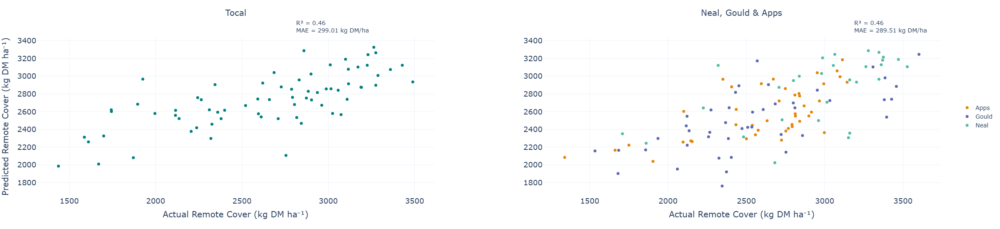

Saved → visualisations\fram_data_two_subplots.svg


In [108]:
import os, pickle, pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots

# ── I/O ──────────────────────────────────────────────────────
results_dir = "modelling_results"
vis_dir     = "visualisations"; os.makedirs(vis_dir, exist_ok=True)

pkl_files = {
    "Tocal":            "fram_data_set1_results.pkl",
    "Neal–Gould–Apps":  "fram_data_set2_results.pkl",
}

loaded = {}
for label, fn in pkl_files.items():
    path = os.path.join(results_dir, fn)
    if not os.path.exists(path):
        raise FileNotFoundError(path)
    with open(path, "rb") as f:
        loaded[label] = pickle.load(f)

# ── colours ─────────────────────────────────────────────────
tocal_colour = "teal"
vivid        = px.colors.qualitative.Vivid
ng_df        = loaded["Neal–Gould–Apps"]["test"]
ng_palette   = {farm: vivid[i % len(vivid)] for i, farm in enumerate(ng_df["Farm Code"].unique())}

# ── 1×2 figure ──────────────────────────────────────────────
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=["Tocal", "Neal, Gould & Apps"],
    horizontal_spacing=0.12,
)

# enlarge subplot titles and lift them away from the plot area
for ann in fig.layout.annotations[:2]:        # first two = titles
    ann.font.size = 20
    ann.y = 1.12                               # push upward

# ---------- Panel 1 (Tocal) ----------
df  = loaded["Tocal"]["test"]
mdl = loaded["Tocal"]["best"]["name"]
met = loaded["Tocal"]["best"]["metrics"]

fig.add_trace(
    go.Scatter(
        x=df["remote_cover"], y=df[f"{mdl}_pred"],
        mode="markers",
        marker=dict(color=tocal_colour, size=7),
        showlegend=False,                       # no legend entry for Tocal
    ),
    row=1, col=1
)
fig.add_annotation(
    x=0.65, y=1.12, xref="x domain", yref="y domain",
    text=f"R² = {met['r2']:.2f}<br>"
         f"MAE = {met['mae']:.2f} kg DM/ha",
    showarrow=False,
    font=dict(size=14),
    bgcolor="rgba(255,255,255,0.6)",
    align="left",
    xanchor="left",
    yanchor="top"
)

# ---------- Panel 2 (Neal, Gould, Apps) ----------
df  = loaded["Neal–Gould–Apps"]["test"]
mdl = loaded["Neal–Gould–Apps"]["best"]["name"]
met = loaded["Neal–Gould–Apps"]["best"]["metrics"]

for farm in df["Farm Code"].unique():
    sub = df[df["Farm Code"] == farm]
    fig.add_trace(
        go.Scatter(
            x=sub["remote_cover"], y=sub[f"{mdl}_pred"],
            mode="markers",
            marker=dict(color=ng_palette[farm], size=7),
            name=farm,                          # legend entry (3 total)
            showlegend=True,
        ),
        row=1, col=2
    )

fig.add_annotation(
    x=0.78, y=1.12, xref="x2 domain", yref="y2 domain",
    text=f"R² = {met['r2']:.2f}<br>"
         f"MAE = {met['mae']:.2f} kg DM/ha",
    showarrow=False,
    font=dict(size=14),
    bgcolor="rgba(255,255,255,0.6)",
    align="left",
    xanchor="left",
    yanchor="top"
)

# ── layout & shared axes ────────────────────────────────────
axis_title_font = dict(size=20)
tick_font       = dict(size=18)

fig.update_layout(
    template="plotly_white",
    height=550, width=1100,

    # legend on the right-centre, vertical, only Neal/Gould/Apps entries
    legend=dict(
        orientation="v",
        x=1.02,        # just outside the plotting area
        xanchor="left",
        y=0.5,
        yanchor="middle",
        font=dict(size=14),
        title=None,
    ),

    margin=dict(t=90),   # more headroom for lifted titles
)

# x-axes
fig.update_xaxes(title="Actual Remote Cover (kg DM ha⁻¹)",
                 titlefont=axis_title_font, tickfont=tick_font,
                 row=1, col=1)
fig.update_xaxes(title="Actual Remote Cover (kg DM ha⁻¹)",
                 titlefont=axis_title_font, tickfont=tick_font,
                 row=1, col=2)

# y-axes: shared ticks/range
fig.update_yaxes(title="Predicted Remote Cover (kg DM ha⁻¹)",
                 titlefont=axis_title_font, tickfont=tick_font,
                 row=1, col=1)
fig.update_yaxes(matches="y",             # same scale & ticks as left
                 title="", tickfont=tick_font,
                 row=1, col=2)

fig.show()

# ── save ────────────────────────────────────────────────────
out_svg = os.path.join(vis_dir, "fram_data_two_subplots.svg")
pio.write_image(fig, out_svg, format="svg", scale=20)
print(f"Saved → {out_svg}")

In [8]:
d_model_new.shape

(3161, 56)

### Comparative Evaluation with Commercial Decision-Support Systems

In [ ]:
# compare_interp_vs_pio.py

import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV
from sklearn.compose   import ColumnTransformer
from sklearn.pipeline  import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics   import mean_absolute_error, r2_score
from xgboost import XGBRegressor

# ─────────── USER PARAMETERS ───────────
TEST_FRAC    = 0.10
RANDOM_STATE = 42
OUT_DIR      = "modelling_results"
os.makedirs(OUT_DIR, exist_ok=True)

# ─────────── LOAD YOUR DATA ───────────
# d_model_new_mq : MQ-augmented archive, includes true "remote_cover"
# final_data_pio : Pasture.io predictions table with
#                  ["Farm Code","pcode","Date","remote_cover_pio"]
#
# Example placeholders:
# d_model_new_mq = pd.read_parquet("mq.parquet")
# final_data_pio = pd.read_parquet("pio.parquet")

# ───────── SPLIT TRAIN / TEST ON MQ DATA ─────────
train_df, test_df = train_test_split(
    d_model_new_mq,
    test_size=TEST_FRAC,
    random_state=RANDOM_STATE,
    shuffle=True
)
print(f"▶ MQ train: {train_df.shape}    MQ test: {test_df.shape}")

# ───────── SET UP & TRAIN INTERPOLATED MODEL ─────────
CAT = ["Farm Code","pcode","Season","Region","grazing"]
NUM = [
    'T.Max','T.Min','Evap','Radn','VP','Rainfall',
    'RHmaxT','RHminT','blue','green','red','nir',
    'rededge1','rededge2','rededge3','swir2','swir3'
]


TARGET = "remote_cover"

preproc = ColumnTransformer([
    ("cat", OneHotEncoder(handle_unknown="ignore"), CAT),
    ("num", StandardScaler(), NUM)
])

xgb = XGBRegressor(
    objective="reg:squarederror",
    random_state=RANDOM_STATE,
    use_label_encoder=False
)

pipe = Pipeline([
    ("pre", preproc),
    ("model", xgb)
])

param_grid = {
    "model__n_estimators":  [50,100,150,200,250,300,350,400,450],
    "model__learning_rate": [0.01,0.1,0.2],
    "model__max_depth":     [3,5]
}

cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=RANDOM_STATE)
gs = GridSearchCV(
    pipe,
    param_grid=param_grid,
    scoring="neg_mean_absolute_error",
    cv=cv,
    n_jobs=-1,
    refit=True
)
gs.fit(train_df[CAT+NUM], train_df[TARGET])
print(f"▶ Best interpolated model params: {gs.best_params_}")

# ───────── EVALUATE ON MQ TEST SET ─────────
test_df = test_df.copy()
test_df["interp_pred"] = gs.best_estimator_.predict(test_df[CAT+NUM])

mae_test = mean_absolute_error(test_df[TARGET], test_df["interp_pred"])
r2_test  = r2_score       (test_df[TARGET], test_df["interp_pred"])
print("\n─── Interpolated model vs true MQ ───")
print(f"Rows: {test_df.shape[0]}")
print(f"MAE = {mae_test:.1f} | R² = {r2_test:.3f}")

# ───────── MERGE WITH PASTURE.io PREDICTIONS ─────────
merged = pd.merge(
    test_df,
    final_data_pio[["Farm Code","pcode","Date","remote_cover_pio"]],
    on=["Farm Code","pcode","Date"],
    how="inner"
).dropna(subset=["remote_cover_pio","interp_pred"])
print(f"▶ Merged interp vs PIO: {merged.shape}")

# ───────── COMPUTE COMPARISON METRICS ─────────
# mae_pio = mean_absolute_error(merged["remote_cover_pio"], merged["interp_pred"])
# r2_pio  = r2_score       (merged["remote_cover_pio"], merged["interp_pred"])
mae_pio = mean_absolute_error(merged["interp_pred"], merged["remote_cover_pio"])
r2_pio  = r2_score       (merged["interp_pred"], merged["remote_cover_pio"])
print("\n─── Comparison interp vs Pasture.io ───")
print(f"Rows compared: {merged.shape[0]}")
print(f"MAE = {mae_pio:.1f} | R² = {r2_pio:.3f}")

# ───────── SAVE FOR PLOTTING ─────────
out_csv = os.path.join(OUT_DIR, "interp_vs_pio.csv")
merged.to_csv(out_csv, index=False)
print("Saved merged file to:", out_csv)